# Validate the cleaned datasets against the electrical engineering constraints

- Parent–child power conservation.
- Parent–child current conservation.
- Voltage consistency.
- Phase balance.
- Line-to-line relationships.
- Phase-to-line voltage relationships.
- Neutral current validation (where applicable).
- Topology validation.
- Remaining isolated anomalies.

In [ ]:
# =============================================================================
# Load Cleaned Telemetry Datasets
# =============================================================================

from pathlib import Path
import pandas as pd

PROCESSING_DIR = Path("..").resolve()
INPUT_DIR = PROCESSING_DIR / "parquet_cleaned"

files = sorted(INPUT_DIR.glob("*.parquet"))
datasets = {f.stem.upper(): pd.read_parquet(f) for f in files}

for device, df in datasets.items():
    print(f"{device:<6} {len(df):>10,} rows  {len(df.columns):>3} columns")

print(f"\nLoaded {len(datasets)} datasets.")

ADB     1,570,251 rows   56 columns
CRAC1   1,570,217 rows   56 columns
CRAC2   1,570,692 rows   56 columns
CRAC3   1,570,185 rows   56 columns
CRAC4   1,570,203 rows   56 columns
CRAC5   1,570,686 rows   56 columns
CRAC6   1,570,691 rows   56 columns
IUDB    1,570,220 rows   56 columns
NDB     1,570,241 rows   56 columns
UDB1    1,570,724 rows   56 columns
UDB2    1,570,721 rows   56 columns
UDB3    1,570,732 rows   56 columns
ULC1    1,570,692 rows   56 columns
ULC10   1,570,688 rows   56 columns
ULC11   1,570,703 rows   56 columns
ULC12   1,570,685 rows   56 columns
ULC2    1,570,687 rows   56 columns
ULC3    1,570,687 rows   56 columns
ULC4    1,570,688 rows   56 columns
ULC5    1,570,191 rows   56 columns
ULC6    1,570,198 rows   56 columns
ULC7    1,570,694 rows   56 columns
ULC8    1,570,684 rows   56 columns
ULC9    1,570,692 rows   56 columns

Loaded 24 datasets.


## Three-Phase Power Validation

### Active Power

- `ActiveThreePhasePower_W`
  - `L1ActivePower_W`
  - `L2ActivePower_W`
  - `L3ActivePower_W`

### Apparent Power

- `ApparentThreePhasePower_VA`
  - `L1ApparentPower_VA`
  - `L2ApparentPower_VA`
  - `L3ApparentPower_VA`

### Capacitive Reactive Power

- `CapacitiveThreePhasePower_var`
  - `L1CapacitivePower_var`
  - `L2CapacitivePower_var`
  - `L3CapacitivePower_var`

### Inductive Reactive Power

- `InductiveThreePhasePower_var`
  - `L1InductivePower_var`
  - `L2InductivePower_var`
  - `L3InductivePower_var`

In [2]:
POWER_VALIDATION_CONFIG = {
    "Active Power": {
        "three_phase": "ActiveThreePhasePower_W",
        "phases": [
            "L1ActivePower_W",
            "L2ActivePower_W",
            "L3ActivePower_W",
        ],
    },

    "Apparent Power": {
        "three_phase": "ApparentThreePhasePower_VA",
        "phases": [
            "L1ApparentPower_VA",
            "L2ApparentPower_VA",
            "L3ApparentPower_VA",
        ],
    },

    "Capacitive Reactive Power": {
        "three_phase": "CapacitiveThreePhasePower_var",
        "phases": [
            "L1CapacitivePower_var",
            "L2CapacitivePower_var",
            "L3CapacitivePower_var",
        ],
    },

    "Inductive Reactive Power": {
        "three_phase": "InductiveThreePhasePower_var",
        "phases": [
            "L1InductivePower_var",
            "L2InductivePower_var",
            "L3InductivePower_var",
        ],
    },
}

In [3]:
# =============================================================================
# Electrical Topology Groups
# =============================================================================

GROUPS = {
    "UDB1 Branch": ["UDB1", "ULC1", "ULC3", "ULC5", "ULC7", "ULC9", "ULC11"],
    "UDB2 Branch": ["UDB2", "ULC2", "ULC4", "ULC6", "ULC8", "ULC10", "ULC12"],
    "ADB Branch": ["ADB", "CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6"],
}


UDB1 Branch - Active Power


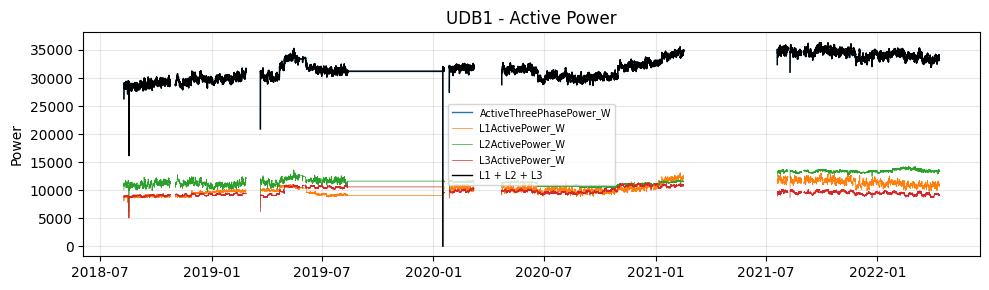

UDB1: MAPE = 0.2189%


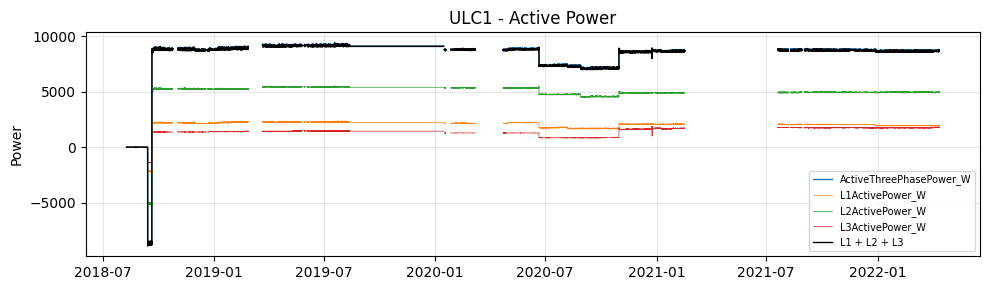

ULC1: MAPE = 0.4513%


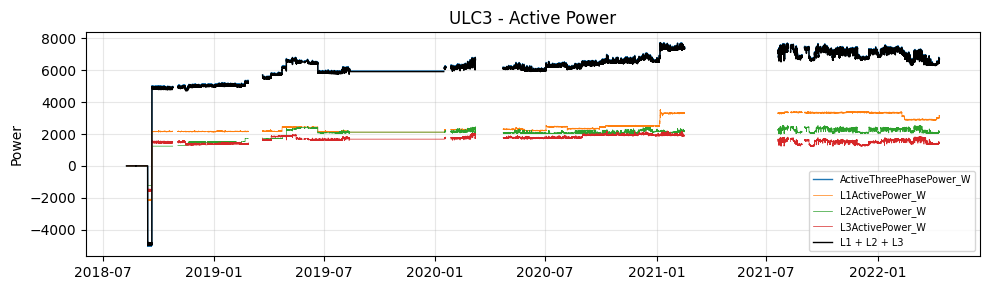

ULC3: MAPE = 0.6394%


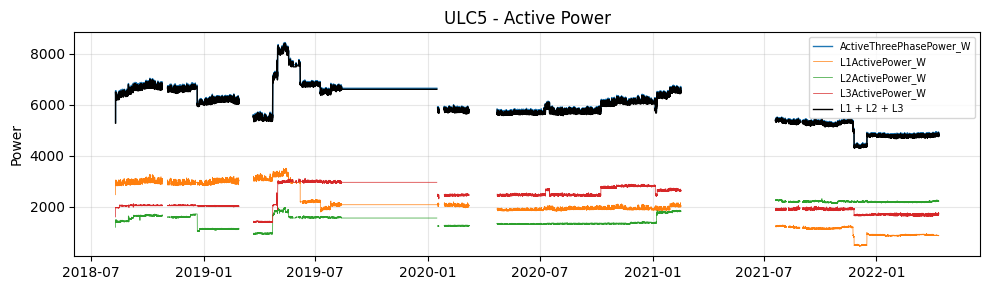

ULC5: MAPE = 0.6658%


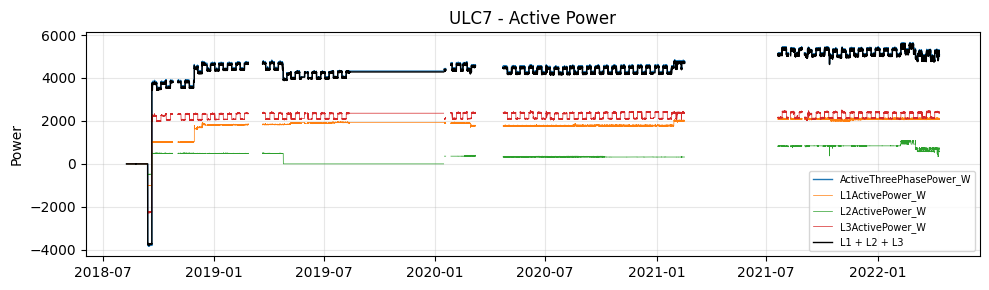

ULC7: MAPE = 0.9235%


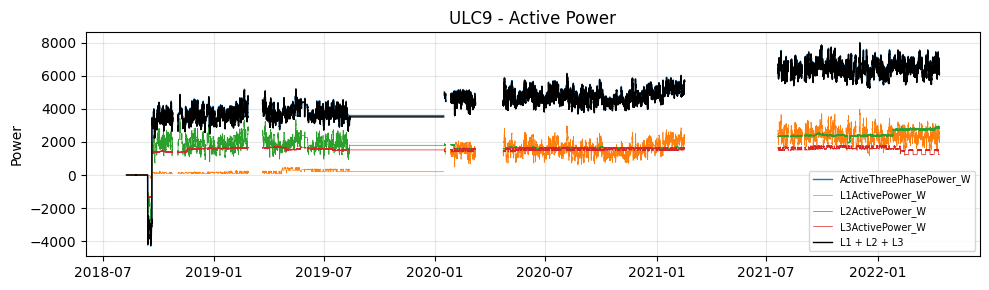

ULC9: MAPE = 1.0271%


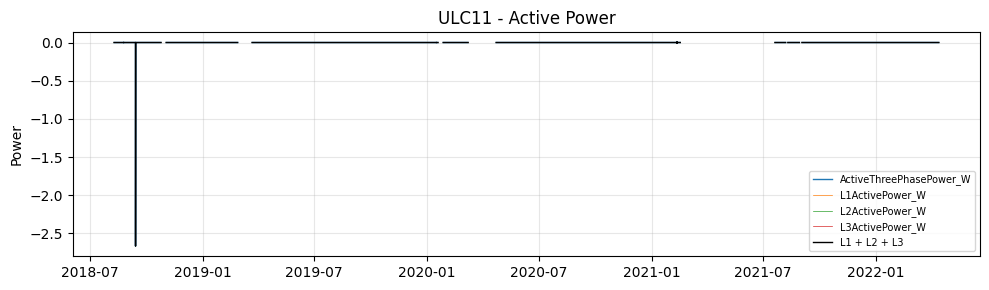

ULC11: MAPE = 0.0000%

UDB2 Branch - Active Power


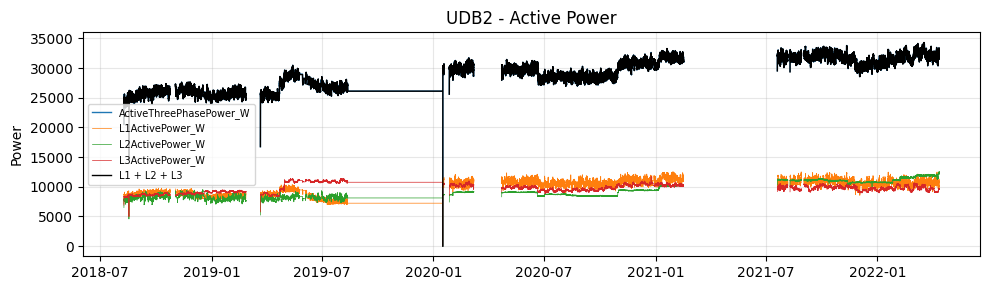

UDB2: MAPE = 0.1817%


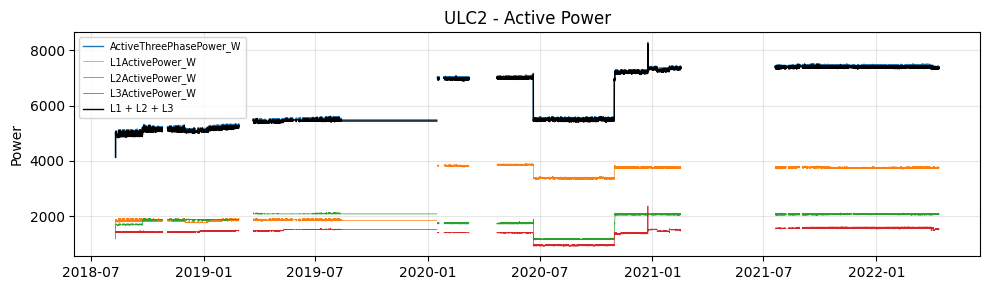

ULC2: MAPE = 0.6198%


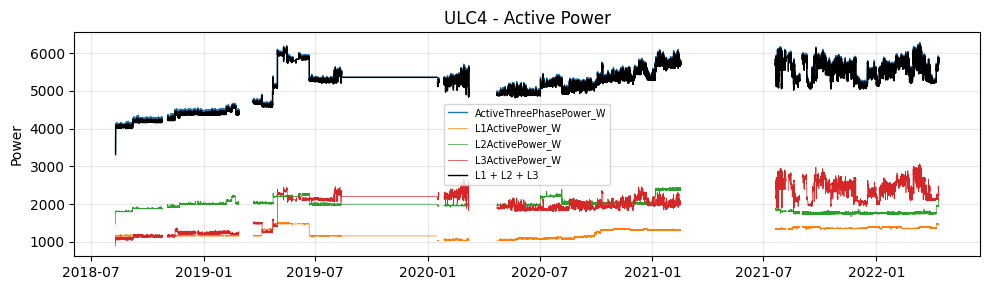

ULC4: MAPE = 0.6811%


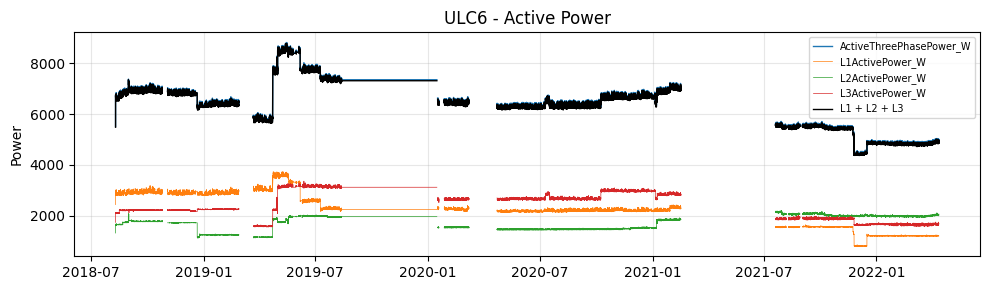

ULC6: MAPE = 0.6323%


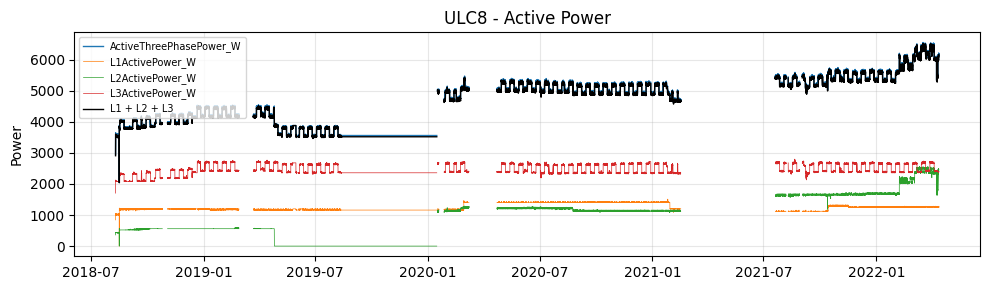

ULC8: MAPE = 0.8118%


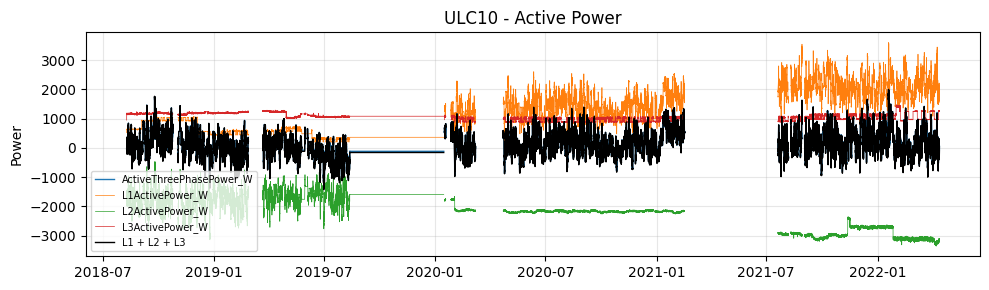

ULC10: MAPE = 17.4155%


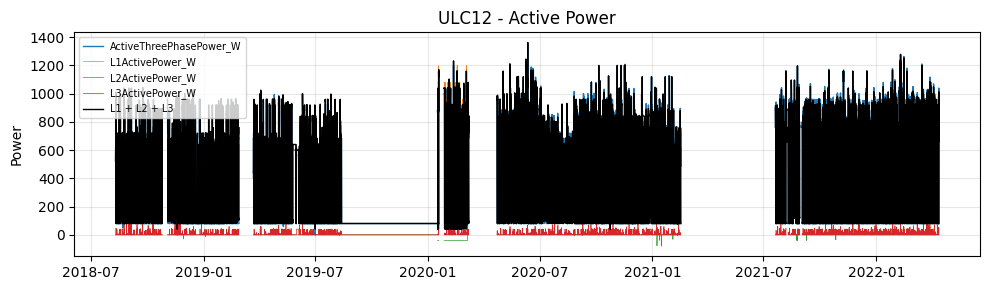

ULC12: MAPE = 3.6107%

ADB Branch - Active Power


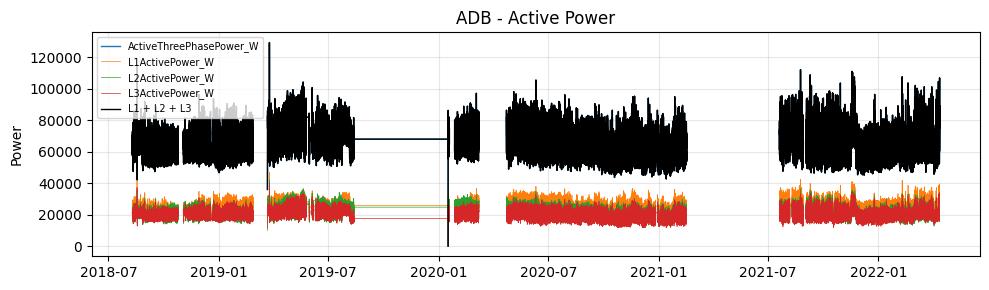

ADB: MAPE = 0.2060%


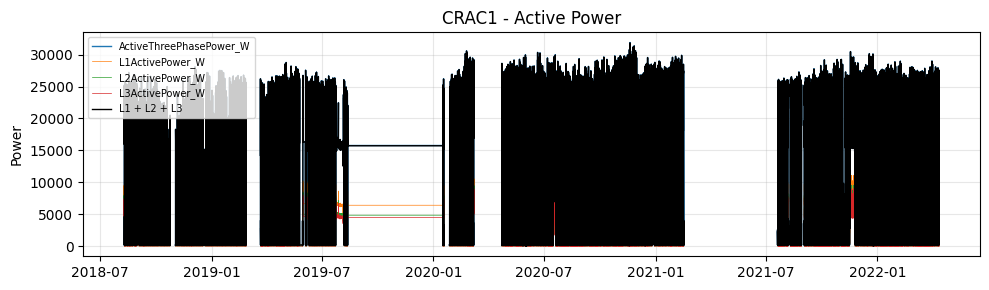

CRAC1: MAPE = 1.2143%


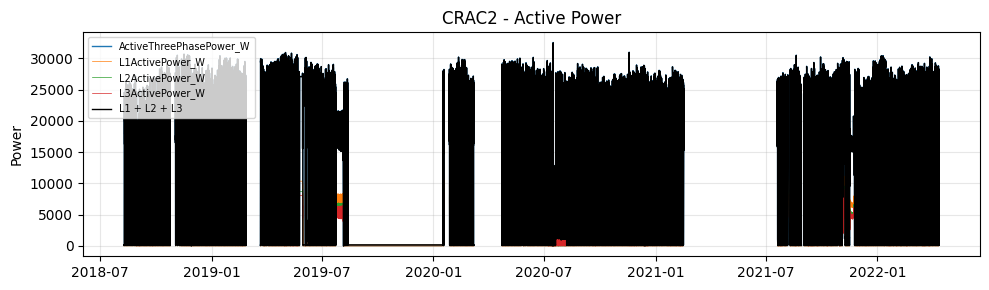

CRAC2: MAPE = 2.1151%


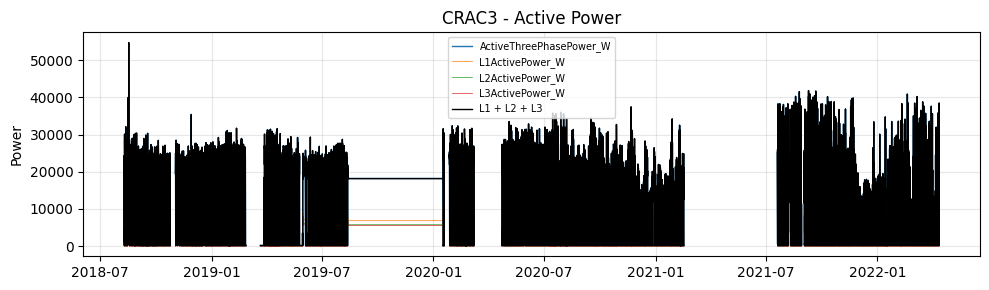

CRAC3: MAPE = 0.4486%


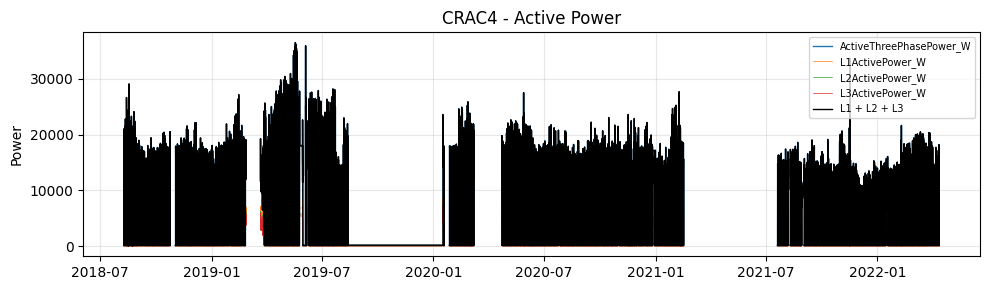

CRAC4: MAPE = 1.4352%


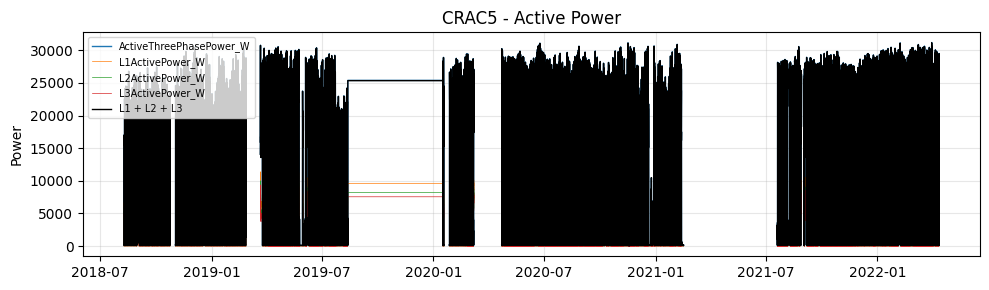

CRAC5: MAPE = 1.2644%


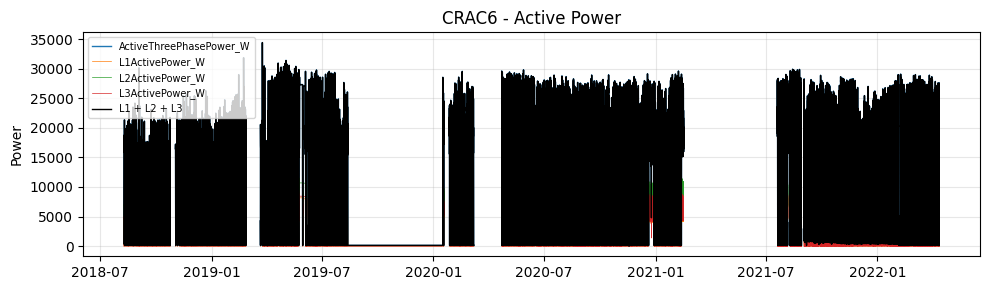

CRAC6: MAPE = 0.3317%

UDB1 Branch - Apparent Power


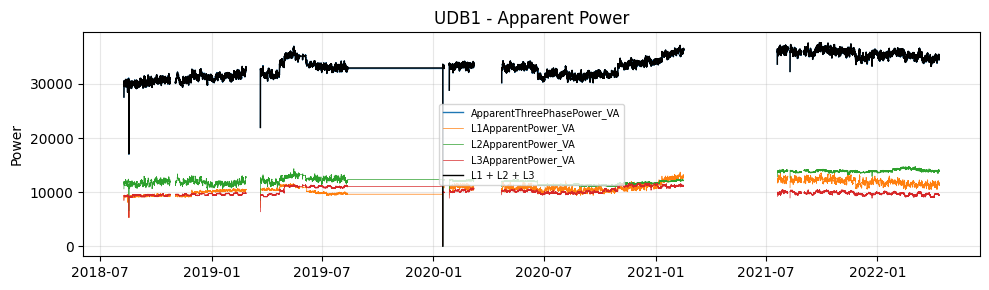

UDB1: MAPE = 0.2507%


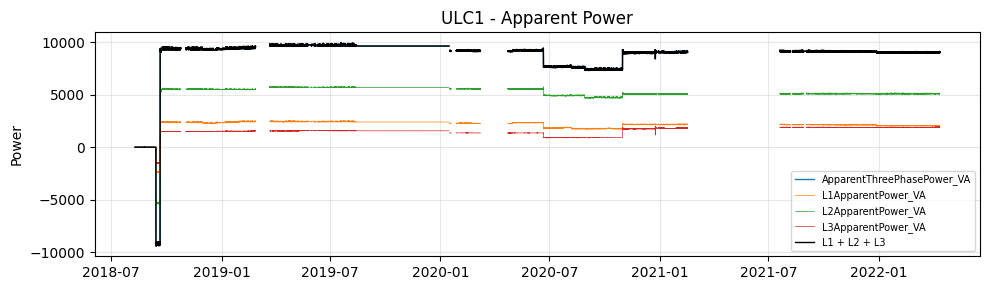

ULC1: MAPE = 0.0001%


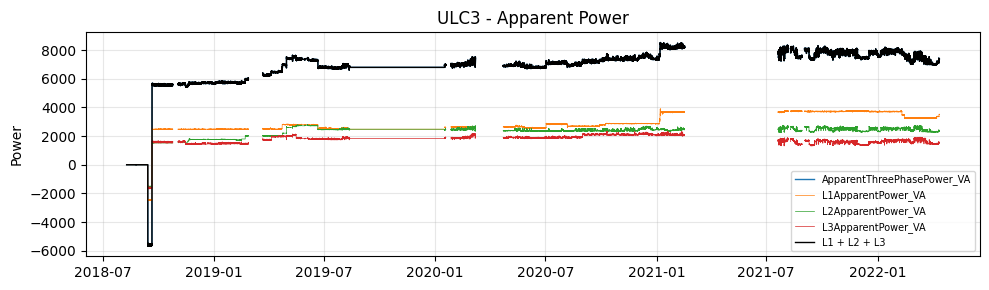

ULC3: MAPE = 0.0001%


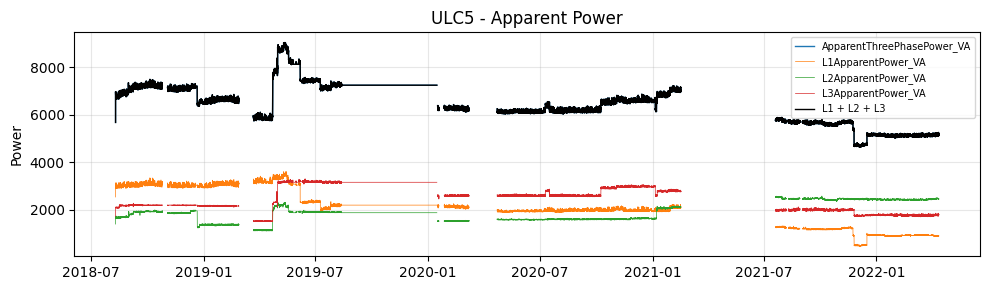

ULC5: MAPE = 0.0000%


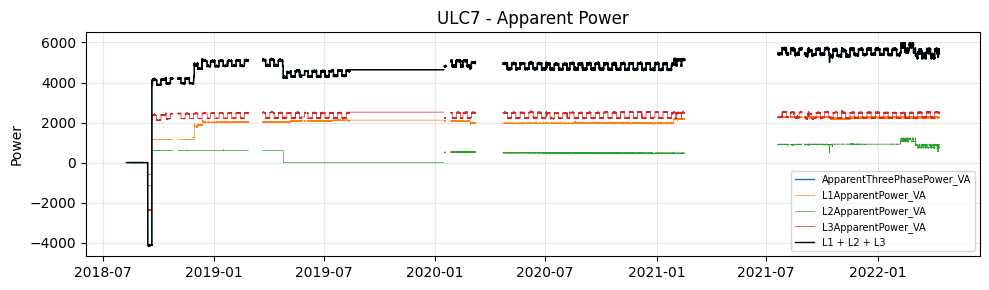

ULC7: MAPE = 0.0001%


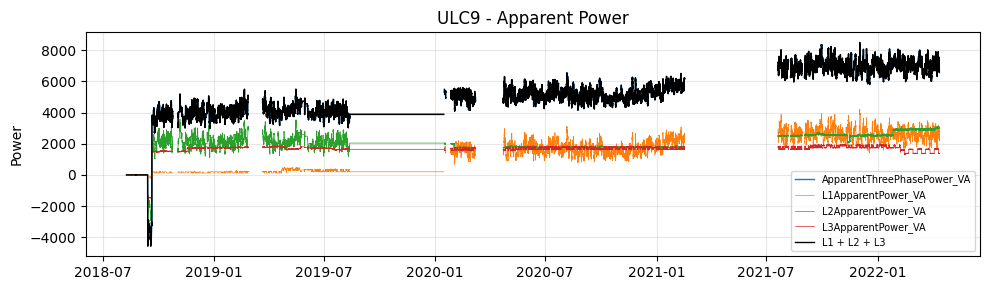

ULC9: MAPE = 0.0001%


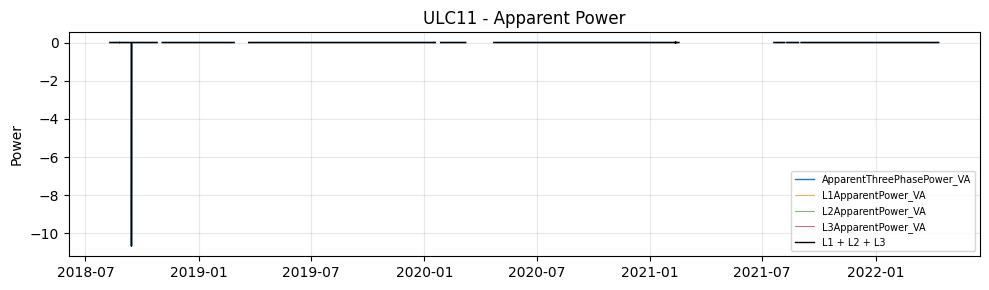

ULC11: MAPE = 0.0000%

UDB2 Branch - Apparent Power


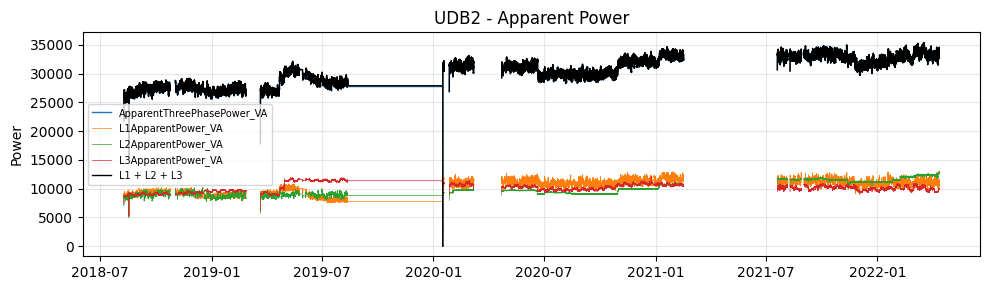

UDB2: MAPE = 0.2732%


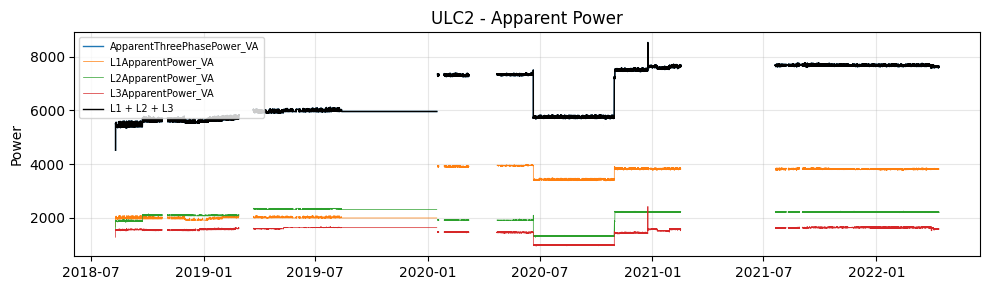

ULC2: MAPE = 0.0000%


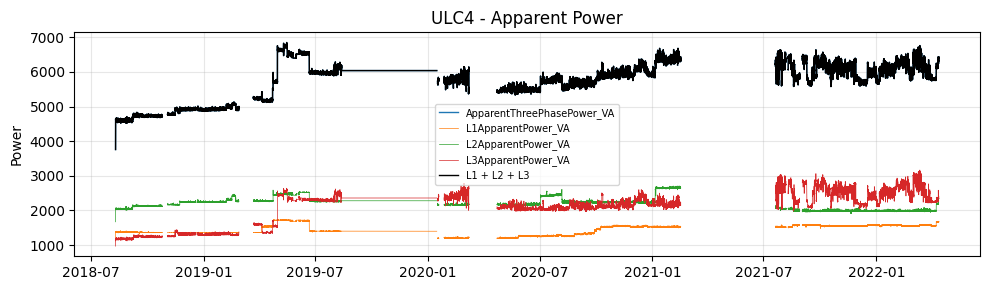

ULC4: MAPE = 0.0000%


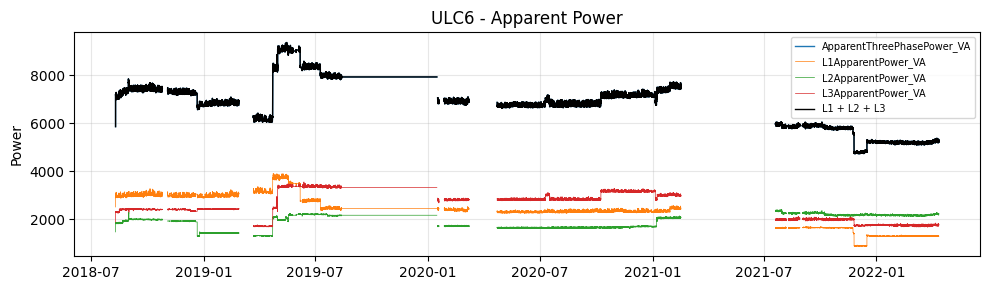

ULC6: MAPE = 0.0000%


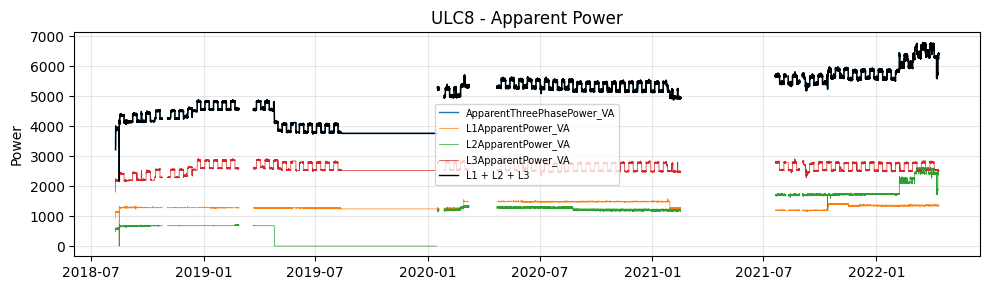

ULC8: MAPE = 0.0000%


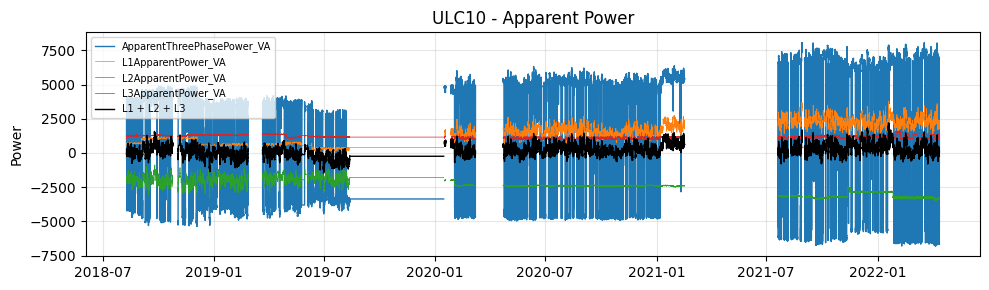

ULC10: MAPE = 92.6439%


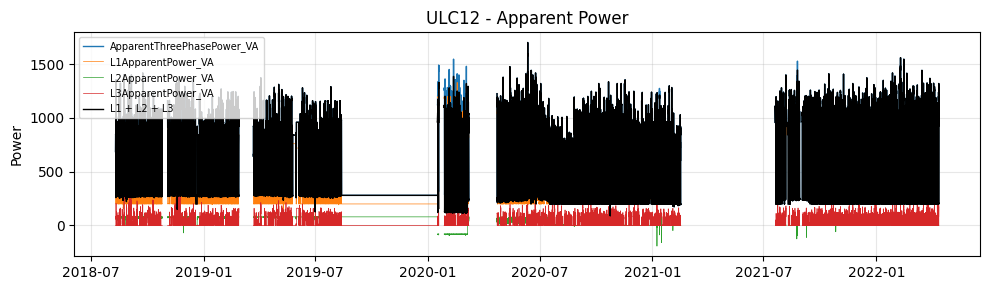

ULC12: MAPE = 1.1308%

ADB Branch - Apparent Power


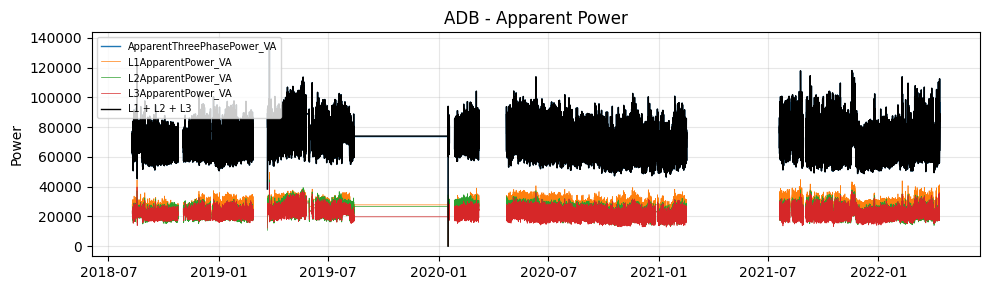

ADB: MAPE = 0.2594%


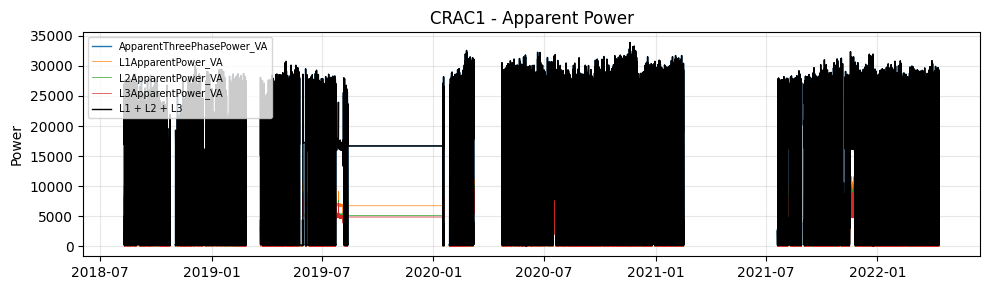

CRAC1: MAPE = 0.0020%


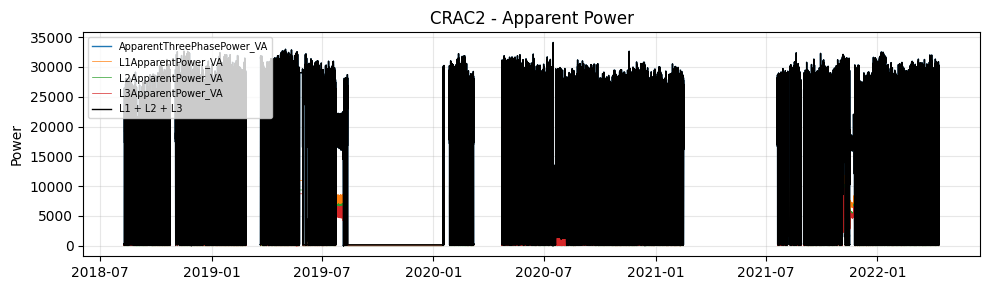

CRAC2: MAPE = 0.0057%


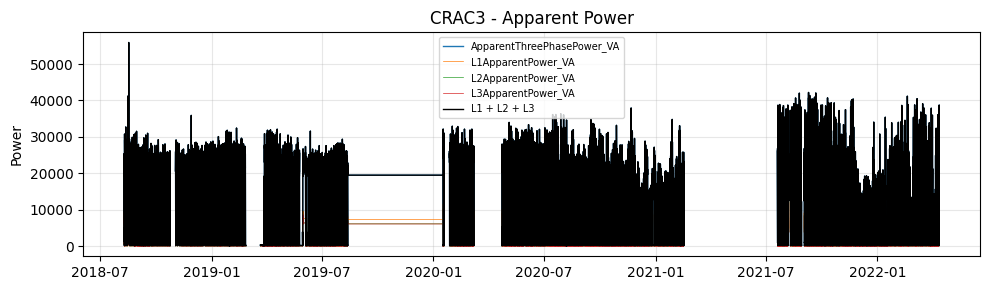

CRAC3: MAPE = 0.0000%


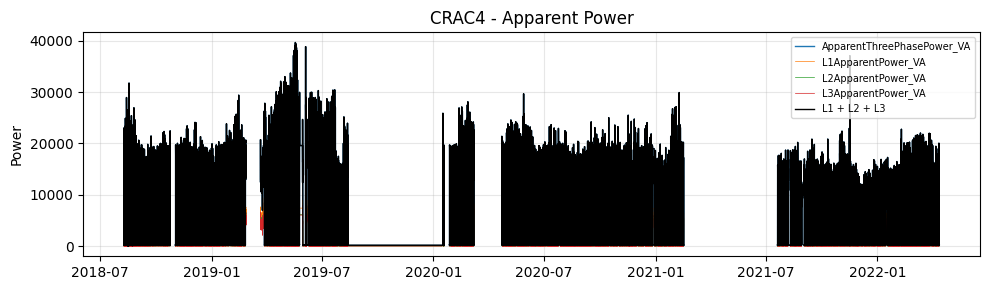

CRAC4: MAPE = 0.0000%


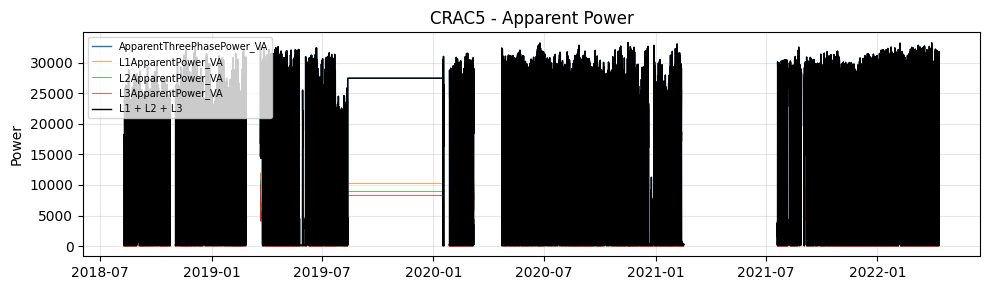

CRAC5: MAPE = 0.0002%


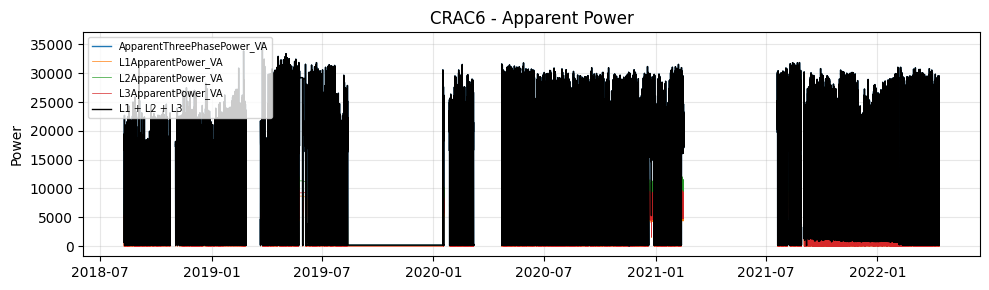

CRAC6: MAPE = 0.0000%

UDB1 Branch - Capacitive Reactive Power


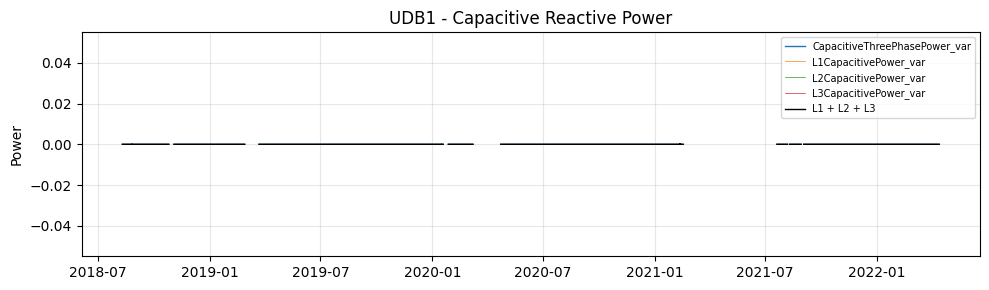

UDB1: MAPE = nan%


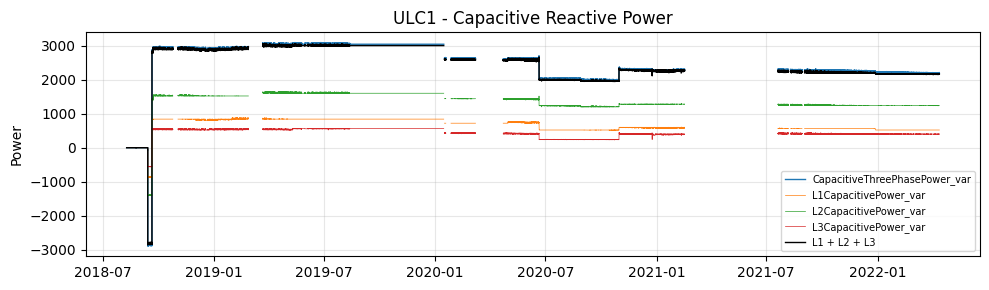

ULC1: MAPE = 1.5760%


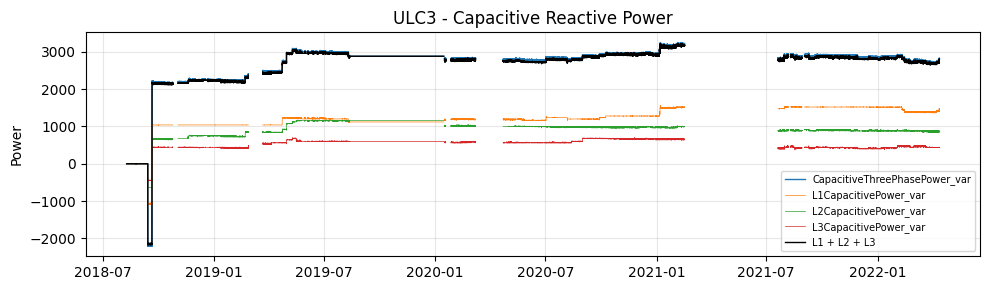

ULC3: MAPE = 1.0405%


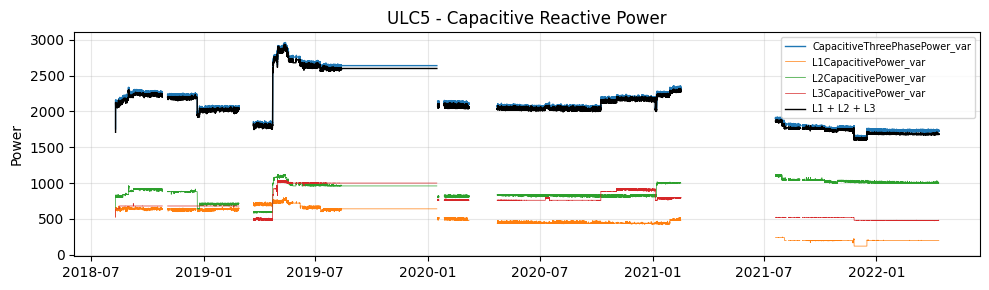

ULC5: MAPE = 1.7495%


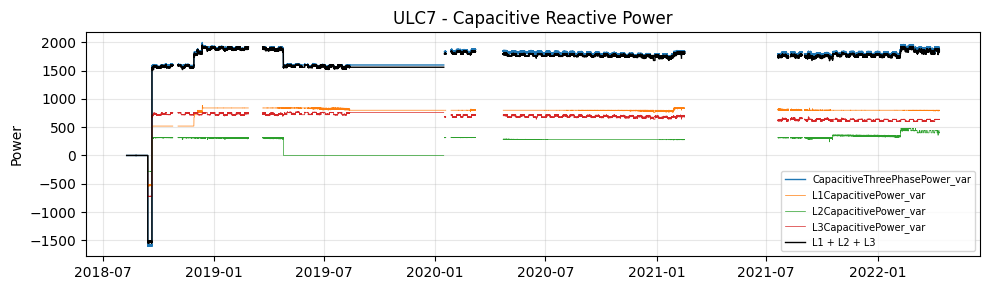

ULC7: MAPE = 1.8115%


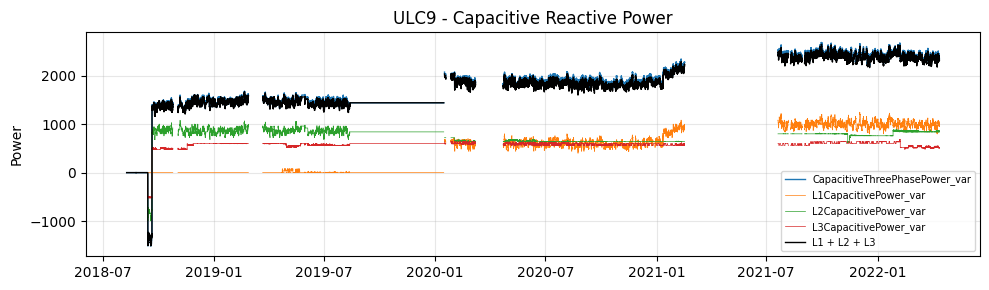

ULC9: MAPE = 1.8041%


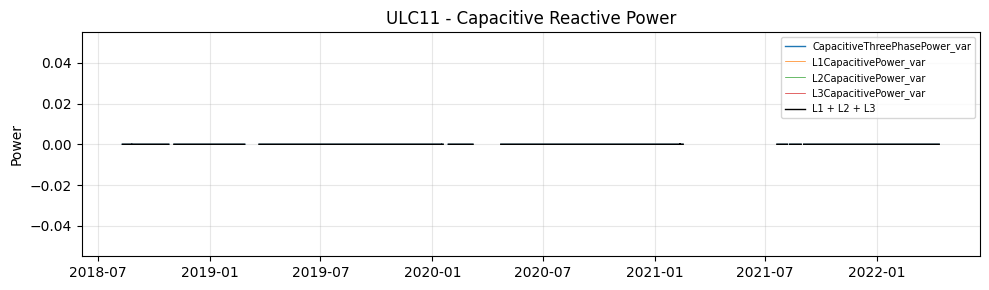

ULC11: MAPE = nan%

UDB2 Branch - Capacitive Reactive Power


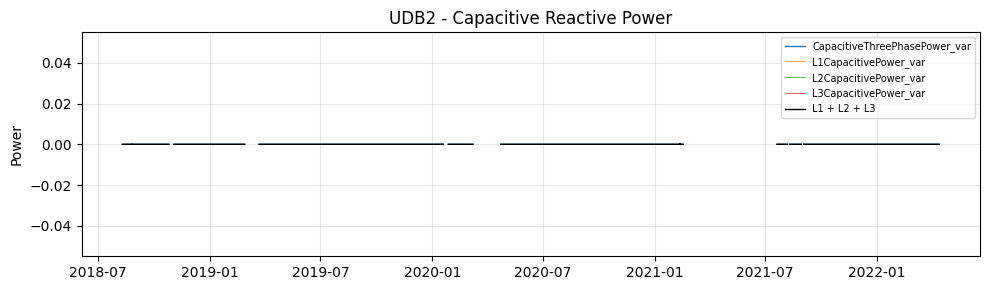

UDB2: MAPE = nan%


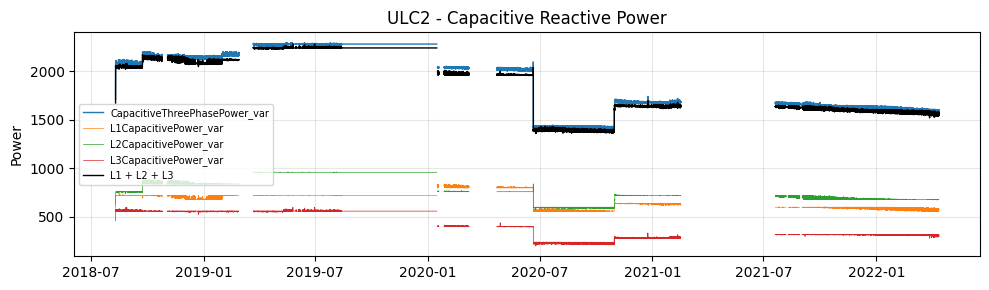

ULC2: MAPE = 2.0912%


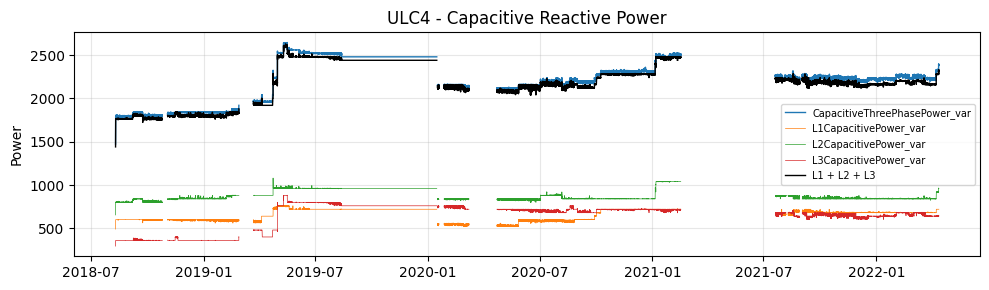

ULC4: MAPE = 1.8988%


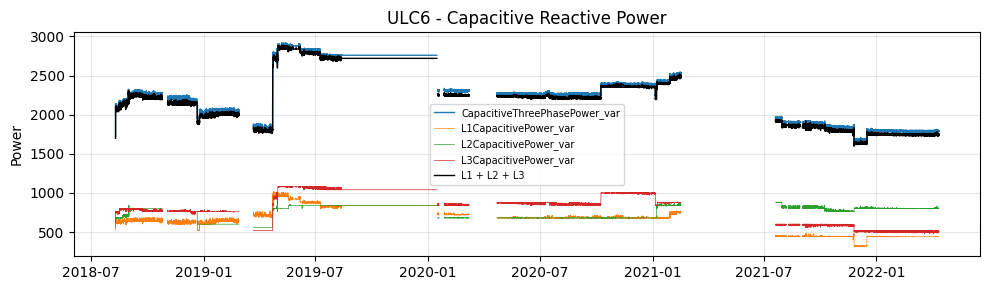

ULC6: MAPE = 1.8607%


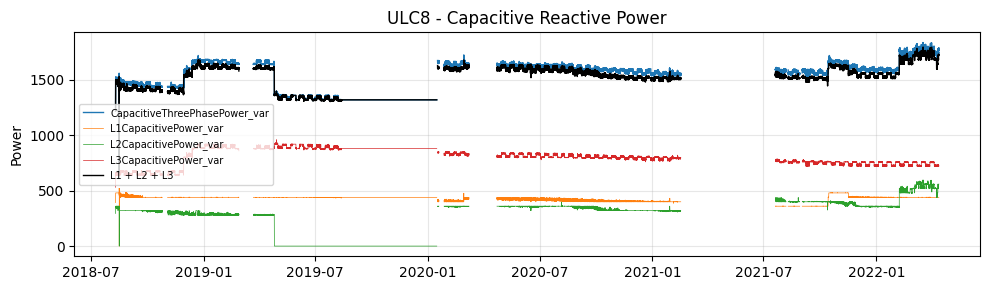

ULC8: MAPE = 2.1705%


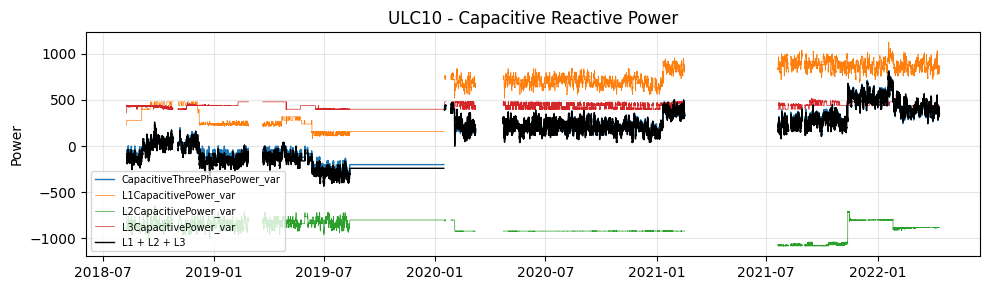

ULC10: MAPE = 17.3884%


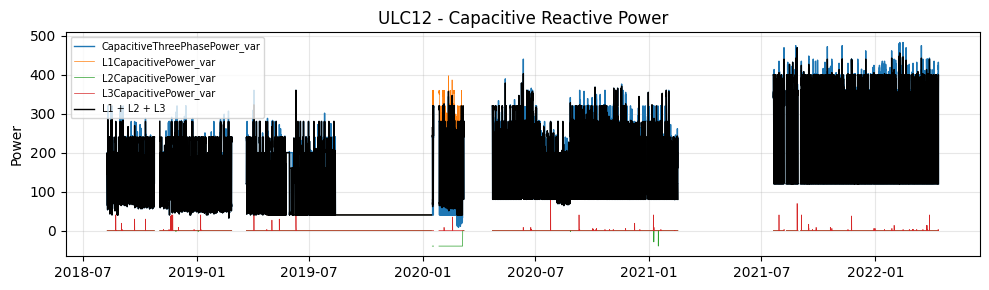

ULC12: MAPE = 2.3568%

ADB Branch - Capacitive Reactive Power


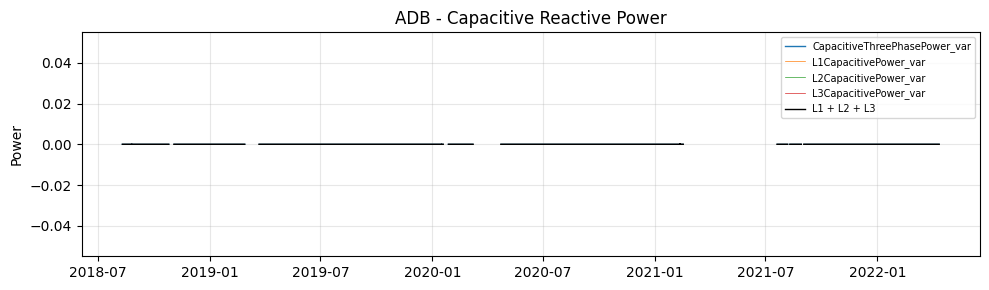

ADB: MAPE = nan%


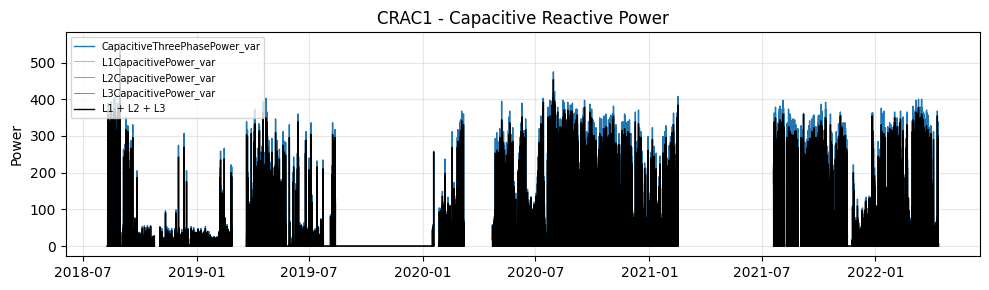

CRAC1: MAPE = 11.4845%


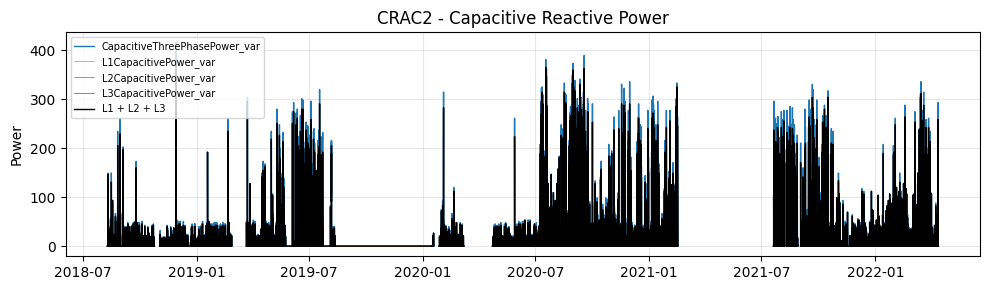

CRAC2: MAPE = 6.8084%


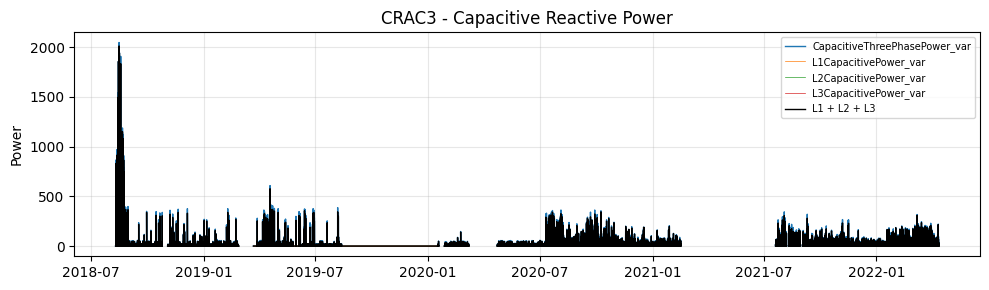

CRAC3: MAPE = 11.9879%


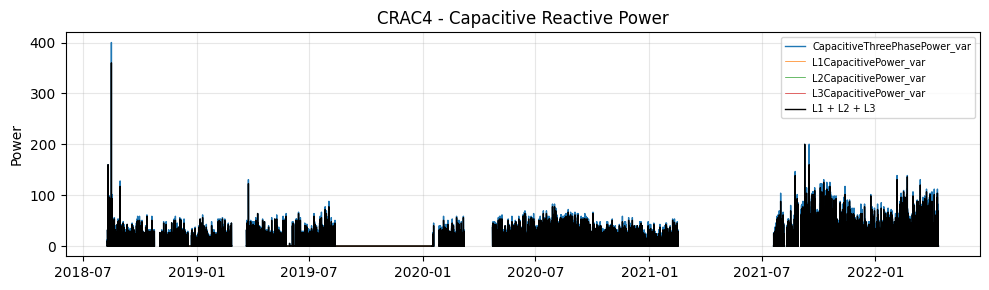

CRAC4: MAPE = 7.9263%


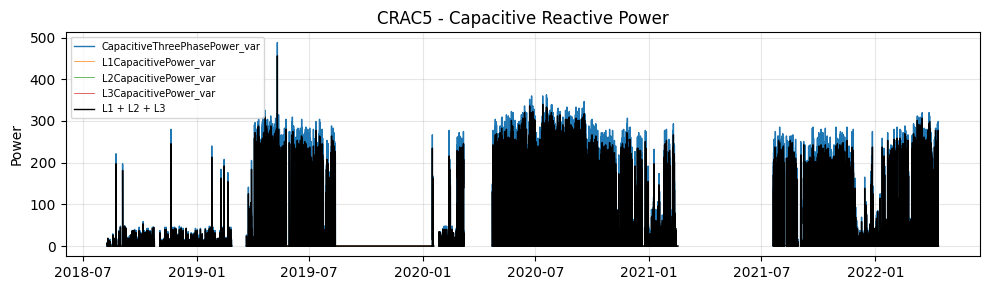

CRAC5: MAPE = 9.9972%


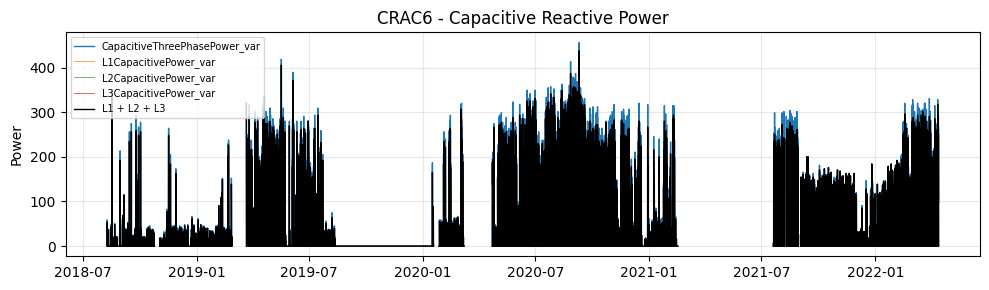

CRAC6: MAPE = 6.5886%

UDB1 Branch - Inductive Reactive Power


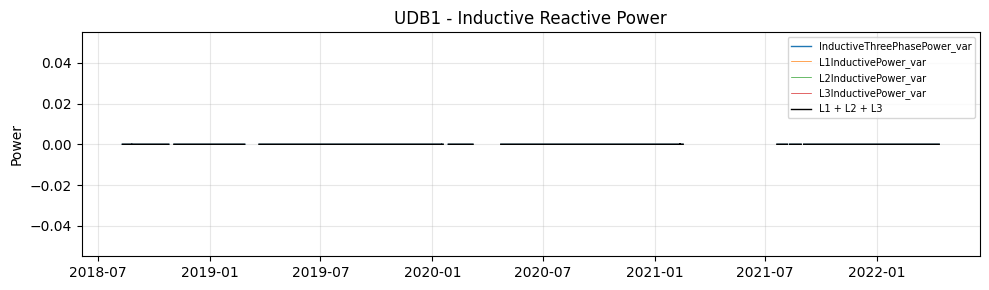

UDB1: MAPE = nan%


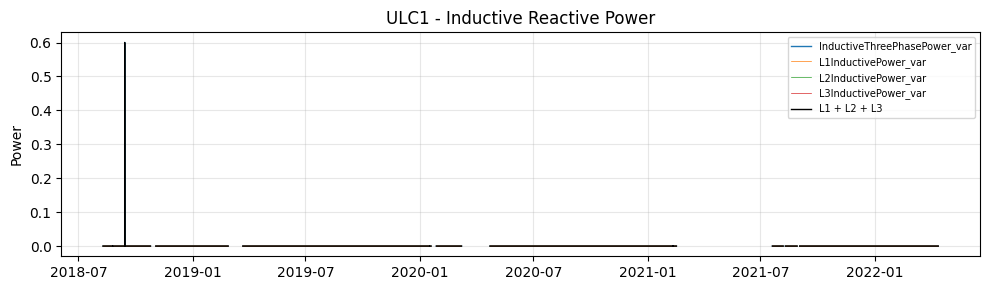

ULC1: MAPE = 0.0000%


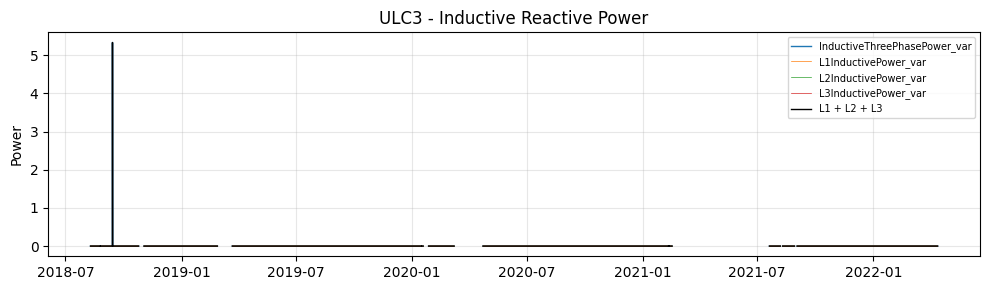

ULC3: MAPE = 0.0000%


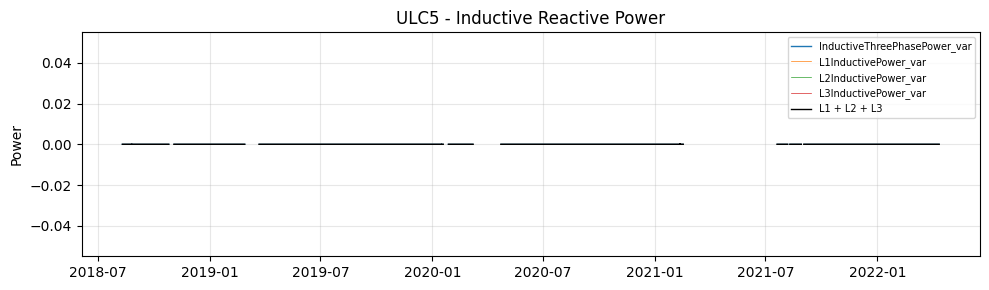

ULC5: MAPE = nan%


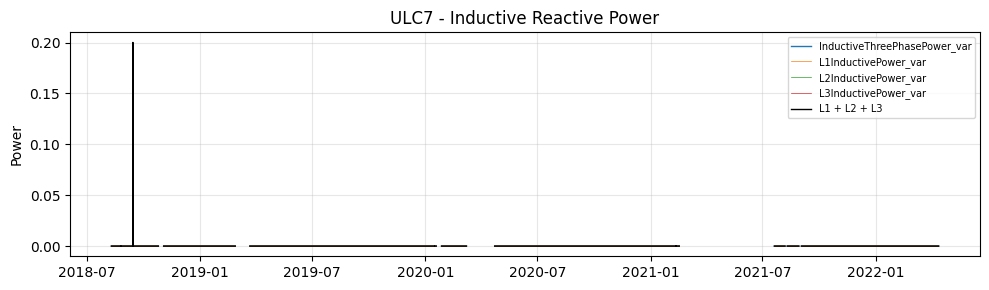

ULC7: MAPE = 0.0000%


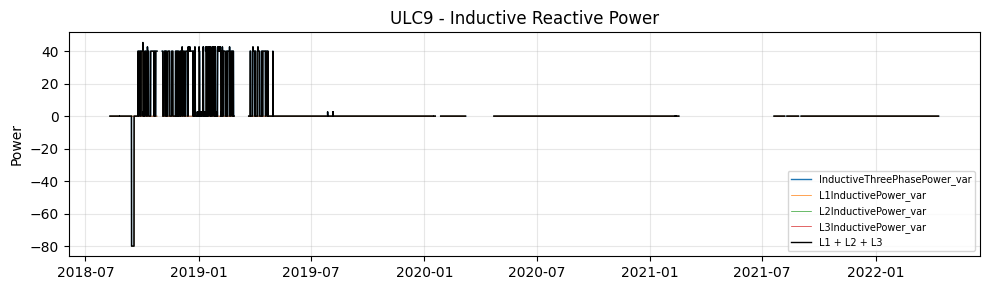

ULC9: MAPE = 0.0000%


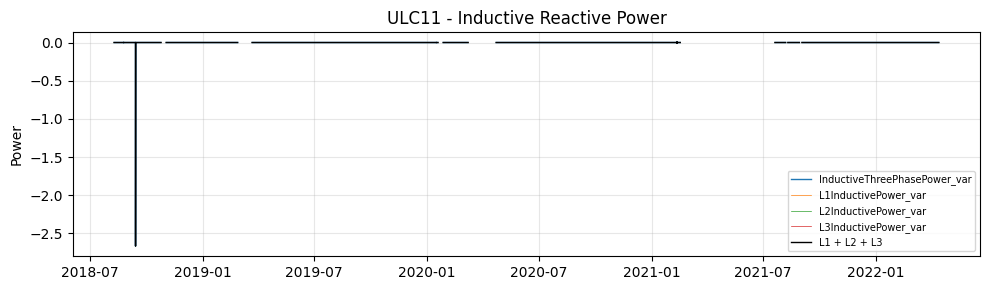

ULC11: MAPE = 0.0000%

UDB2 Branch - Inductive Reactive Power


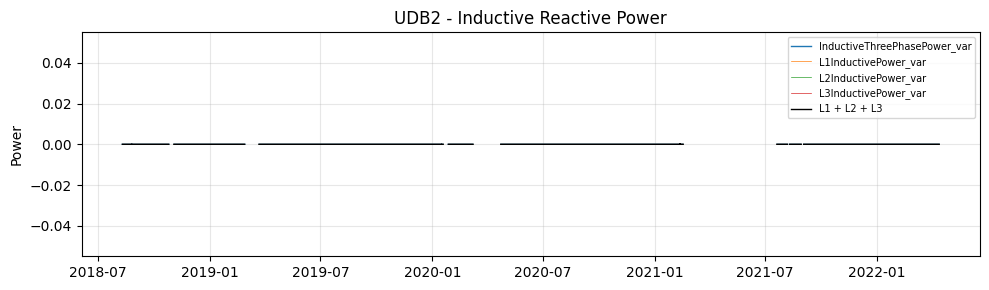

UDB2: MAPE = nan%


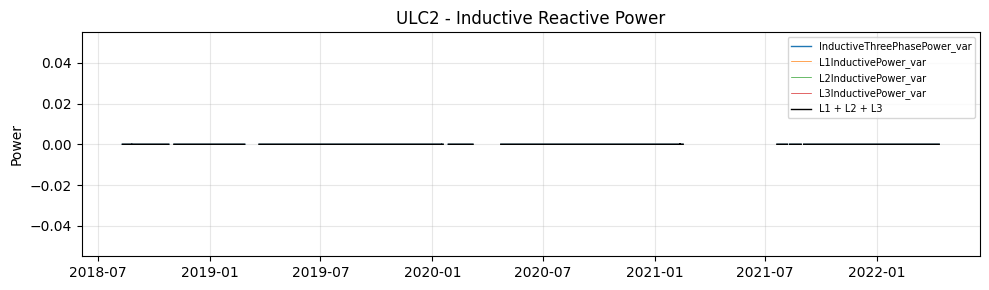

ULC2: MAPE = nan%


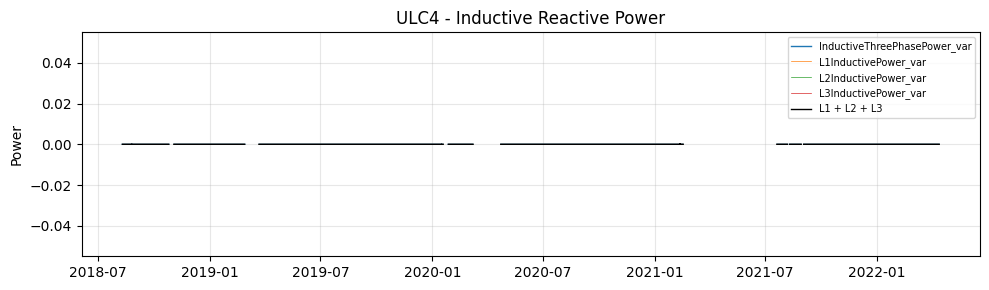

ULC4: MAPE = nan%


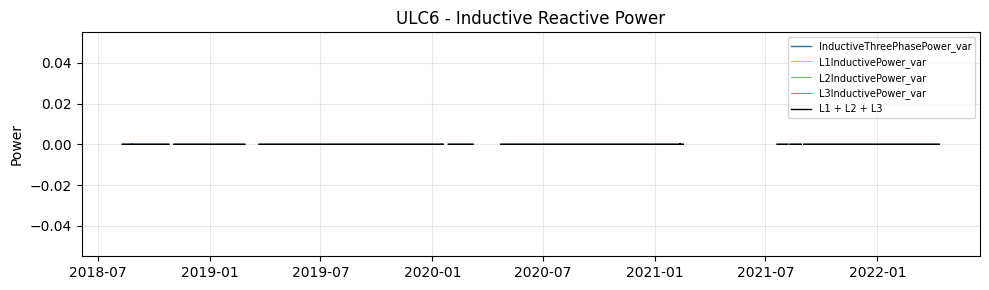

ULC6: MAPE = nan%


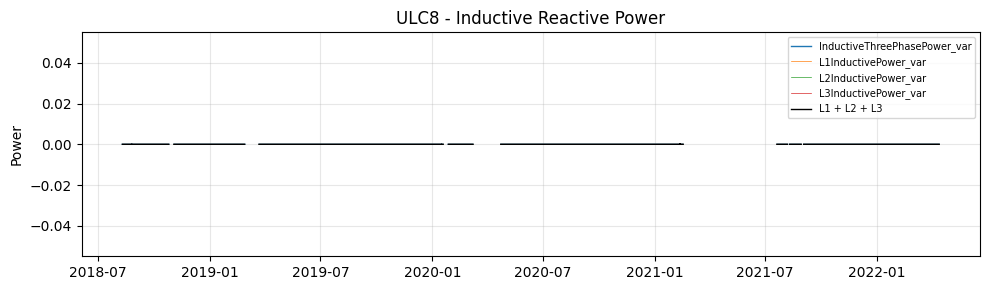

ULC8: MAPE = nan%


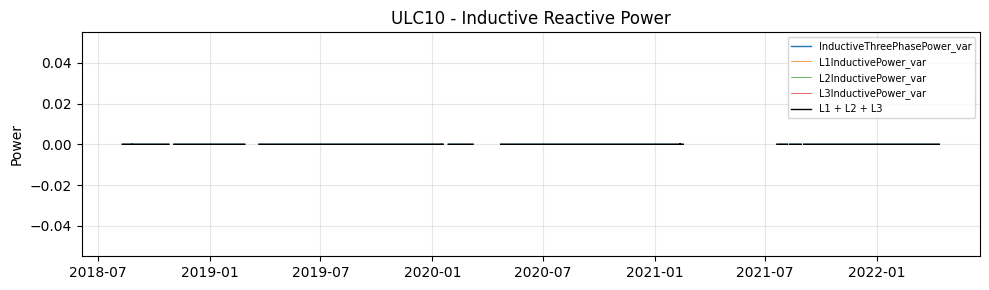

ULC10: MAPE = nan%


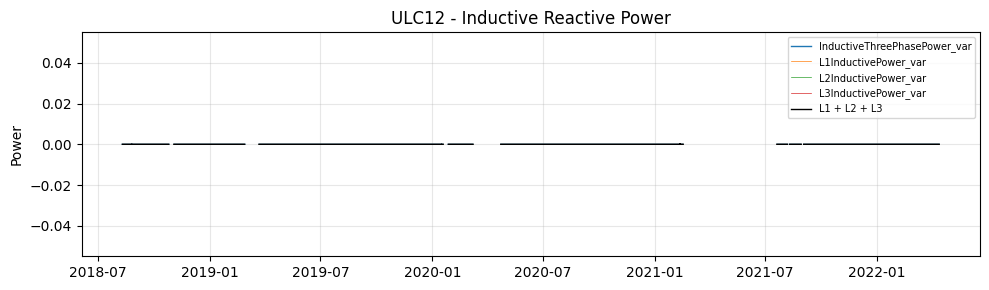

ULC12: MAPE = nan%

ADB Branch - Inductive Reactive Power


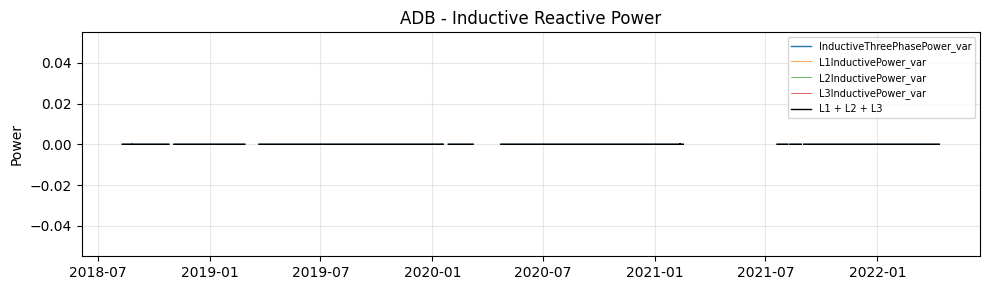

ADB: MAPE = nan%


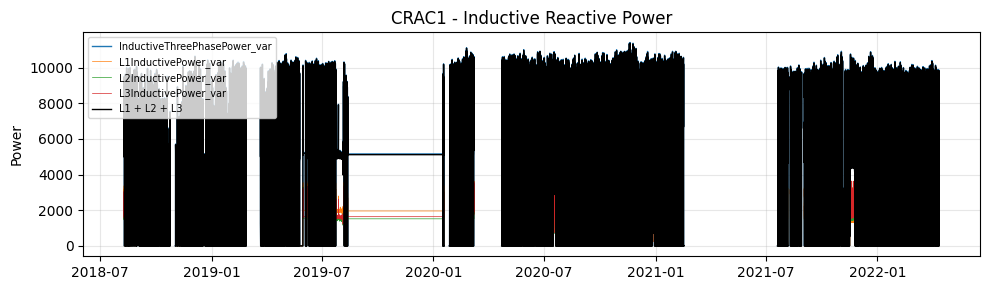

CRAC1: MAPE = 0.7575%


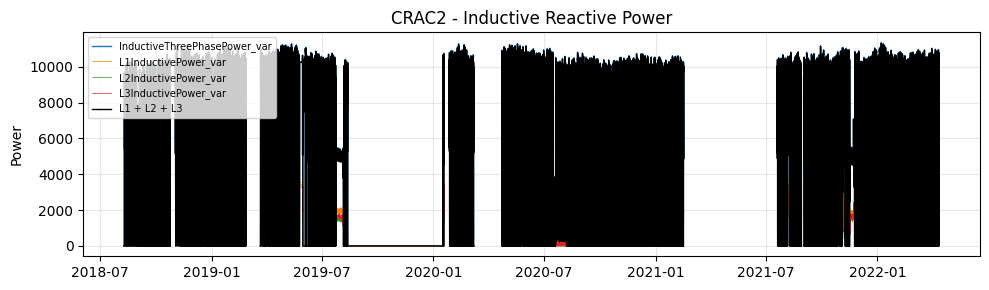

CRAC2: MAPE = 0.5894%


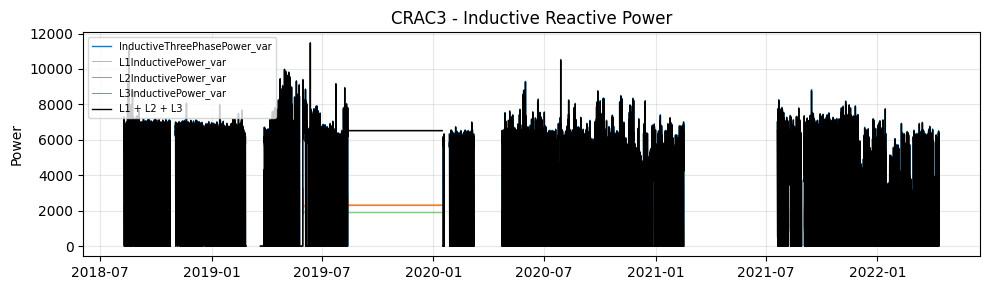

CRAC3: MAPE = 0.5402%


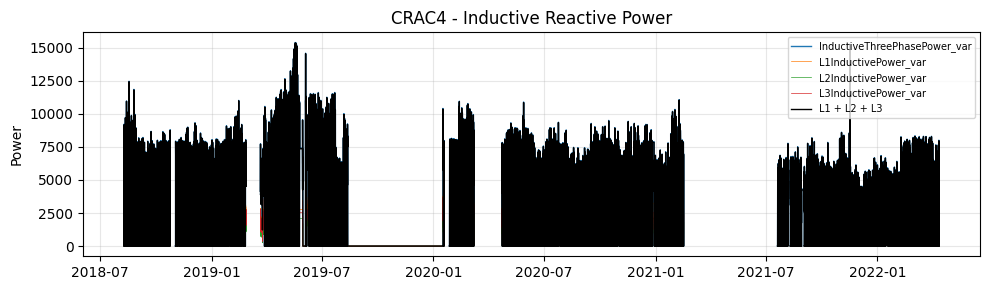

CRAC4: MAPE = 0.7567%


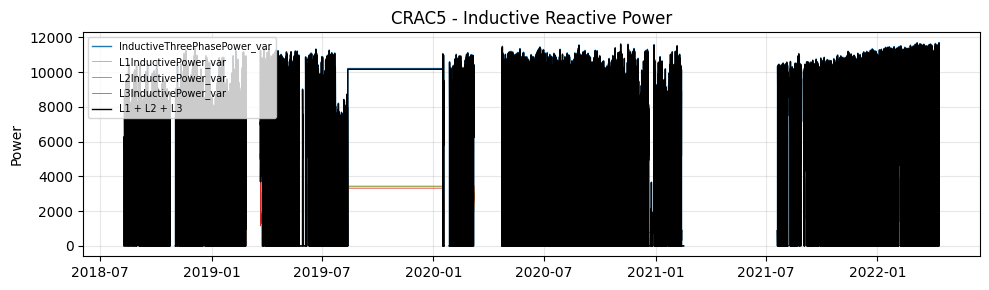

CRAC5: MAPE = 0.5314%


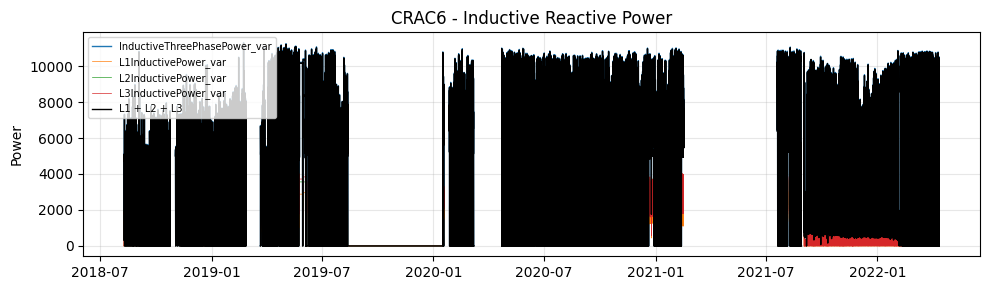

CRAC6: MAPE = 0.5785%


In [4]:
# =============================================================================
# Plot Three-Phase Power Validation
# =============================================================================

import matplotlib.pyplot as plt

for power_type, config in POWER_VALIDATION_CONFIG.items():
    three_phase, phases = config["three_phase"], config["phases"]

    for group_name, devices in GROUPS.items():
        print(f"\n{'=' * 60}\n{group_name} - {power_type}\n{'=' * 60}")

        for device in devices:
            df = datasets[device]
            phase_cols = [c for c in phases if c in df.columns]
            phase_sum = df[phase_cols].sum(axis=1)

            # Downsample only for plotting; validation remains full resolution
            plot_df = pd.DataFrame({
                three_phase: df[three_phase],
                **{col: df[col] for col in phase_cols},
                "Phase Sum": phase_sum
            }).resample("15min").mean()

            fig, ax = plt.subplots(figsize=(10, 3))
            ax.plot(plot_df.index, plot_df[three_phase], label=three_phase, linewidth=1)
            for col in phase_cols:
                ax.plot(plot_df.index, plot_df[col], linewidth=0.5, label=col)
            ax.plot(plot_df.index, plot_df["Phase Sum"], color="black", linewidth=1, label="L1 + L2 + L3")

            ax.set(title=f"{device} - {power_type}", ylabel="Power")
            ax.grid(True, alpha=0.3)
            ax.legend(fontsize=7)
            plt.tight_layout()
            plt.show()
            plt.close(fig)

            valid = df[three_phase] != 0
            mape = ((df.loc[valid, three_phase] - phase_sum.loc[valid]).abs() /
                    df.loc[valid, three_phase].abs()).mean() * 100

            print(f"{device}: MAPE = {mape:.4f}%")

# Reconstruct Active Power for ULC10 and ULC12

ULC10 and ULC12 have an inverted L2 active-power sign relative to the three-phase total.

For these devices, reconstruct three-phase active power as:

**P₃φ = L1 − L2 + L3**

The reconstructed value is compared with the recorded `ActiveThreePhasePower_W` to verify whether the sign inversion explains the discrepancy.

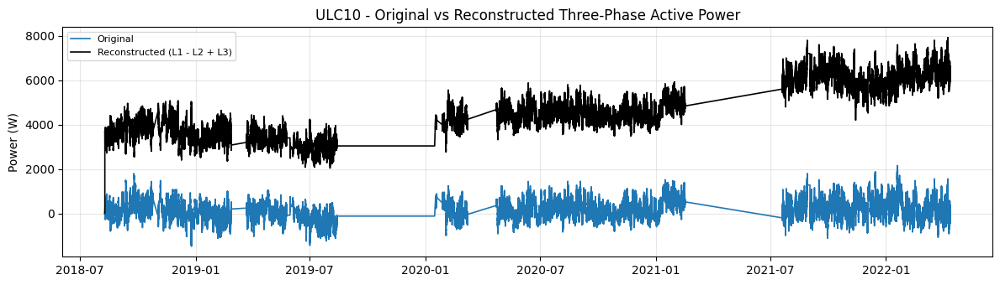

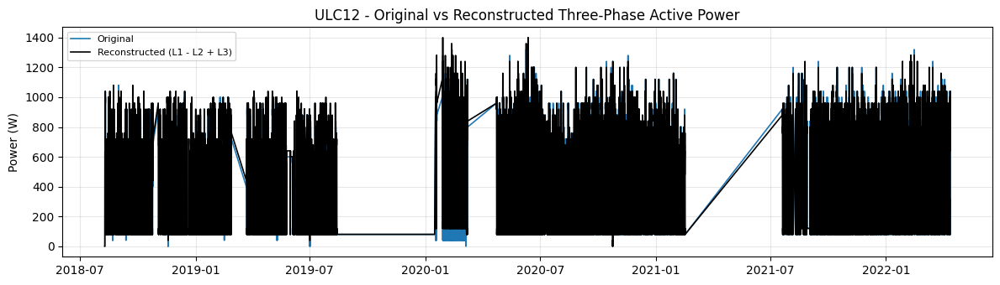

In [5]:
# =============================================================================
# Reconstruct ULC10 and ULC12 Three-Phase Active Power
# =============================================================================

import matplotlib.pyplot as plt

for device in ["ULC10", "ULC12"]:
    df = datasets[device].copy()
    df["L2ActivePower_W"] *= -1
    df["ReconstructedActiveThreePhasePower_W"] = df[
        ["L1ActivePower_W", "L2ActivePower_W", "L3ActivePower_W"]
    ].sum(axis=1)

    fig, ax = plt.subplots(figsize=(12, 3.5))
    ax.plot(df.index, df["ActiveThreePhasePower_W"], label="Original", linewidth=1.2)
    ax.plot(df.index, df["ReconstructedActiveThreePhasePower_W"], label="Reconstructed (L1 - L2 + L3)",
            color="black", linewidth=1.2)
    ax.set(title=f"{device} - Original vs Reconstructed Three-Phase Active Power", ylabel="Power (W)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

## Diagnose apparent power for ULC10

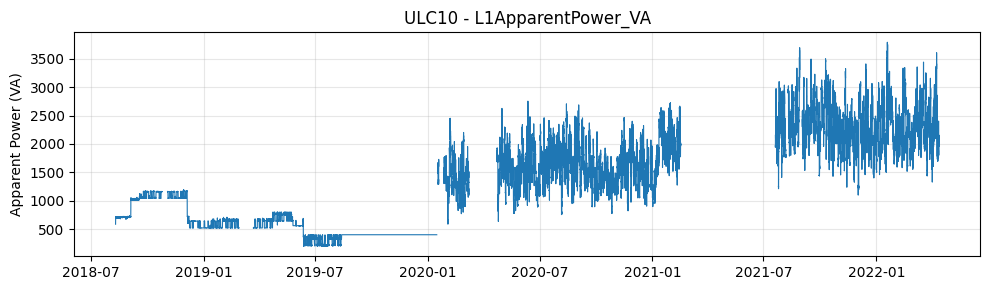

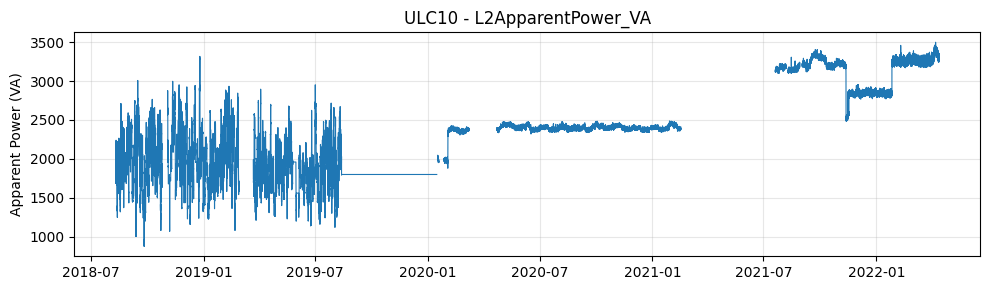

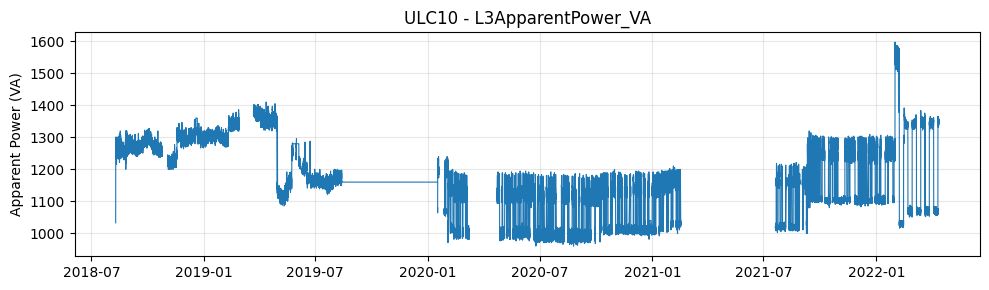

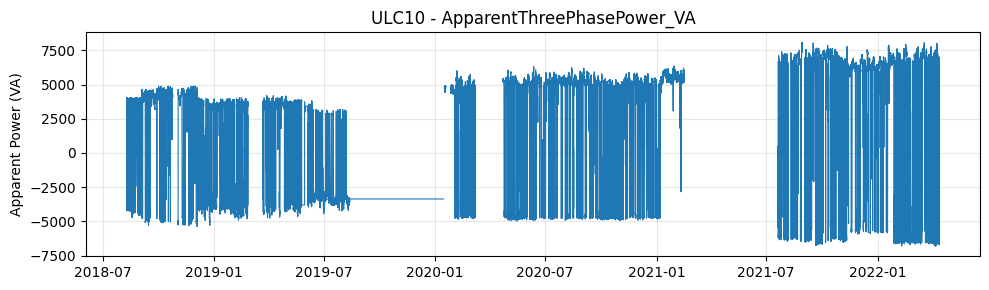

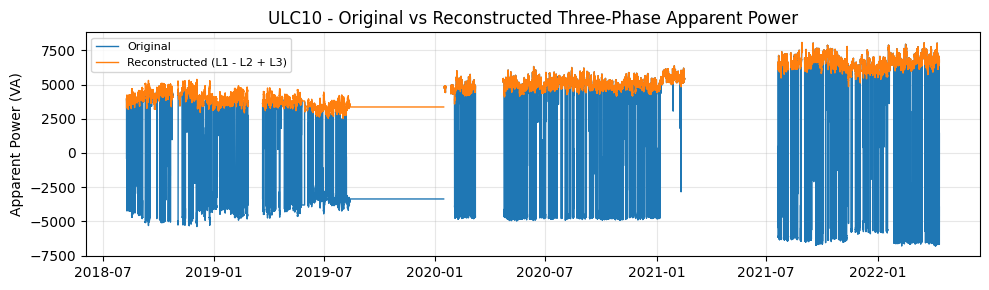

In [6]:
# =============================================================================
# ULC10 - Apparent Power Validation
# =============================================================================

import matplotlib.pyplot as plt

df = datasets["ULC10"].copy()
phase_cols = ["L1ApparentPower_VA", "L2ApparentPower_VA", "L3ApparentPower_VA"]
plot_cols = phase_cols + ["ApparentThreePhasePower_VA"]

# Reconstruct using corrected L2 sign
df["L2ApparentPower_VA"] *= -1
df["ReconstructedApparentThreePhasePower_VA"] = df[phase_cols].sum(axis=1)

# Downsample only for plotting
plot_df = df[plot_cols + ["ReconstructedApparentThreePhasePower_VA"]].resample("15min").mean()

# Individual components
for col in plot_cols:
    fig, ax = plt.subplots(figsize=(10, 3))
    ax.plot(plot_df.index, plot_df[col], linewidth=0.8)
    ax.set(title=f"ULC10 - {col}", ylabel="Apparent Power (VA)")
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

# Original vs reconstructed three-phase power
fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(plot_df.index, plot_df["ApparentThreePhasePower_VA"], label="Original", linewidth=1)
ax.plot(plot_df.index, plot_df["ReconstructedApparentThreePhasePower_VA"], label="Reconstructed (L1 - L2 + L3)",
        linewidth=1)
ax.set(title="ULC10 - Original vs Reconstructed Three-Phase Apparent Power", ylabel="Apparent Power (VA)")
ax.grid(True, alpha=0.3)
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()
plt.close(fig)

## Diagnose capacitative Power for ULC10

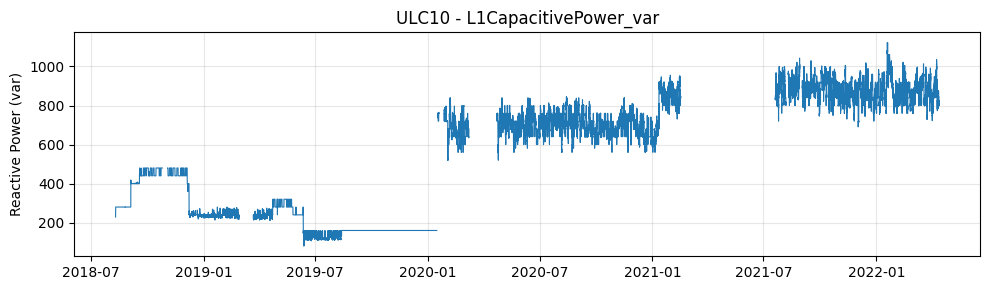

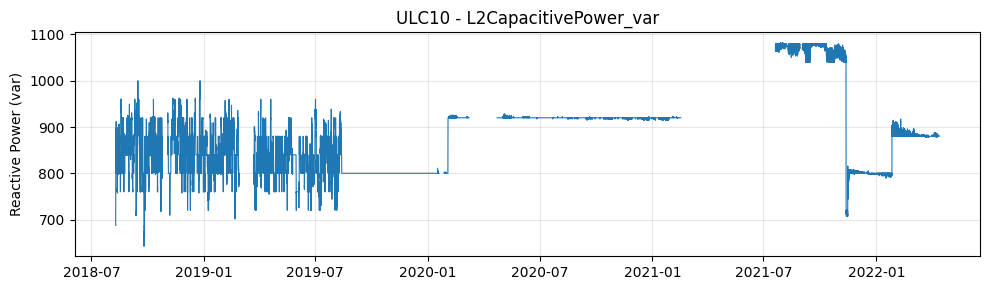

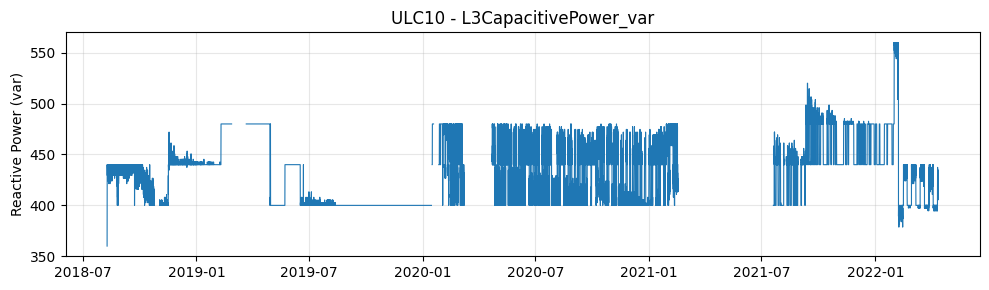

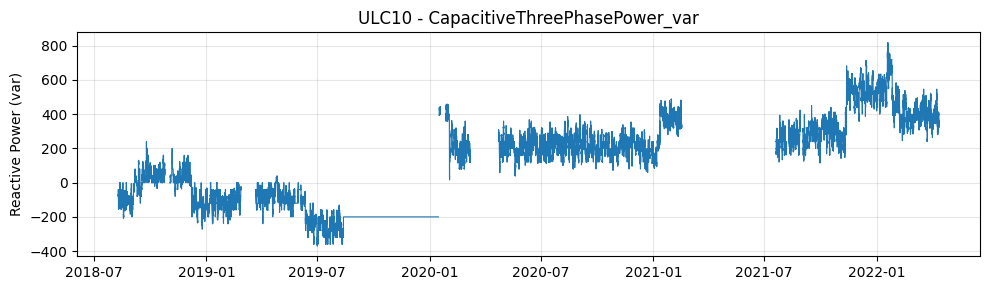

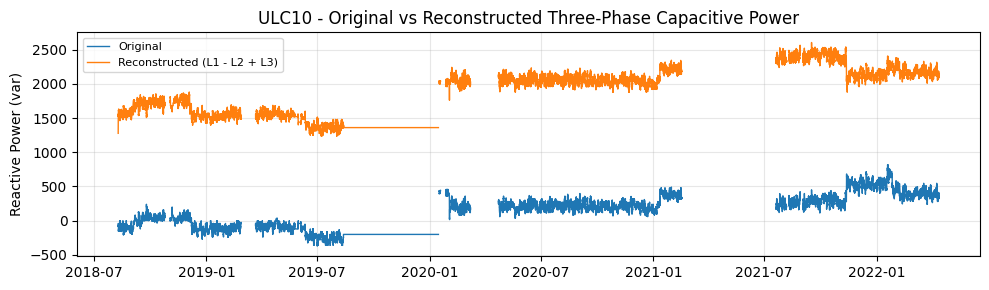

In [7]:
# =============================================================================
# ULC10 - Capacitive Reactive Power Validation
# =============================================================================

df = datasets["ULC10"].copy()
phase_cols = ["L1CapacitivePower_var", "L2CapacitivePower_var", "L3CapacitivePower_var"]
three_phase = "CapacitiveThreePhasePower_var"

# Correct L2 sign and reconstruct three-phase capacitive power
df["L2CapacitivePower_var"] *= -1
df["ReconstructedCapacitiveThreePhasePower_var"] = df[phase_cols].sum(axis=1)

# Downsample only for plotting
plot_cols = phase_cols + [three_phase, "ReconstructedCapacitiveThreePhasePower_var"]
plot_df = df[plot_cols].resample("15min").mean()

# Individual components
for col in phase_cols + [three_phase]:
    fig, ax = plt.subplots(figsize=(10, 3))
    ax.plot(plot_df.index, plot_df[col], linewidth=0.8)
    ax.set(title=f"ULC10 - {col}", ylabel="Reactive Power (var)")
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    plt.close(fig)

# Original vs reconstructed three-phase power
fig, ax = plt.subplots(figsize=(10, 3))
ax.plot(plot_df.index, plot_df[three_phase], label="Original", linewidth=1)
ax.plot(plot_df.index, plot_df["ReconstructedCapacitiveThreePhasePower_var"],
        label="Reconstructed (L1 - L2 + L3)", linewidth=1)
ax.set(title="ULC10 - Original vs Reconstructed Three-Phase Capacitive Power",
       ylabel="Reactive Power (var)")
ax.grid(True, alpha=0.3)
ax.legend(fontsize=8)
plt.tight_layout()
plt.show()
plt.close(fig)

## Child-Parent Relationships for 3-phase Powers:


UDB1 - Active Power
L1ActivePower_W: MAPE = 8.0109%


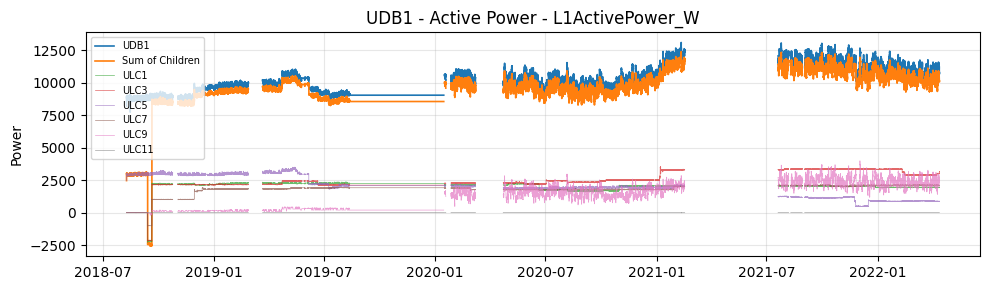

L2ActivePower_W: MAPE = 9.2386%


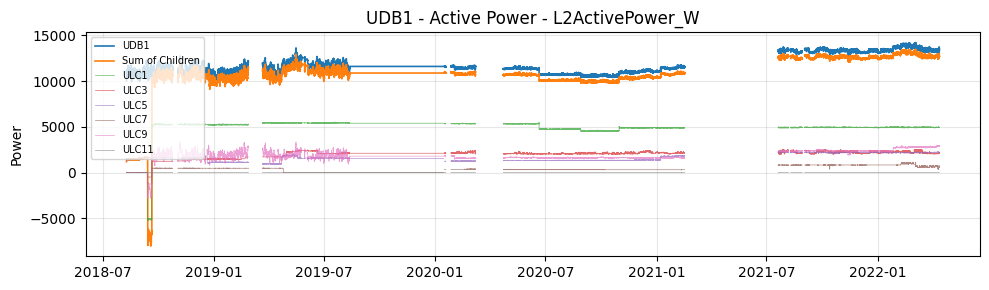

L3ActivePower_W: MAPE = 9.0862%


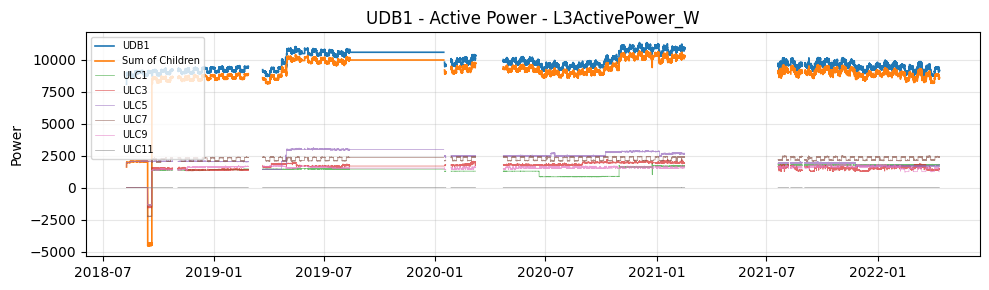

ActiveThreePhasePower_W: MAPE = 8.1420%


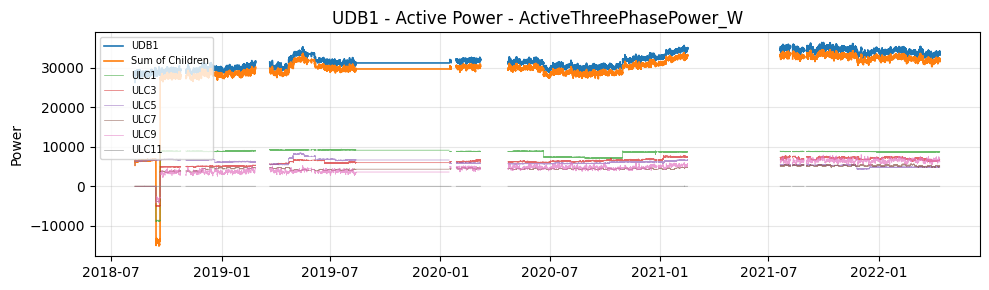


UDB2 - Active Power
L1ActivePower_W: MAPE = 4.6822%


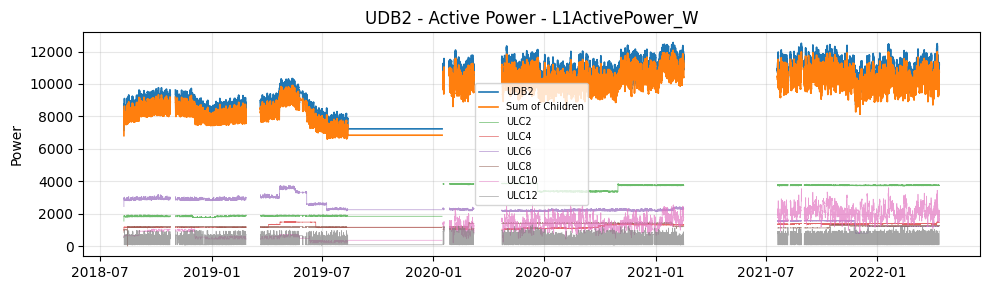

L2ActivePower_W: MAPE = 5.5674%


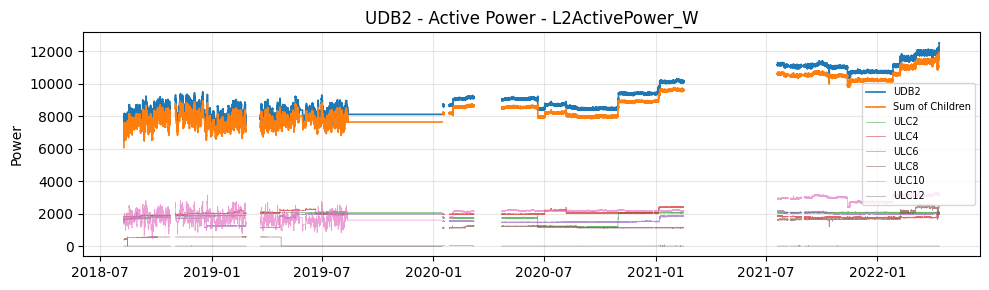

L3ActivePower_W: MAPE = 4.6946%


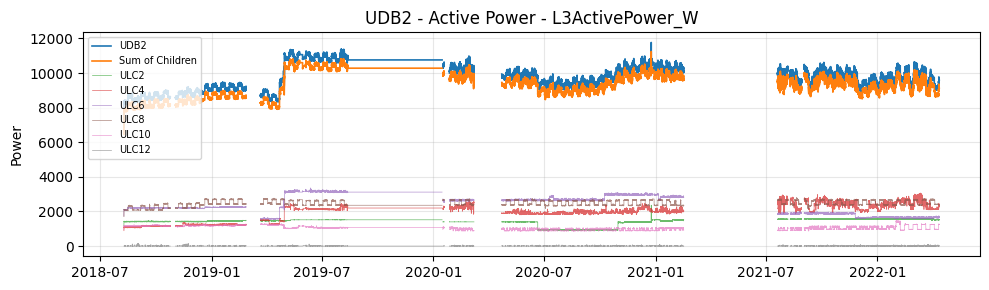

ActiveThreePhasePower_W: MAPE = 4.4124%


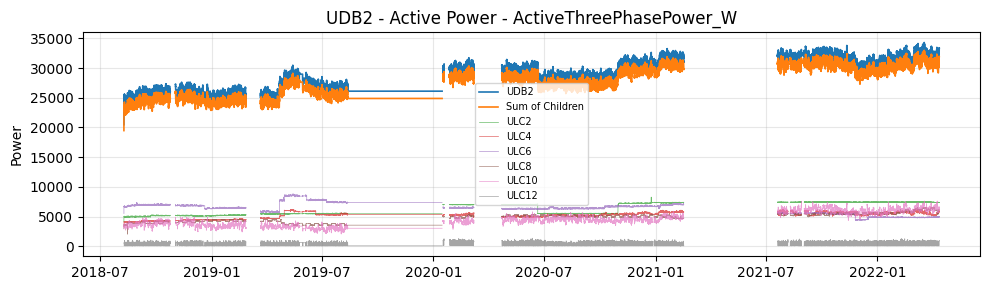


ADB - Active Power
L1ActivePower_W: MAPE = 9.4754%


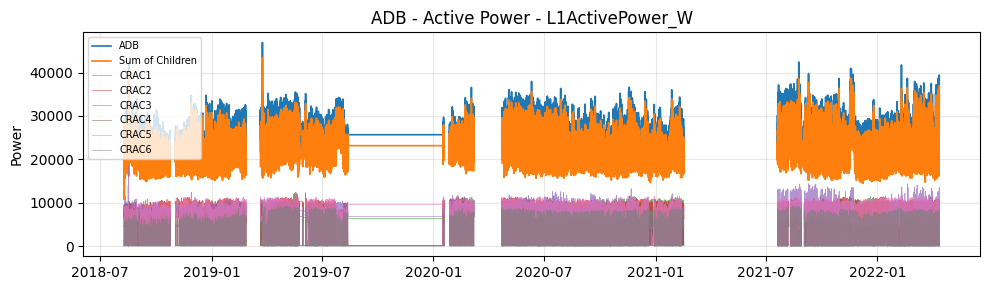

L2ActivePower_W: MAPE = 8.8693%


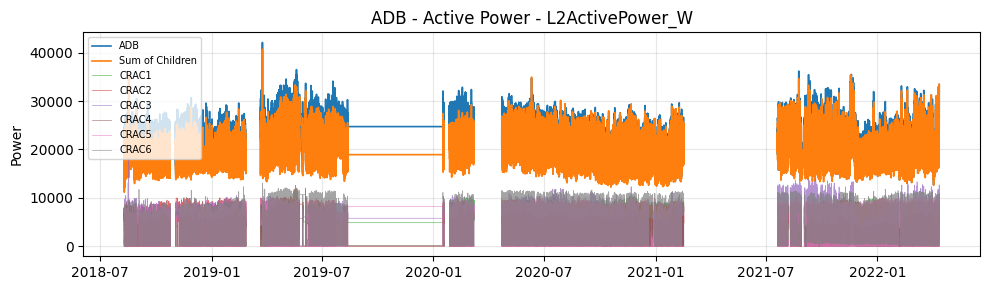

L3ActivePower_W: MAPE = 10.6585%


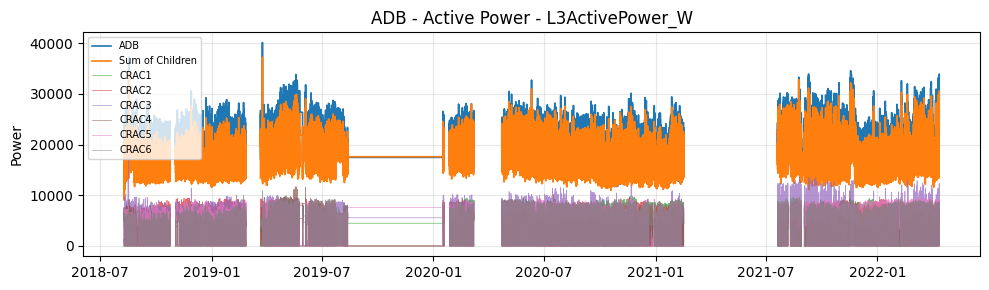

ActiveThreePhasePower_W: MAPE = 9.6758%


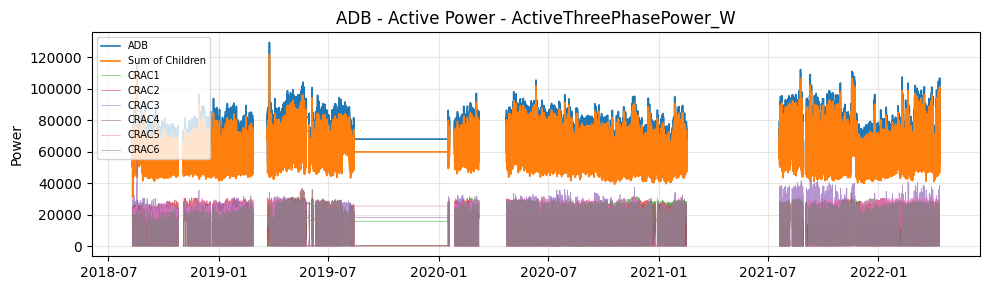


UDB1 - Apparent Power
L1ApparentPower_VA: MAPE = 4.9872%


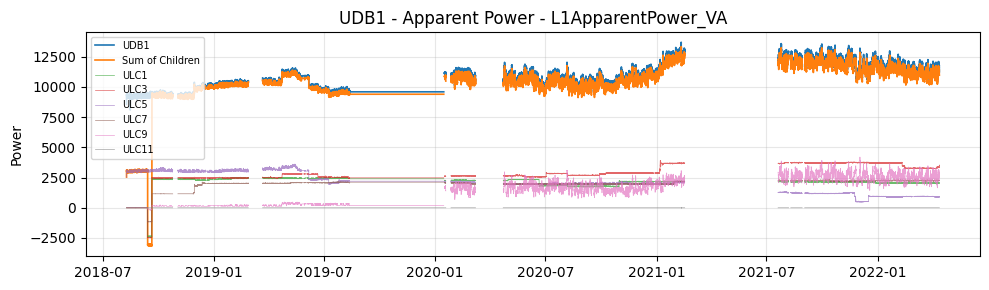

L2ApparentPower_VA: MAPE = 5.5681%


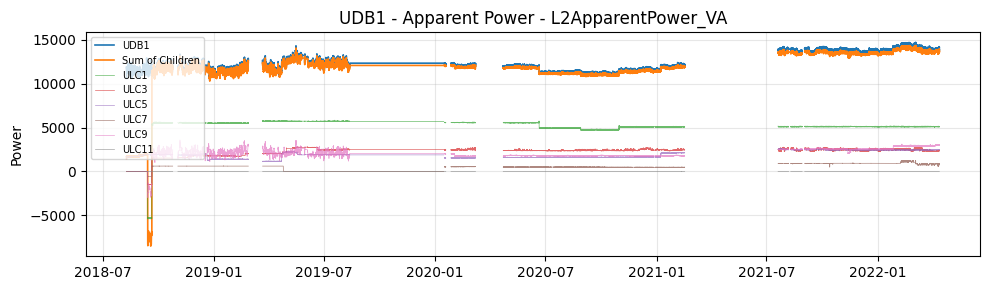

L3ApparentPower_VA: MAPE = 6.4202%


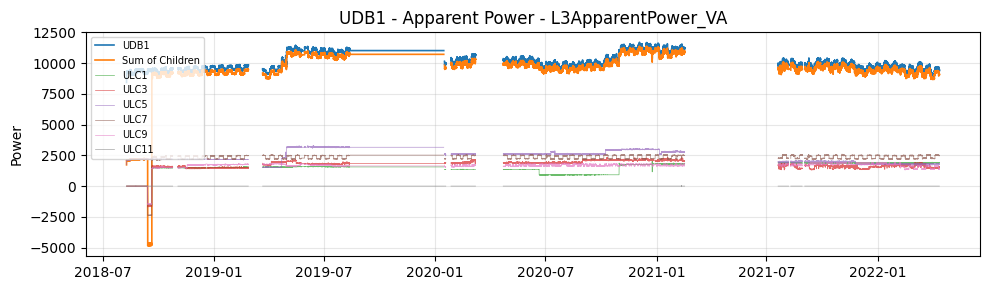

ApparentThreePhasePower_VA: MAPE = 5.5936%


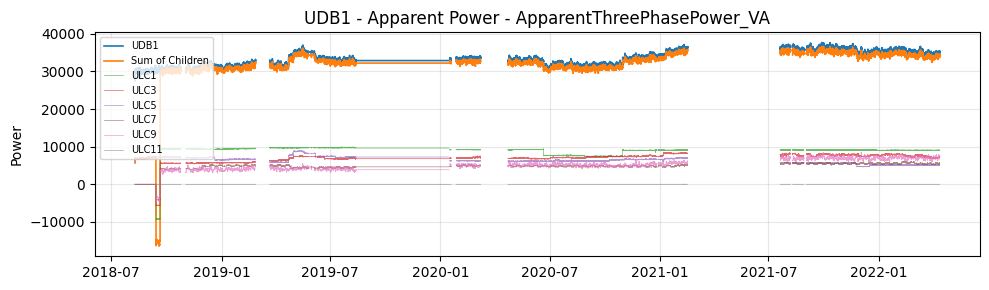


UDB2 - Apparent Power
L1ApparentPower_VA: MAPE = 0.9406%


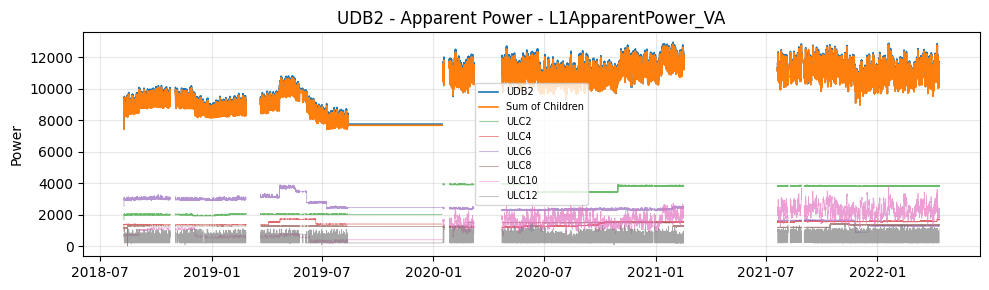

L2ApparentPower_VA: MAPE = 2.0249%


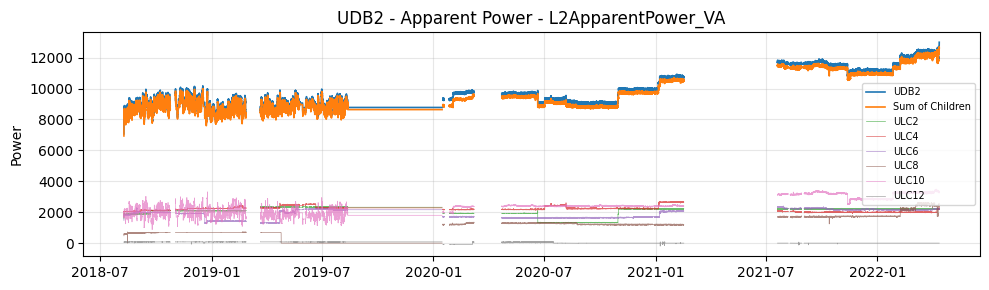

L3ApparentPower_VA: MAPE = 2.3251%


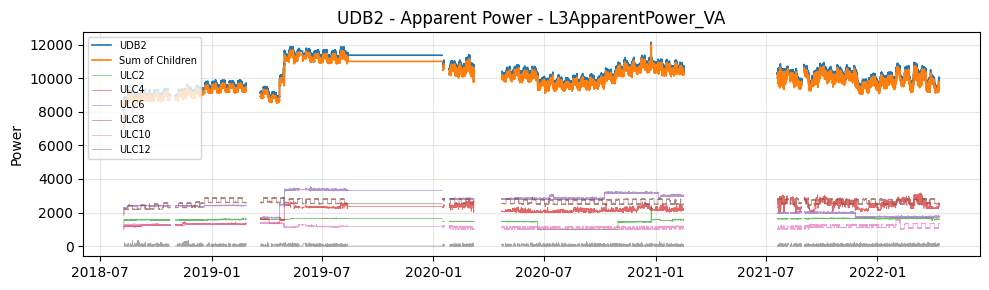

ApparentThreePhasePower_VA: MAPE = 1.5999%


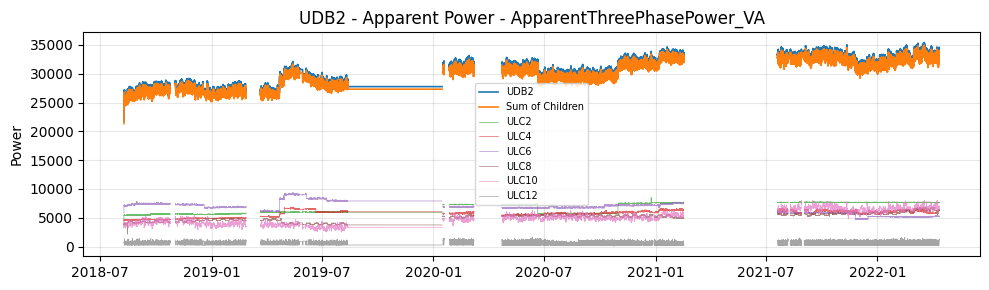


ADB - Apparent Power
L1ApparentPower_VA: MAPE = 10.3196%


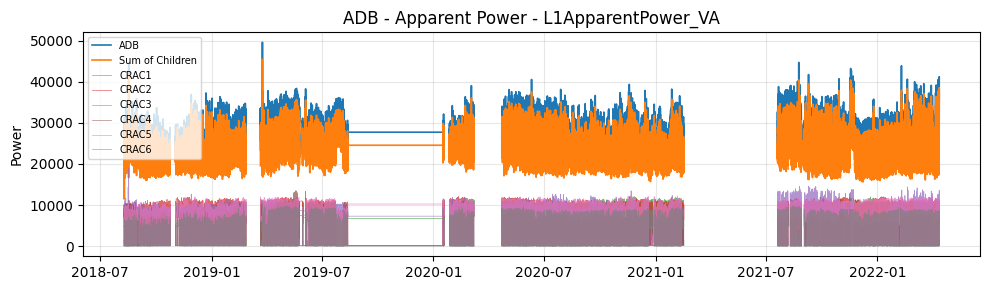

L2ApparentPower_VA: MAPE = 9.7377%


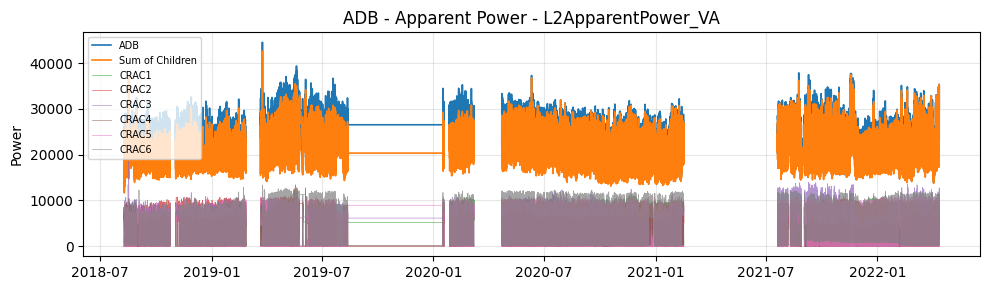

L3ApparentPower_VA: MAPE = 11.0498%


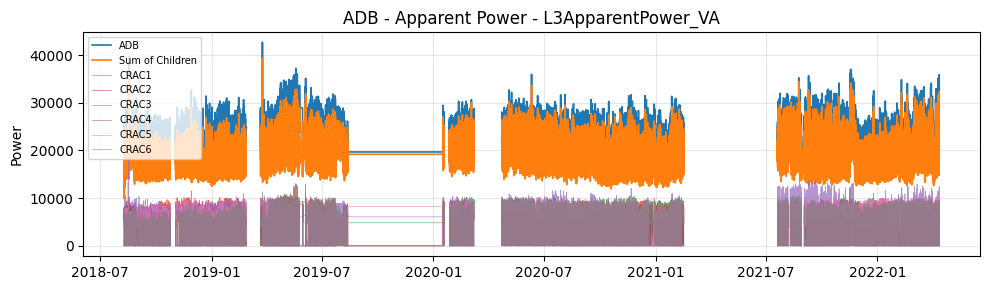

ApparentThreePhasePower_VA: MAPE = 10.5502%


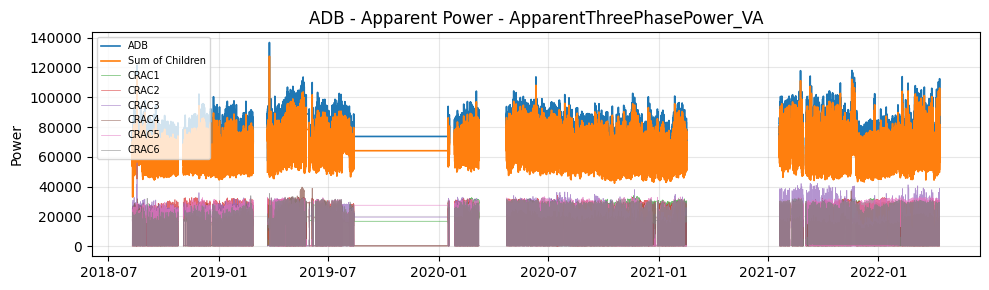


UDB1 - Capacitive Reactive Power
L1CapacitivePower_var: MAPE = nan%


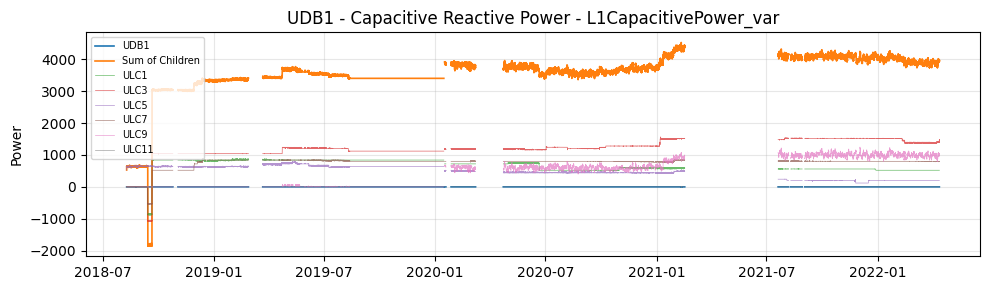

L2CapacitivePower_var: MAPE = nan%


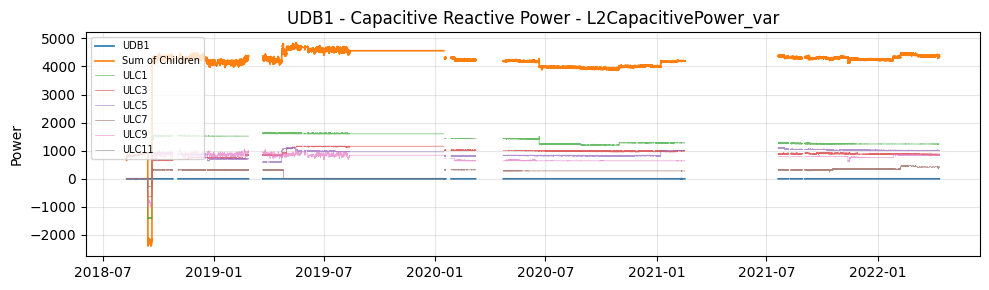

L3CapacitivePower_var: MAPE = nan%


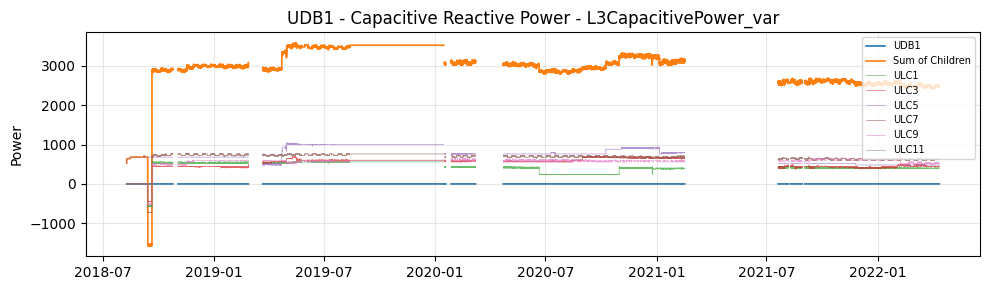

CapacitiveThreePhasePower_var: MAPE = nan%


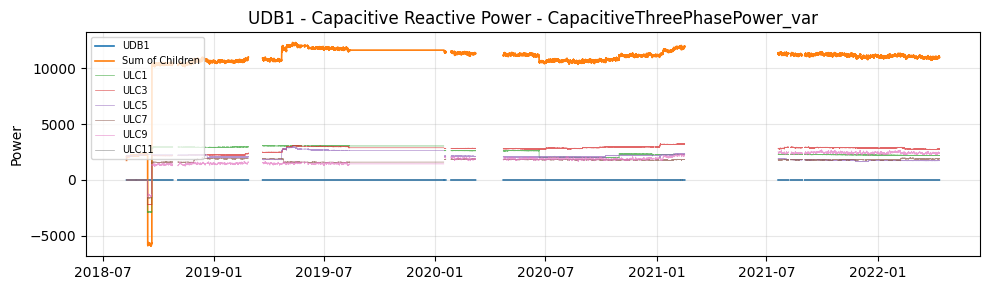


UDB2 - Capacitive Reactive Power
L1CapacitivePower_var: MAPE = nan%


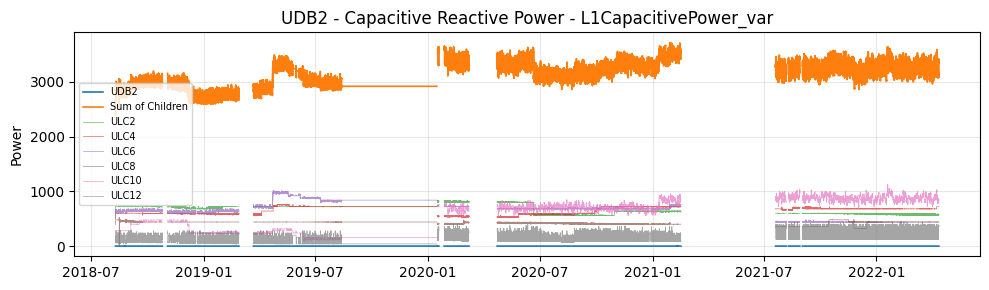

L2CapacitivePower_var: MAPE = nan%


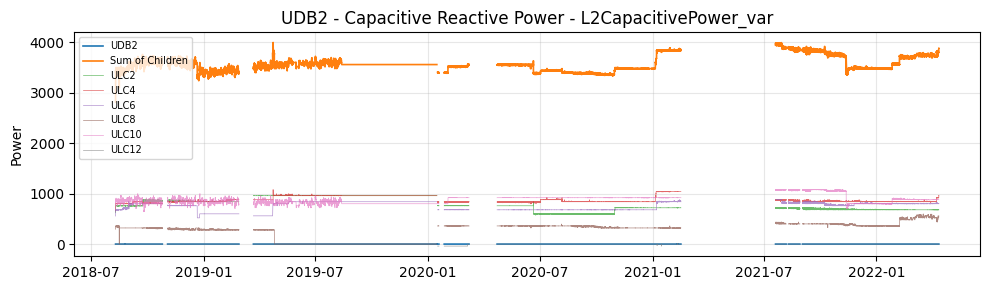

L3CapacitivePower_var: MAPE = nan%


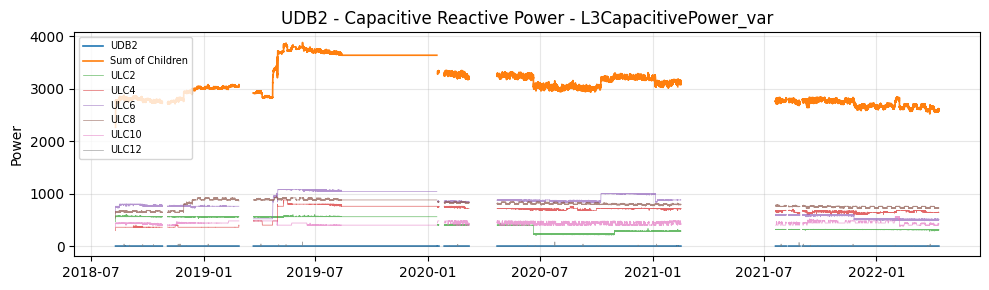

CapacitiveThreePhasePower_var: MAPE = nan%


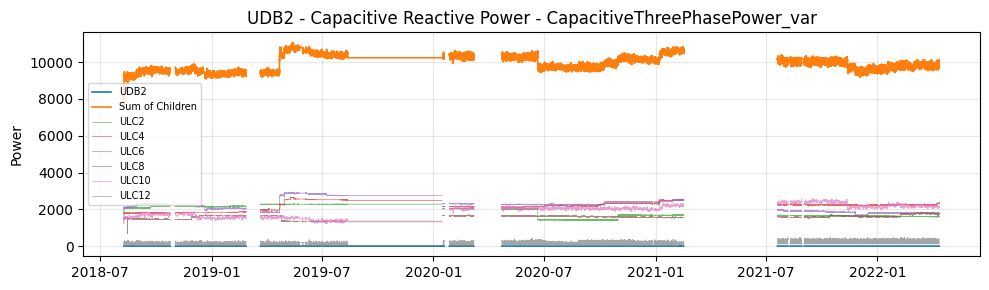


ADB - Capacitive Reactive Power
L1CapacitivePower_var: MAPE = nan%


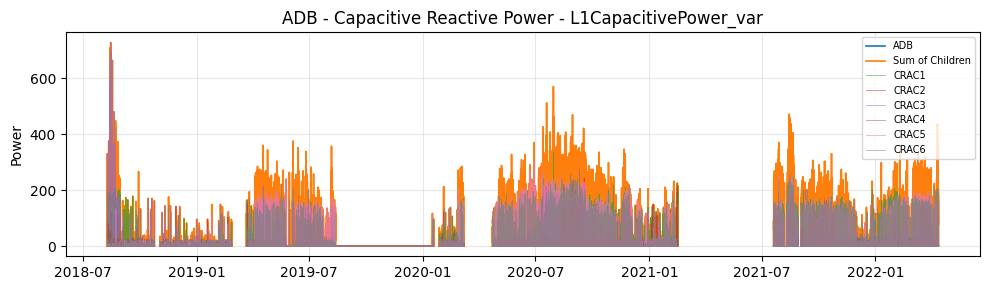

L2CapacitivePower_var: MAPE = nan%


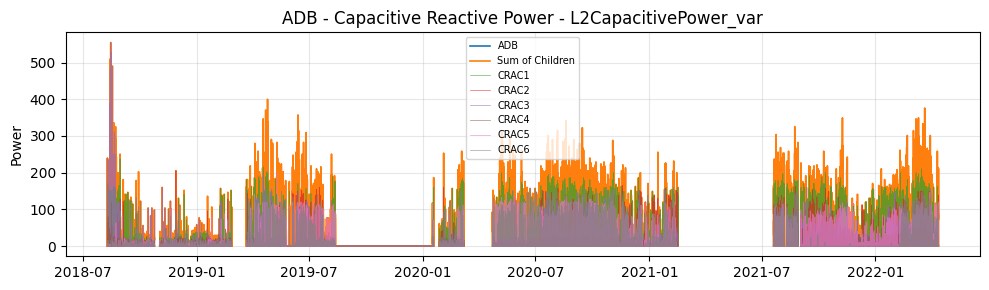

L3CapacitivePower_var: MAPE = nan%


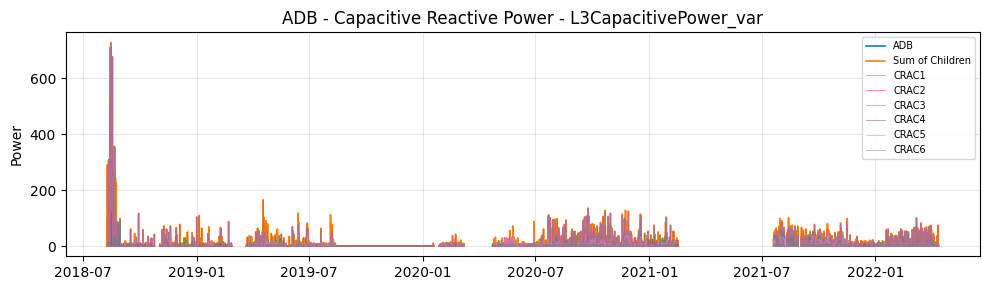

CapacitiveThreePhasePower_var: MAPE = nan%


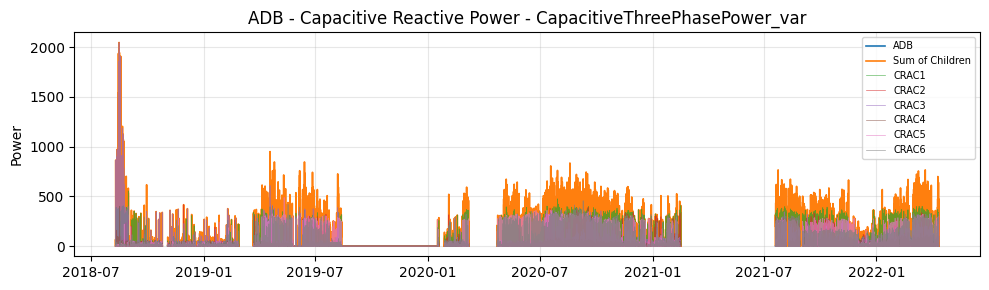


UDB1 - Inductive Reactive Power
L1InductivePower_var: MAPE = nan%


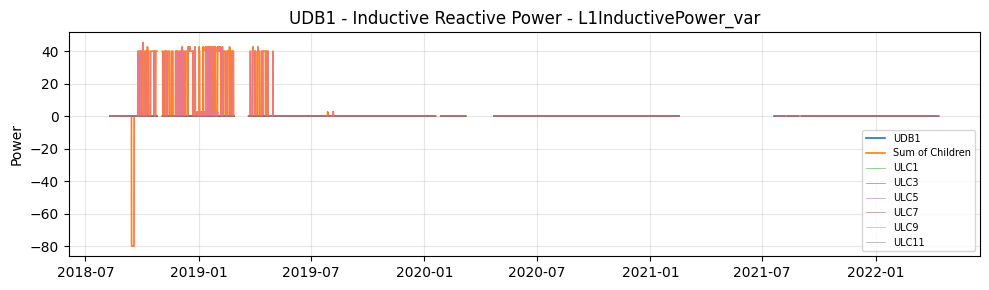

L2InductivePower_var: MAPE = nan%


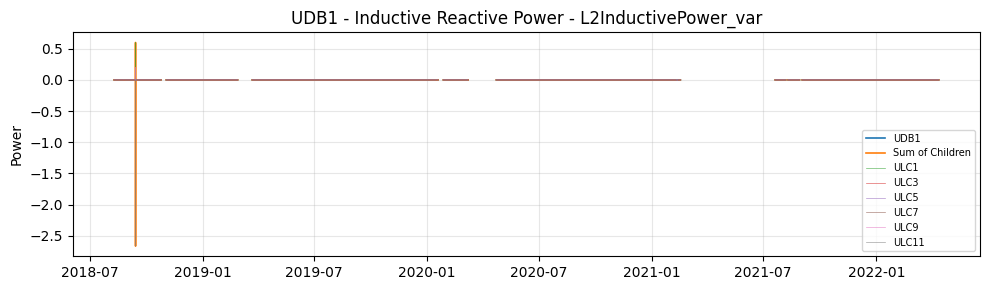

L3InductivePower_var: MAPE = nan%


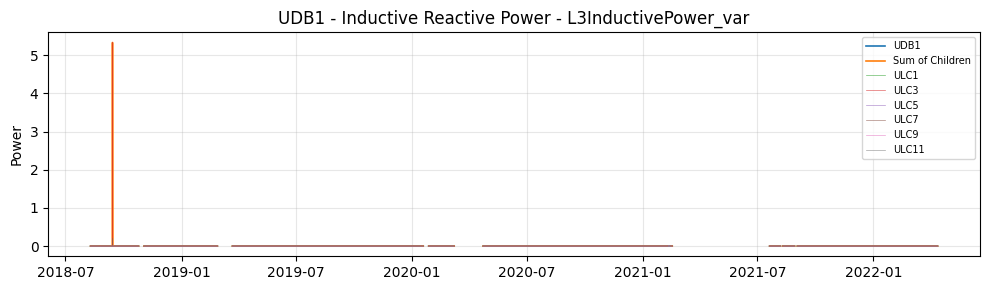

InductiveThreePhasePower_var: MAPE = nan%


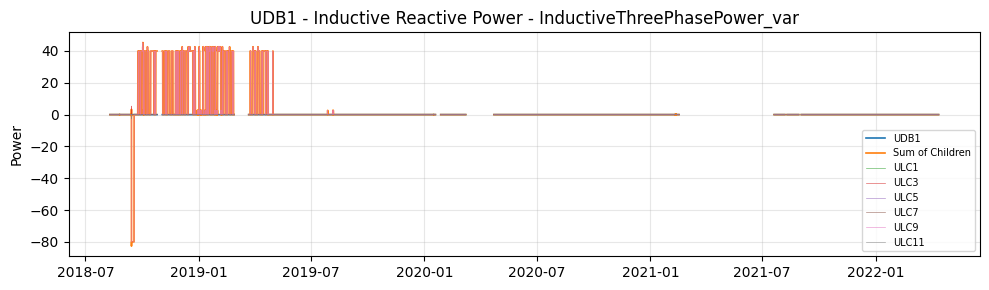


UDB2 - Inductive Reactive Power
L1InductivePower_var: MAPE = nan%


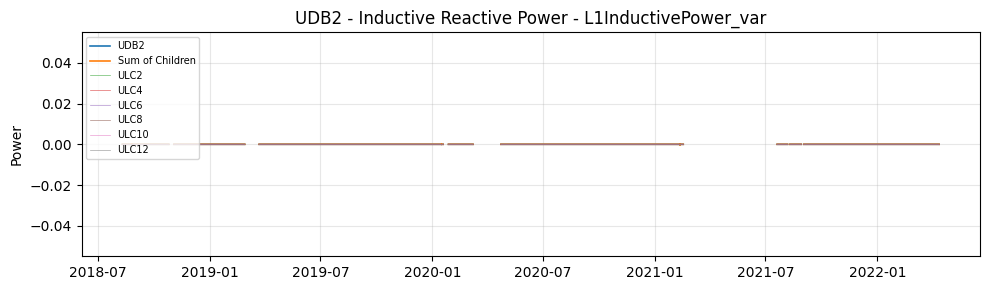

L2InductivePower_var: MAPE = nan%


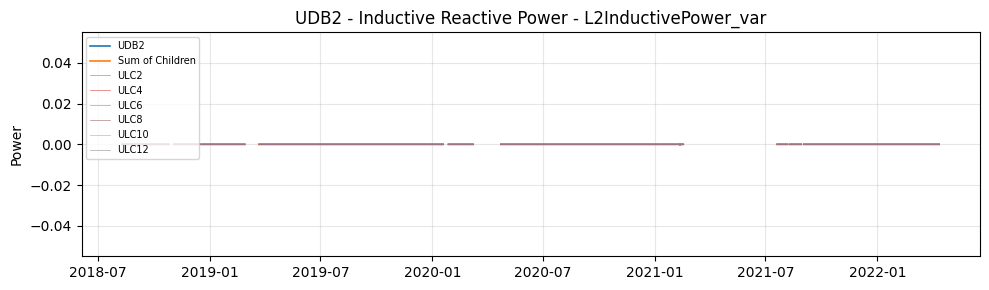

L3InductivePower_var: MAPE = nan%


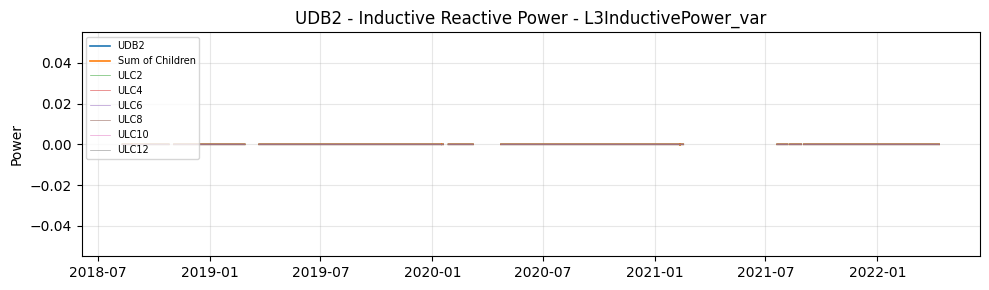

InductiveThreePhasePower_var: MAPE = nan%


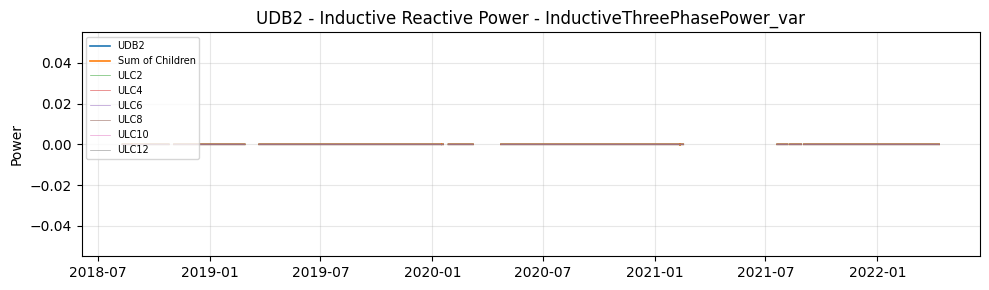


ADB - Inductive Reactive Power
L1InductivePower_var: MAPE = nan%


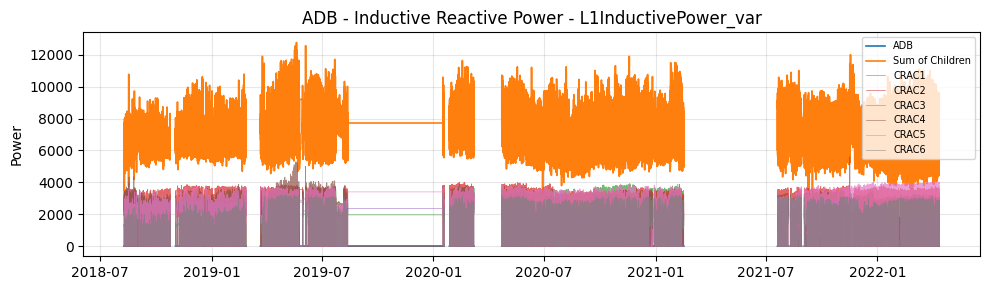

L2InductivePower_var: MAPE = nan%


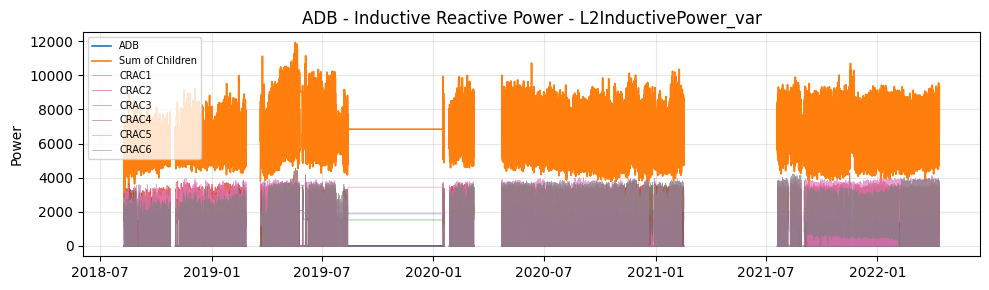

L3InductivePower_var: MAPE = nan%


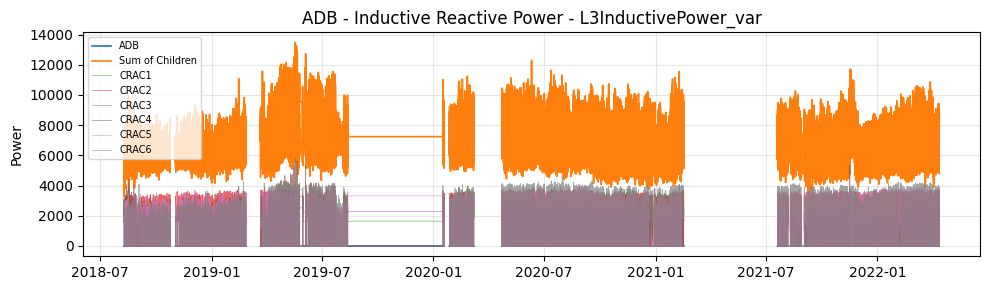

InductiveThreePhasePower_var: MAPE = nan%


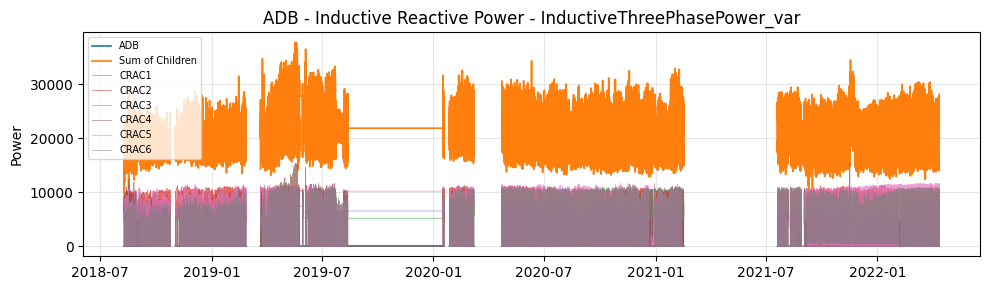

In [8]:
# =============================================================================
# Parent-Child Power Validation
# =============================================================================

TOPOLOGIES = {
    "UDB1": ["ULC1", "ULC3", "ULC5", "ULC7", "ULC9", "ULC11"],
    "UDB2": ["ULC2", "ULC4", "ULC6", "ULC8", "ULC10", "ULC12"],
    "ADB": ["CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6"],
}

SIGN_CORRECTIONS = {
    "Active Power": {"ULC10", "ULC12"},
    "Apparent Power": {"ULC10"},
    "Capacitive Reactive Power": {"ULC10"},
}

for power_type, config in POWER_VALIDATION_CONFIG.items():

    phases = config["phases"] + [config["three_phase"]]

    for topology, children in TOPOLOGIES.items():

        parent = datasets[topology]
        print(f"\n{'=' * 60}\n{topology} - {power_type}\n{'=' * 60}")

        for phase in phases:

            frames = {topology: parent[phase]}

            for child in children:

                df = datasets[child]

                # Reconstruct corrected three-phase power
                if phase == config["three_phase"] and child in SIGN_CORRECTIONS.get(power_type, set()):

                    phase_cols = config["phases"]
                    series = df[phase_cols].copy()

                    # Correct L2 sign
                    series[phase_cols[1]] *= -1

                    frames[child] = series.sum(axis=1)

                else:
                    series = df[phase].copy()

                    # Correct individual L2 phase where required
                    if child in SIGN_CORRECTIONS.get(power_type, set()) and phase.startswith("L2"):
                        series *= -1

                    frames[child] = series

            comparison = pd.concat(frames, axis=1).dropna()
            comparison["Sum of Children"] = comparison[children].sum(axis=1)

            # MAPE - full 1-minute resolution
            valid = comparison[topology] != 0
            mape = (
                (comparison.loc[valid, topology] - comparison.loc[valid, "Sum of Children"]).abs()
                / comparison.loc[valid, topology].abs()
            ).mean() * 100

            print(f"{phase}: MAPE = {mape:.4f}%")

            # Plot - 15-minute resolution
            plot_df = comparison.resample("15min").mean()

            fig, ax = plt.subplots(figsize=(10, 3))
            ax.plot(plot_df.index, plot_df[topology], linewidth=1.2, label=topology)
            ax.plot(plot_df.index, plot_df["Sum of Children"], linewidth=1.2, label="Sum of Children")

            for child in children:
                if child in comparison:
                    ax.plot(plot_df.index, plot_df[child], linewidth=0.5, alpha=0.7, label=child)

            ax.set(title=f"{topology} - {power_type} - {phase}", ylabel="Power")
            ax.grid(True, alpha=0.3)
            ax.legend(fontsize=7)
            plt.tight_layout()
            plt.show()
            plt.close(fig)

| Device | Columns Modified | Engineering Justification |
| ------ | ---------------- | ------------------------- |
| ULC10  | `L2ActivePower_W`, `ActiveThreePhasePower_W` | L2 polarity reversed; three-phase power reconstructed from corrected phase powers. |
| ULC12  | `L2ActivePower_W`, `ActiveThreePhasePower_W` | L2 polarity reversed; three-phase power reconstructed from corrected phase powers. |
| ULC10  | `L2ApparentPower_VA`, `ApparentThreePhasePower_VA` | L2 polarity reversed; three-phase apparent power reconstructed from corrected phase powers. |
| ULC10  | `L2CapacitivePower_var`, `CapacitiveThreePhasePower_var` | L2 polarity reversed; three-phase capacitive power reconstructed from corrected phase powers. |

- ULC10 and ULC12 have reversed L2 polarity for active power.
- ULC10 also has reversed L2 polarity for apparent and capacitive power.
- The affected three-phase quantities are reconstructed from the corrected phase measurements.
- These corrections are applied only where the engineering validation identified a sign inconsistency.
- The original cleaned telemetry remains unchanged; corrected values are used for validation and reconstruction analysis.

## Contribution of each Child Meter to its Parent Meter:

In [9]:
# =============================================================================
# Mean Child Contribution to Parent
# =============================================================================

for power_type, config in POWER_VALIDATION_CONFIG.items():

    metric = config["three_phase"]
    phases = config["phases"]

    print(f"\n{'#' * 90}\n# {power_type}\n{'#' * 90}")

    for topology, children in TOPOLOGIES.items():

        parent = datasets[topology]
        comparison = pd.DataFrame({"Parent": parent[metric]})

        for child in children:

            df = datasets[child]

            if child in SIGN_CORRECTIONS.get(power_type, set()):
                series = df[phases].copy()
                series[phases[1]] *= -1
                comparison[child] = series.sum(axis=1)
            else:
                comparison[child] = df[metric]

        comparison = comparison.dropna()
        parent_mean = comparison["Parent"].mean()

        print(f"\n{topology}")

        for child in children:
            child_mean = comparison[child].mean()
            contribution = 100 * child_mean / parent_mean
            print(f"{child:<6}: {child_mean:10.1f}   ({contribution:6.2f} %)")


##########################################################################################
# Active Power
##########################################################################################

UDB1
ULC1  :     8304.6   ( 26.16 %)
ULC3  :     6039.7   ( 19.03 %)
ULC5  :     6028.5   ( 18.99 %)
ULC7  :     4350.4   ( 13.70 %)
ULC9  :     4534.8   ( 14.29 %)
ULC11 :       -0.0   ( -0.00 %)

UDB2
ULC2  :     6213.5   ( 21.71 %)
ULC4  :     5233.9   ( 18.29 %)
ULC6  :     6481.7   ( 22.65 %)
ULC8  :     4653.7   ( 16.26 %)
ULC10 :     4354.8   ( 15.22 %)
ULC12 :      426.8   (  1.49 %)

ADB
CRAC1 :    11216.5   ( 16.96 %)
CRAC2 :     9496.4   ( 14.36 %)
CRAC3 :    10892.7   ( 16.47 %)
CRAC4 :     6268.9   (  9.48 %)
CRAC5 :    13155.8   ( 19.89 %)
CRAC6 :     8825.2   ( 13.34 %)

##########################################################################################
# Apparent Power
##########################################################################################

UDB1
ULC

C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  contribution = 100 * child_mean / parent_mean
C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: invalid value encountered in scalar divide
  contribution = 100 * child_mean / parent_mean



UDB2
ULC2  :     1915.6   (   inf %)
ULC4  :     2223.2   (   inf %)
ULC6  :     2274.9   (   inf %)
ULC8  :     1538.6   (   inf %)
ULC10 :     1851.8   (   inf %)
ULC12 :      169.8   (   inf %)


C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  contribution = 100 * child_mean / parent_mean



ADB
CRAC1 :       10.5   (   inf %)
CRAC2 :        1.6   (   inf %)
CRAC3 :        5.0   (   inf %)
CRAC4 :        1.3   (   inf %)
CRAC5 :       18.8   (   inf %)
CRAC6 :        7.9   (   inf %)

##########################################################################################
# Inductive Reactive Power
##########################################################################################


C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  contribution = 100 * child_mean / parent_mean



UDB1
ULC1  :        0.0   (   inf %)
ULC3  :        0.0   (   inf %)
ULC5  :        0.0   (   nan %)
ULC7  :        0.0   (   inf %)
ULC9  :        3.0   (   inf %)
ULC11 :       -0.0   (  -inf %)


C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  contribution = 100 * child_mean / parent_mean
C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: invalid value encountered in scalar divide
  contribution = 100 * child_mean / parent_mean



UDB2
ULC2  :        0.0   (   nan %)
ULC4  :        0.0   (   nan %)
ULC6  :        0.0   (   nan %)
ULC8  :        0.0   (   nan %)
ULC10 :        0.0   (   nan %)
ULC12 :        0.0   (   nan %)


C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: invalid value encountered in scalar divide
  contribution = 100 * child_mean / parent_mean



ADB
CRAC1 :     3833.8   (   inf %)
CRAC2 :     3385.8   (   inf %)
CRAC3 :     3210.6   (   inf %)
CRAC4 :     2508.1   (   inf %)
CRAC5 :     4831.1   (   inf %)
CRAC6 :     3093.0   (   inf %)


C:\Users\35387\AppData\Local\Temp\ipykernel_17952\391303378.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  contribution = 100 * child_mean / parent_mean


## ADB Validation

Validation of the ADB branch initially indicated a mean conservation residual of approximately 6.31 kW between the parent feeder (ADB) and the summed power consumption of CRAC1–CRAC6. However, contribution analysis showed that the six CRAC units collectively accounted for approximately 90.6% of the parent feeder load, with no individual CRAC exhibiting anomalous behaviour or an unusually low contribution. Examination of the electrical one-line diagram revealed that ADB also supplies two additional downstream loads (ALC1 and ALC2) that are not represented in the available telemetry dataset. Consequently, the observed residual is consistent with an incomplete telemetry topology rather than a measurement or instrumentation error, demonstrating that the proposed validation framework can distinguish between genuine telemetry anomalies and missing downstream measurements.

# IUDB Validation

Validation of the IUDB branch produced a mean conservation residual of approximately 12.45 kW when comparing the parent feeder against the summed consumption of UDB1, UDB2, and UDB3. Contribution analysis showed that these three downstream distribution boards collectively represented only 83.8% of the measured IUDB load. Inspection of the facility electrical topology revealed that IUDB also supplies UPS1 and UPS2, both of which are absent from the available telemetry dataset. As a result, the apparent conservation violation is attributable to incomplete downstream metering coverage rather than erroneous power measurements. This case further demonstrates that the proposed validation methodology is capable of identifying conservation discrepancies arising from incomplete topology information, thereby preventing such cases from being incorrectly classified as telemetry faults.

## Compare Mean Three-Phase Power Across ULC Pairs

Parent-meter telemetry is available for the main power metrics, allowing parent-child contribution analysis where applicable.

Paired ULCs are additionally compared using their mean three-phase power to identify differences between corresponding branch meters.

Device-specific sign corrections identified during engineering validation are applied before calculating the means.

In [10]:
# =============================================================================
# Mean Three-Phase Power - Paired ULC Comparison
# =============================================================================

PAIRS = [
    ("ULC1", "ULC2"), ("ULC3", "ULC4"), ("ULC5", "ULC6"),
    ("ULC7", "ULC8"), ("ULC9", "ULC10"), ("ULC11", "ULC12"),
]

for power_type, config in POWER_VALIDATION_CONFIG.items():

    metric, phases = config["three_phase"], config["phases"]

    print(f"\n{'=' * 70}\n{power_type}\n{'=' * 70}")

    for device1, device2 in PAIRS:
        means = {}

        for device in [device1, device2]:
            df = datasets[device]

            if device in SIGN_CORRECTIONS.get(power_type, set()):
                df = df[phases].copy()
                df[phases[1]] *= -1
                means[device] = df.sum(axis=1).mean()
            else:
                means[device] = df[metric].mean()

        difference = abs(means[device1] - means[device2])

        print(
            f"{device1:<6}: {means[device1]:10.2f}   |   "
            f"{device2:<6}: {means[device2]:10.2f}   |   "
            f"Difference: {difference:8.2f}"
        )


Active Power
ULC1  :    8304.69   |   ULC2  :    6213.86   |   Difference:  2090.84
ULC3  :    6039.90   |   ULC4  :    5234.10   |   Difference:   805.80
ULC5  :    6028.52   |   ULC6  :    6481.73   |   Difference:   453.21
ULC7  :    4350.63   |   ULC8  :    4654.18   |   Difference:   303.55
ULC9  :    4535.38   |   ULC10 :    4355.34   |   Difference:   180.05
ULC11 :      -0.00   |   ULC12 :     426.97   |   Difference:   426.97

Apparent Power
ULC1  :    8711.04   |   ULC2  :    6570.88   |   Difference:  2140.16
ULC3  :    6740.86   |   ULC4  :    5773.66   |   Difference:   967.20
ULC5  :    6477.54   |   ULC6  :    6910.48   |   Difference:   432.94
ULC7  :    4692.72   |   ULC8  :    4902.74   |   Difference:   210.01
ULC9  :    4894.99   |   ULC10 :    4817.20   |   Difference:    77.80
ULC11 :      -0.00   |   ULC12 :     614.69   |   Difference:   614.69

Capacitive Reactive Power
ULC1  :    2468.42   |   ULC2  :    1915.50   |   Difference:   552.91
ULC3  :    2665.40  

## Cumulative energy counter Validations:

- ConsumedActiveEnergyW_Wh
- ConsumedActiveEnergykW_kWh

- ConsumedApparentEnergyVAh_VAh
- ConsumedApparentEnergykVAh_kVAh

- ConsumedCapacitiveReactiveEnergykvarhC_kvarh
- ConsumedCapacitiveReactiveEnergyvarhC_varh

- ConsumedInductiveReactiveEnergykvarhL_kvarh
- ConsumedInductiveReactiveEnergyvarhL_varh

## First, check the columns for all parent & child devices:

- Identify if it is populated and therefore if it can be validated

In [11]:
# =============================================================================
# Cumulative Energy Telemetry Availability
# =============================================================================

DEVICES = [
    "ULC1", "ULC2", "ULC3", "ULC4", "ULC5", "ULC6",
    "ULC7", "ULC8", "ULC9", "ULC10", "ULC11", "ULC12",
    "CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6",
    "ADB", "UDB1", "UDB2", "IUDB", "NDB",
]

ENERGY_METRICS = [
    "ConsumedActiveEnergyW_Wh", "ConsumedActiveEnergykW_kWh",
    "ConsumedApparentEnergyVAh_VAh", "ConsumedApparentEnergykVAh_kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
    "ConsumedCapacitiveReactiveEnergyvarhC_varh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh",
    "ConsumedInductiveReactiveEnergyvarhL_varh",
]

METRIC_NAMES = {
    "ConsumedActiveEnergyW_Wh": "Active Wh",
    "ConsumedActiveEnergykW_kWh": "Active kWh",
    "ConsumedApparentEnergyVAh_VAh": "Apparent VAh",
    "ConsumedApparentEnergykVAh_kVAh": "Apparent kVAh",
    "ConsumedCapacitiveReactiveEnergykvarhC_kvarh": "Capacitive kvarh",
    "ConsumedCapacitiveReactiveEnergyvarhC_varh": "Capacitive varh",
    "ConsumedInductiveReactiveEnergykvarhL_kvarh": "Inductive kvarh",
    "ConsumedInductiveReactiveEnergyvarhL_varh": "Inductive varh",
}

availability_df = pd.DataFrame([
    {
        "Device": device,
        **{
            METRIC_NAMES[m]: (
                "YES" if m in datasets.get(device, {}) and
                datasets[device][m].notna().any() and
                (datasets[device][m] != 0).any()
                else "NO"
            )
            for m in ENERGY_METRICS
        },
    }
    for device in DEVICES
])

print("=" * 120)
print("CUMULATIVE ENERGY TELEMETRY AVAILABILITY")
print("=" * 120)
print(availability_df.to_string(index=False))

CUMULATIVE ENERGY TELEMETRY AVAILABILITY
Device Active Wh Active kWh Apparent VAh Apparent kVAh Capacitive kvarh Capacitive varh Inductive kvarh Inductive varh
  ULC1       YES        YES          YES           YES              YES             YES              NO             NO
  ULC2       YES        YES          YES           YES              YES             YES              NO             NO
  ULC3       YES        YES          YES           YES              YES             YES              NO             NO
  ULC4       YES        YES          YES           YES              YES             YES              NO             NO
  ULC5       YES        YES          YES           YES              YES             YES              NO            YES
  ULC6       YES        YES          YES           YES              YES             YES              NO             NO
  ULC7       YES        YES          YES           YES              YES             YES              NO             NO
  ULC8 

## Validate Cumulative Energy Counters against RECONSTRUCTED Instantaneous Power Columns:

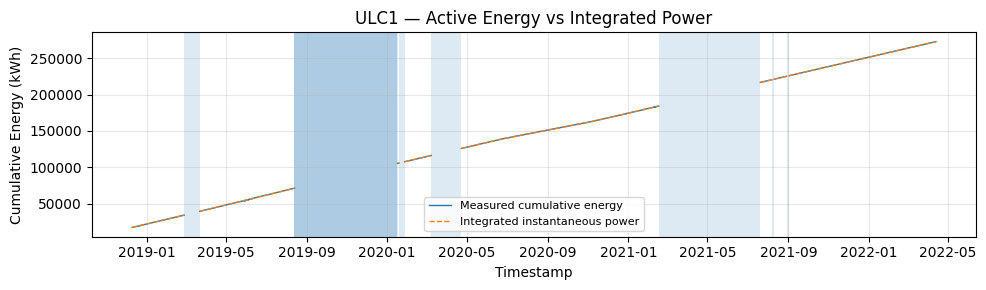

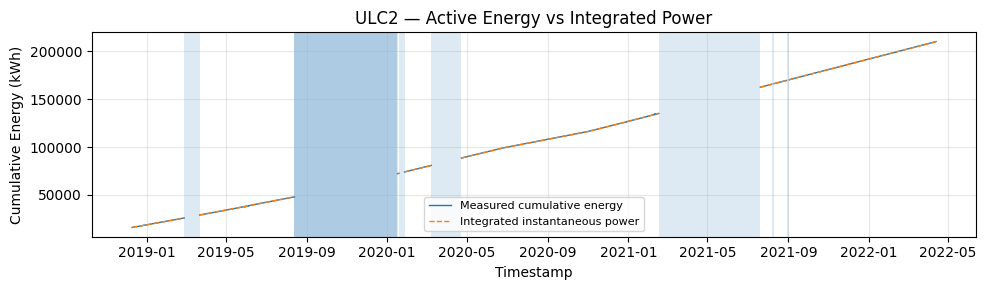

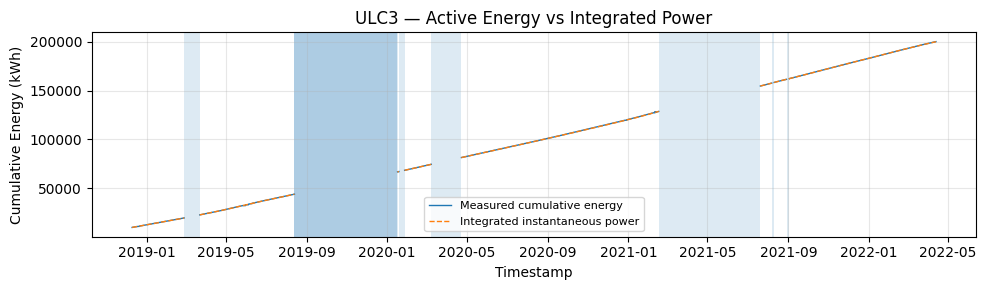

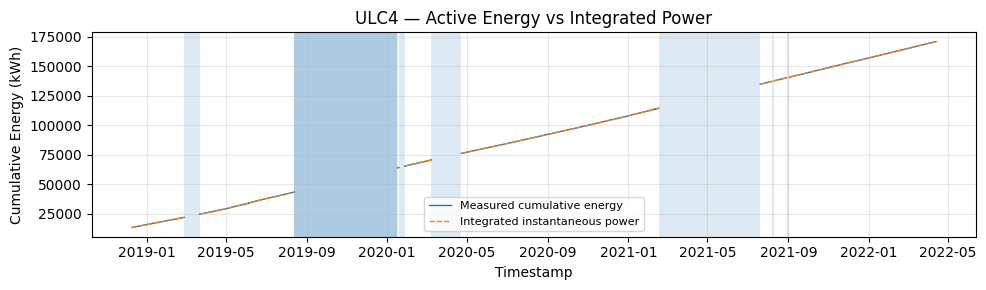

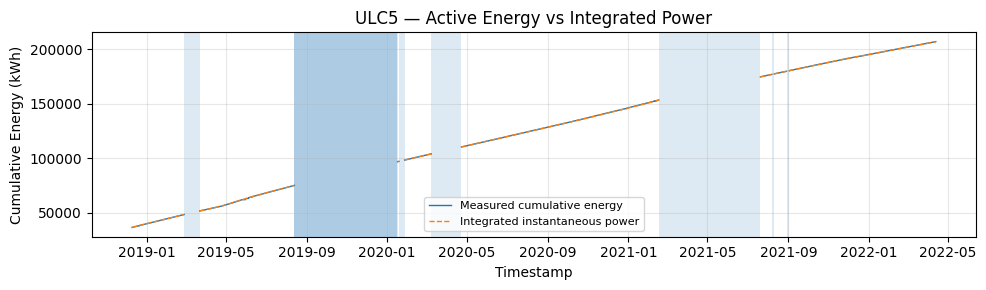

...

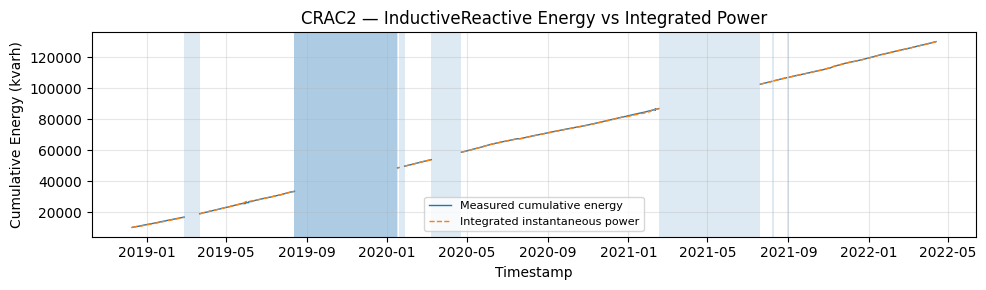

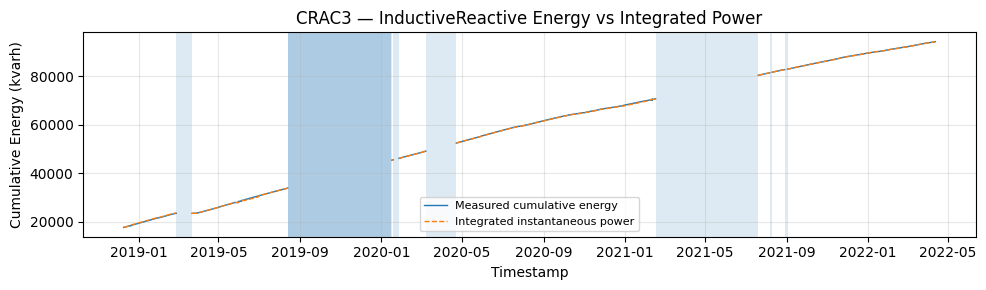

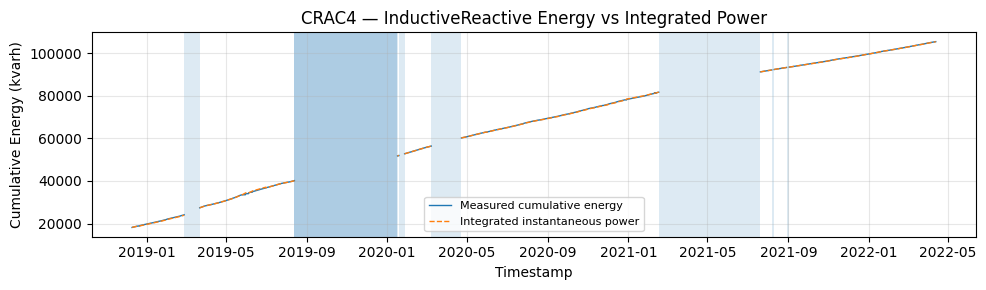

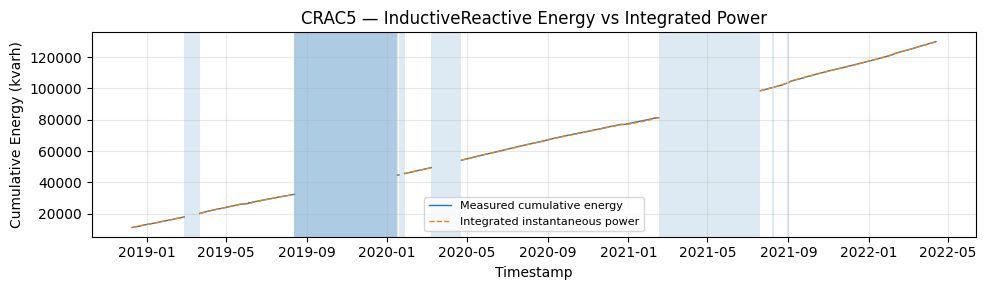

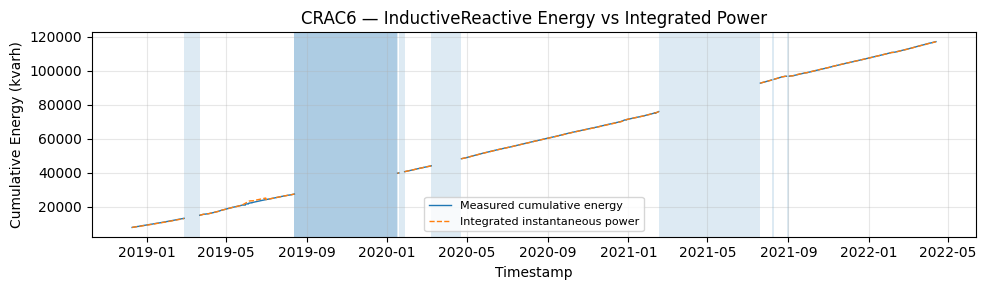


CUMULATIVE ENERGY vs INSTANTANEOUS POWER
            Metric Device  Measured_Energy  Integrated_Power_Energy    Difference  Difference_%  Valid_Segments  Valid_Intervals  Excluded_Large_Gap_Records
            Active   ULC1       171436.074            169680.308905   1755.765095      1.034749              76          1184969                      223526
            Active   ULC2       129714.590            128472.014884   1242.575116      0.967195              76          1184965                      223526
            Active   ULC3       129592.490            128215.006644   1377.483356      1.074354              77          1184965                      223526
            Active   ULC4       106663.486            105522.705761   1140.780239      1.081076              76          1184967                      223526
            Active   ULC5       116156.326            115096.427911   1059.898089      0.920878              76          1184470                      223526
            Acti

In [12]:
# =============================================================================
# Cumulative Energy vs Instantaneous Power
# =============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from dateutil.relativedelta import relativedelta

DEVICES = [
    "ULC1", "ULC2", "ULC3", "ULC4", "ULC5", "ULC6",
    "ULC7", "ULC8", "ULC9", "ULC10", "ULC11", "ULC12",
    "CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6",
]

ENERGY_PAIRS = {
    "Active": {
        "subunit": "ConsumedActiveEnergyW_Wh",
        "whole": "ConsumedActiveEnergykW_kWh",
        "power": "ActiveThreePhasePower_W",
        "phases": ["L1ActivePower_W", "L2ActivePower_W", "L3ActivePower_W"],
        "unit": "kWh",
    },
    "Apparent": {
        "subunit": "ConsumedApparentEnergyVAh_VAh",
        "whole": "ConsumedApparentEnergykVAh_kVAh",
        "power": "ApparentThreePhasePower_VA",
        "phases": ["L1ApparentPower_VA", "L2ApparentPower_VA", "L3ApparentPower_VA"],
        "unit": "kVAh",
    },
    "CapacitiveReactive": {
        "subunit": "ConsumedCapacitiveReactiveEnergyvarhC_varh",
        "whole": "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
        "power": "CapacitiveThreePhasePower_var",
        "phases": ["L1CapacitivePower_var", "L2CapacitivePower_var", "L3CapacitivePower_var"],
        "unit": "kvarh",
    },
    "InductiveReactive": {
        "subunit": "ConsumedInductiveReactiveEnergyvarhL_varh",
        "whole": "ConsumedInductiveReactiveEnergykvarhL_kvarh",
        "power": "InductiveThreePhasePower_var",
        "phases": ["L1InductivePower_var", "L2InductivePower_var", "L3InductivePower_var"],
        "unit": "kvarh",
    },
}

SKIP_INITIAL_MONTHS = 4
MAX_GAP = pd.Timedelta(minutes=2)
LARGE_FLAT_THRESHOLD = pd.Timedelta(days=100)

SIGN_CORRECTIONS = {
    "Active": {"ULC10", "ULC12"},
    "Apparent": {"ULC10"},
    "CapacitiveReactive": {"ULC10"},
}

results, excluded_gap_results = [], []

# =============================================================================
# Process
# =============================================================================

for metric, config in ENERGY_PAIRS.items():

    for device in DEVICES:

        if device not in datasets:
            continue

        df = datasets[device].copy().sort_index()

        required = [config["subunit"], config["whole"], config["power"]]
        if not all(col in df.columns for col in required) or not isinstance(df.index, pd.DatetimeIndex):
            continue

        # Skip initial period
        cutoff = df.index.min() + relativedelta(months=SKIP_INITIAL_MONTHS)
        df = df.loc[df.index >= cutoff].copy()

        # Reconstruct cumulative energy
        df["Energy"] = df[config["whole"]] + df[config["subunit"]] / 1000

        # Correct affected instantaneous three-phase power
        if device in SIGN_CORRECTIONS.get(metric, set()):
            phases = config["phases"]
            power = df[phases].copy()
            power[phases[1]] *= -1
            df["Power"] = power.sum(axis=1)
        else:
            df["Power"] = df[config["power"]]

        # Remove large frozen cumulative-energy periods
        energy = df["Energy"].dropna()
        unchanged = energy.diff().eq(0)
        blocks = unchanged.ne(unchanged.shift()).cumsum()
        large_gaps = []

        for _, block in energy.groupby(blocks):
            if len(block) >= 2 and block.iloc[-1] == block.iloc[0]:
                start, end = block.index[[0, -1]]
                duration = end - start

                if duration >= LARGE_FLAT_THRESHOLD:
                    large_gaps.append((start, end))
                    excluded_gap_results.append({
                        "Metric": metric,
                        "Device": device,
                        "Start": start,
                        "End": end,
                        "Duration_days": duration.total_seconds() / 86400,
                        "Energy": block.iloc[0],
                        "Reason": "Large frozen cumulative-energy period",
                    })

        frozen_mask = pd.Series(False, index=df.index)
        for start, end in large_gaps:
            frozen_mask |= (df.index >= start) & (df.index <= end)

        valid = df.loc[~frozen_mask, ["Energy", "Power"]].dropna().sort_index()

        if len(valid) < 2:
            continue

        # Split at timestamp gaps
        valid["Segment"] = valid.index.to_series().diff().gt(MAX_GAP).cumsum()
        valid["IntegratedEnergy"] = np.nan

        total_measured = total_integrated = 0.0
        valid_segments = valid_intervals = 0

        for _, seg in valid.groupby("Segment"):

            if len(seg) < 2:
                continue

            measured = seg["Energy"] - seg["Energy"].iloc[0]
            dt = seg.index.to_series().diff().dt.total_seconds() / 3600
            avg_power = (seg["Power"] + seg["Power"].shift(1)) / 2 / 1000
            integrated = (avg_power * dt).fillna(0).cumsum()

            valid.loc[seg.index, "IntegratedEnergy"] = integrated + seg["Energy"].iloc[0]

            measured_total, integrated_total = measured.iloc[-1], integrated.iloc[-1]

            if integrated_total <= 0:
                continue

            total_measured += measured_total
            total_integrated += integrated_total
            valid_segments += 1
            valid_intervals += len(seg) - 1

        difference = total_measured - total_integrated
        difference_pct = abs(difference) / total_integrated * 100 if total_integrated > 0 else np.nan

        results.append({
            "Metric": metric,
            "Device": device,
            "Measured_Energy": total_measured,
            "Integrated_Power_Energy": total_integrated,
            "Difference": difference,
            "Difference_%": difference_pct,
            "Valid_Segments": valid_segments,
            "Valid_Intervals": valid_intervals,
            "Excluded_Large_Gap_Records": int(frozen_mask.sum()),
        })

        # ---------------------------------------------------------------------
        # Plot - 15-minute resolution
        # ---------------------------------------------------------------------

        plot_df = valid[["Energy", "IntegratedEnergy"]].resample("15min").mean()

        fig, ax = plt.subplots(figsize=(10, 3))
        ax.plot(plot_df.index, plot_df["Energy"], linewidth=1, label="Measured cumulative energy")
        ax.plot(plot_df.index, plot_df["IntegratedEnergy"], "--", linewidth=1, label="Integrated instantaneous power")

        for start, end in large_gaps:
            ax.axvspan(start, end, alpha=0.25)

        gaps = valid.index.to_series().diff().gt(MAX_GAP)
        for pos in np.flatnonzero(gaps.to_numpy()):
            if pos:
                ax.axvspan(valid.index[pos - 1], valid.index[pos], alpha=0.15)

        ax.set(
            title=f"{device} — {metric} Energy vs Integrated Power",
            xlabel="Timestamp",
            ylabel=f"Cumulative Energy ({config['unit']})",
        )
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)
        plt.tight_layout()
        plt.show()
        plt.close(fig)

# =============================================================================
# Results
# =============================================================================

results_df = pd.DataFrame(results)

print(f"\n{'=' * 120}\nCUMULATIVE ENERGY vs INSTANTANEOUS POWER\n{'=' * 120}")
print(results_df.to_string(index=False) if not results_df.empty else "No validation results generated.")

excluded_df = pd.DataFrame(excluded_gap_results)

print(f"\n{'=' * 120}\nEXCLUDED LARGE FROZEN CUMULATIVE-ENERGY PERIODS\n{'=' * 120}")
print(excluded_df.to_string(index=False) if not excluded_df.empty else "No large frozen cumulative-energy periods detected.")

## ⏰ Fixing ULC 10:

In [21]:
# =============================================================================
# RECONSTRUCT CORRECTED POWER + CUMULATIVE ENERGY DERIVED COLUMNS
# =============================================================================
#
# Corrections:
#   ULC10:
#       Active       -> L2 polarity corrected + 3-phase reconstructed
#       Apparent    -> L2 polarity corrected + 3-phase reconstructed
#       Capacitive  -> L2 polarity corrected + 3-phase reconstructed
#
#   ULC12:
#       Active       -> L2 polarity corrected + 3-phase reconstructed
#
# Cumulative energy:
#   Reconstruct the physically meaningful cumulative counter by combining
#   the kWh/kVAh/kvarh and Wh/VAh/varh components.
#
# Raw source columns are retained.
# =============================================================================

import pandas as pd

# =============================================================================
# 1. CORRECT THREE-PHASE POWER COLUMNS
# =============================================================================

POWER_CORRECTIONS = {
    "ULC10": {
        "ActiveThreePhasePower_W": [
            "L1ActivePower_W",
            "L2ActivePower_W",
            "L3ActivePower_W",
        ],
        "ApparentThreePhasePower_VA": [
            "L1ApparentPower_VA",
            "L2ApparentPower_VA",
            "L3ApparentPower_VA",
        ],
        "CapacitiveThreePhasePower_var": [
            "L1CapacitivePower_var",
            "L2CapacitivePower_var",
            "L3CapacitivePower_var",
        ],
    },
    "ULC12": {
        "ActiveThreePhasePower_W": [
            "L1ActivePower_W",
            "L2ActivePower_W",
            "L3ActivePower_W",
        ],
    },
}

for device, corrections in POWER_CORRECTIONS.items():

    df = datasets[device].copy()

    for three_phase_col, phase_cols in corrections.items():

        l1, l2, l3 = phase_cols

        # Correct L2 polarity
        df[l2] = -df[l2]

        # Reconstruct three-phase quantity
        df[three_phase_col] = (
            df[l1]
            + df[l2]
            + df[l3]
        )

    datasets[device] = df


# =============================================================================
# 2. RECONSTRUCT CUMULATIVE ENERGY COUNTERS
# =============================================================================
#
# These are derived cumulative counters.
# The original component columns are NOT overwritten.
#
# kWh + Wh/1000      -> kWh
# kVAh + VAh/1000    -> kVAh
# kvarh + varh/1000  -> kvarh
# =============================================================================

ENERGY_DERIVATIONS = {
    "Active": {
        "large": "ConsumedActiveEnergykW_kWh",
        "small": "ConsumedActiveEnergyW_Wh",
        "derived": "DerivedConsumedActiveEnergy_kWh",
        "scale": 1000.0,
    },
    "Apparent": {
        "large": "ConsumedApparentEnergykVAh_kVAh",
        "small": "ConsumedApparentEnergyVAh_VAh",
        "derived": "DerivedConsumedApparentEnergy_kVAh",
        "scale": 1000.0,
    },
    "Capacitive": {
        "large": "ConsumedCapacitiveReactiveEnergykvarhC_kvarh",
        "small": "ConsumedCapacitiveReactiveEnergyvarhC_varh",
        "derived": "DerivedConsumedCapacitiveReactiveEnergy_kvarh",
        "scale": 1000.0,
    },
    "Inductive": {
        "large": "ConsumedInductiveReactiveEnergykvarhL_kvarh",
        "small": "ConsumedInductiveReactiveEnergyvarhL_varh",
        "derived": "DerivedConsumedInductiveReactiveEnergy_kvarh",
        "scale": 1000.0,
    },
}


for device, df in datasets.items():

    df = df.copy()

    for config in ENERGY_DERIVATIONS.values():

        large = config["large"]
        small = config["small"]
        derived = config["derived"]
        scale = config["scale"]

        if large not in df.columns or small not in df.columns:
            continue

        df[derived] = (
            df[large]
            + df[small] / scale
        )

    datasets[device] = df


# =============================================================================
# 3. SUMMARY
# =============================================================================

print("=" * 90)
print("DERIVED TELEMETRY RECONSTRUCTION COMPLETE")
print("=" * 90)

print("\nCorrected three-phase power:")

for device, corrections in POWER_CORRECTIONS.items():
    for col in corrections:
        print(f"  {device}: {col}")

print("\nDerived cumulative-energy counters:")

for config in ENERGY_DERIVATIONS.values():
    print(f"  {config['derived']}")

DERIVED TELEMETRY RECONSTRUCTION COMPLETE

Corrected three-phase power:
  ULC10: ActiveThreePhasePower_W
  ULC10: ApparentThreePhasePower_VA
  ULC10: CapacitiveThreePhasePower_var
  ULC12: ActiveThreePhasePower_W

Derived cumulative-energy counters:
  DerivedConsumedActiveEnergy_kWh
  DerivedConsumedApparentEnergy_kVAh
  DerivedConsumedCapacitiveReactiveEnergy_kvarh
  DerivedConsumedInductiveReactiveEnergy_kvarh


# Current Validation:


################################################################################
L1Current_mA
################################################################################

UDB1 | n=1,570,162 | MAE=1666.24 mA | RMSE=4849.88 mA | MAPE=3.83%
Contributions:
  ULC1  :  20.26%
  ULC3  :  26.31%
  ULC5  :  19.63%
  ULC7  :  18.44%
  ULC9  :  11.80%
  ULC11 :   0.00%


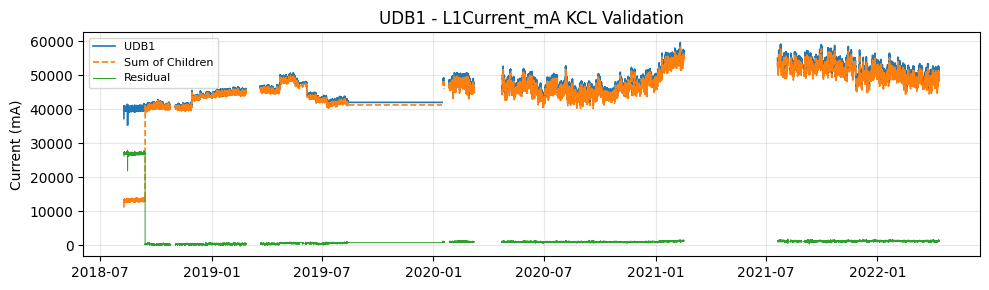


UDB2 | n=1,570,182 | MAE=234.29 mA | RMSE=302.11 mA | MAPE=0.53%
Contributions:
  ULC2  :  29.66%
  ULC4  :  14.48%
  ULC6  :  23.44%
  ULC8  :  13.41%
  ULC10 :  13.14%
  ULC12 :   5.66%


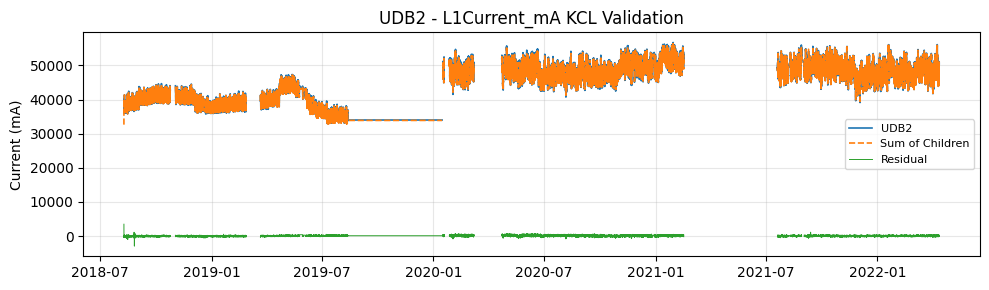


ADB | n=1,570,143 | MAE=12131.36 mA | RMSE=12976.44 mA | MAPE=10.37%
Contributions:
  CRAC1 :  17.82%
  CRAC2 :  14.96%
  CRAC3 :  16.37%
  CRAC4 :  10.11%
  CRAC5 :  20.31%
  CRAC6 :  10.07%


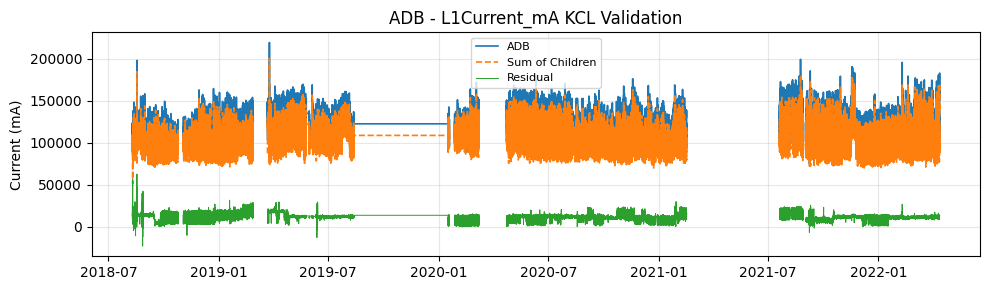


################################################################################
L2Current_mA
################################################################################

UDB1 | n=1,570,162 | MAE=2084.69 mA | RMSE=7552.69 mA | MAPE=4.02%
Contributions:
  ULC1  :  41.69%
  ULC3  :  18.39%
  ULC5  :  15.43%
  ULC7  :   3.93%
  ULC9  :  16.71%
  ULC11 :   0.00%


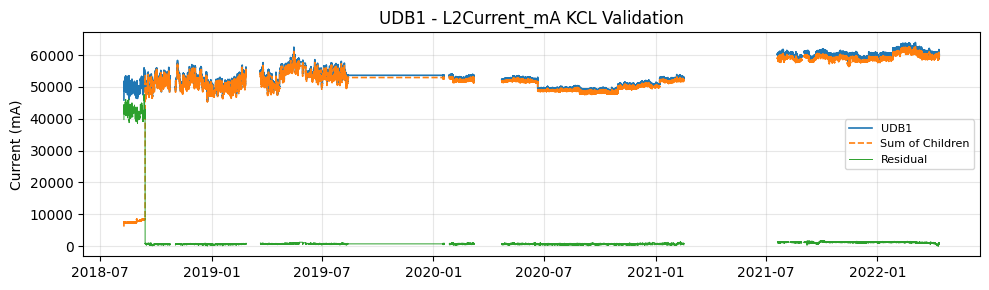


UDB2 | n=1,570,182 | MAE=524.03 mA | RMSE=634.82 mA | MAPE=1.21%
Contributions:
  ULC2  :  21.53%
  ULC4  :  22.72%
  ULC6  :  19.89%
  ULC8  :  10.01%
  ULC10 :  24.12%
  ULC12 :   0.53%


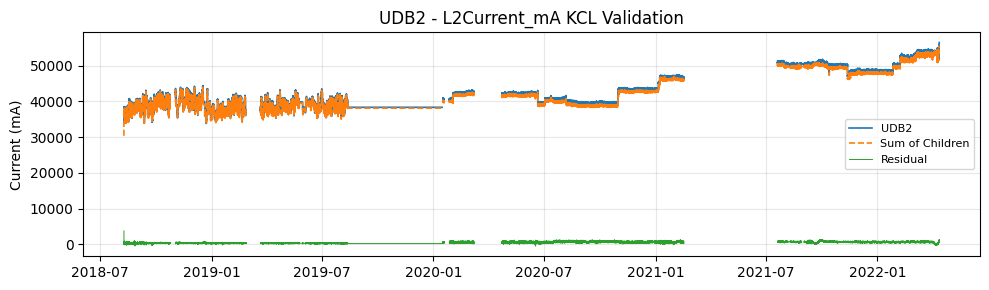


ADB | n=1,570,143 | MAE=10514.83 mA | RMSE=14153.28 mA | MAPE=9.73%
Contributions:
  CRAC1 :  15.92%
  CRAC2 :  13.60%
  CRAC3 :  15.35%
  CRAC4 :   9.00%
  CRAC5 :  19.29%
  CRAC6 :  16.69%


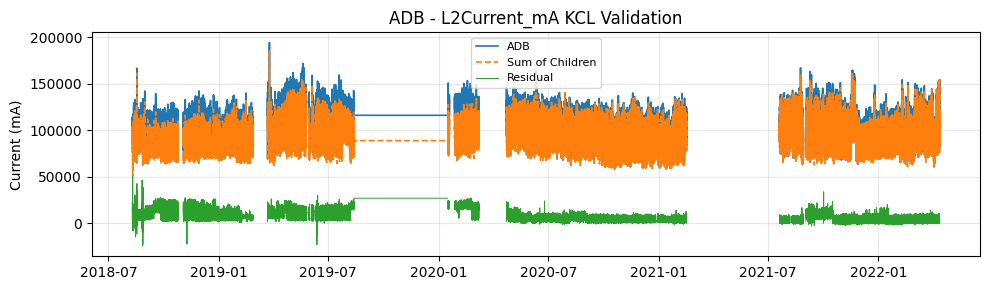


################################################################################
L3Current_mA
################################################################################

UDB1 | n=1,570,162 | MAE=1964.70 mA | RMSE=5538.00 mA | MAPE=4.65%
Contributions:
  ULC1  :  14.92%
  ULC3  :  17.13%
  ULC5  :  24.56%
  ULC7  :  22.76%
  ULC9  :  16.22%
  ULC11 :   0.00%


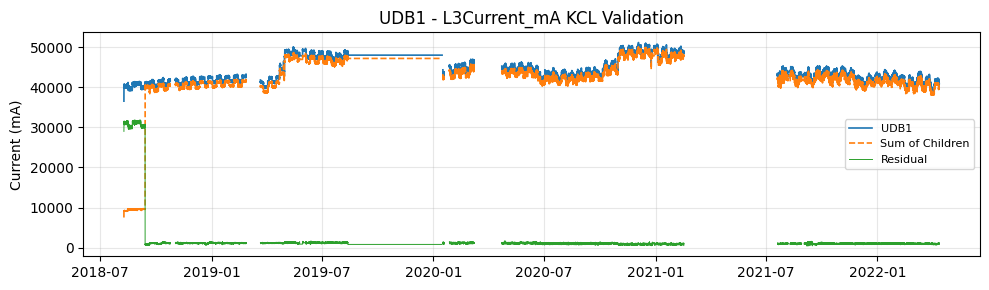


UDB2 | n=1,570,182 | MAE=674.74 mA | RMSE=749.68 mA | MAPE=1.49%
Contributions:
  ULC2  :  14.88%
  ULC4  :  20.70%
  ULC6  :  25.75%
  ULC8  :  25.41%
  ULC10 :  11.51%
  ULC12 :   0.26%


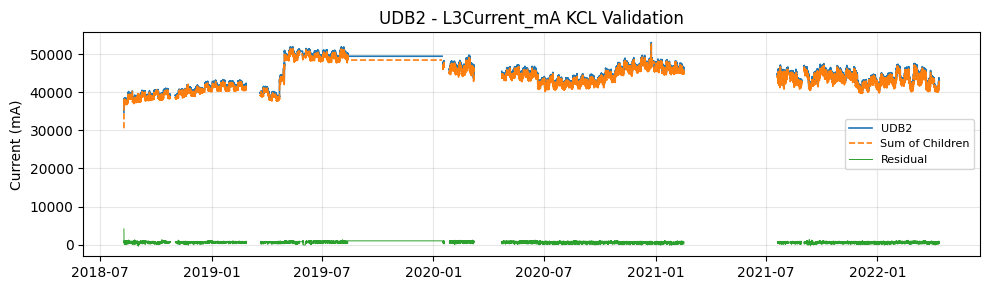


ADB | n=1,570,143 | MAE=10497.03 mA | RMSE=12366.54 mA | MAPE=10.94%
Contributions:
  CRAC1 :  16.25%
  CRAC2 :  13.88%
  CRAC3 :  16.43%
  CRAC4 :   9.57%
  CRAC5 :  19.51%
  CRAC6 :  13.35%


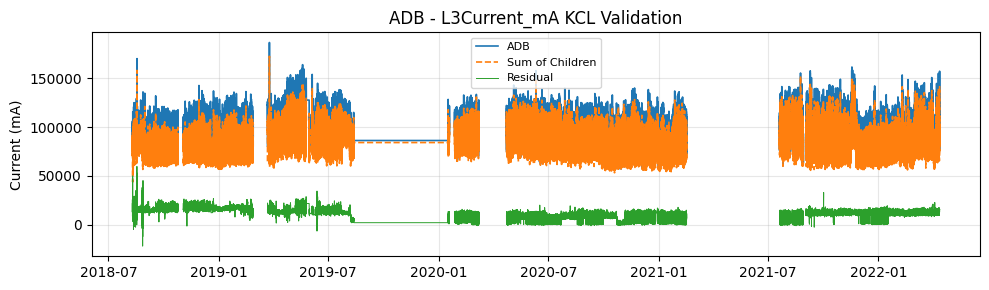


################################################################################
NeutralCurrentN_mA
################################################################################

UDB1 | n=1,570,162 | MAE=26830.50 mA | RMSE=27171.62 mA | MAPE=1144427064064791191818136872418572421300224.00%
Contributions:
  ULC1  : 105.61%
  ULC3  :  50.00%
  ULC5  :  34.64%
  ULC7  :  58.42%
  ULC9  :  34.43%
  ULC11 :   0.00%


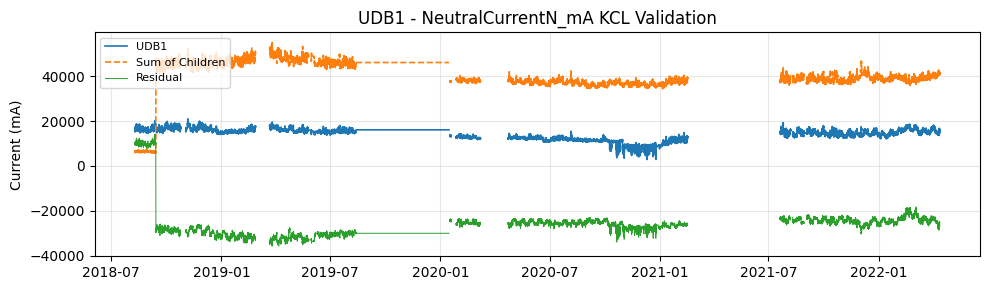


UDB2 | n=1,570,182 | MAE=31588.65 mA | RMSE=32356.91 mA | MAPE=342254470203357307568388076496099114745856.00%
Contributions:
  ULC2  :  66.99%
  ULC4  :  39.72%
  ULC6  :  38.65%
  ULC8  :  58.65%
  ULC10 : 133.54%
  ULC12 :  21.51%


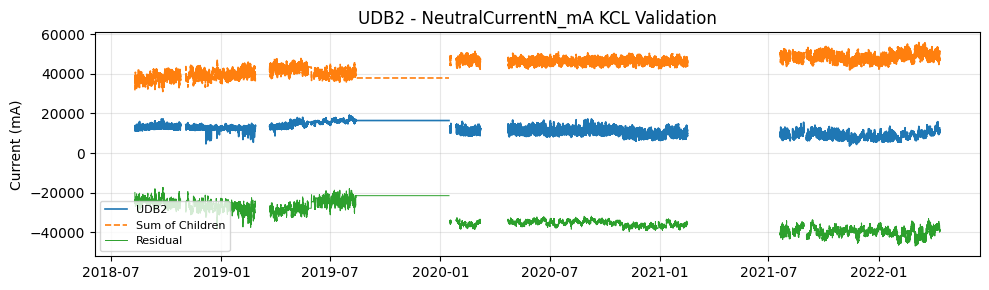


ADB | n=1,570,143 | MAE=8357.09 mA | RMSE=9751.82 mA | MAPE=646629276407458492589284456758316630016.00%
Contributions:
  CRAC1 :  23.53%
  CRAC2 :  18.73%
  CRAC3 :  19.12%
  CRAC4 :  16.73%
  CRAC5 :  20.40%
  CRAC6 :  17.95%


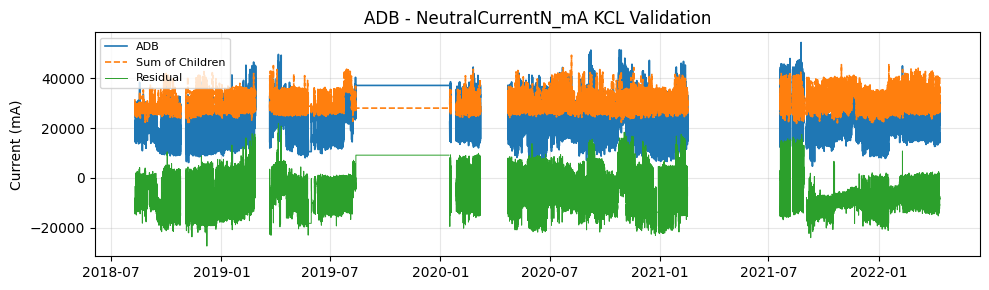

In [ ]:
# =============================================================================
# Parent-Child Current Validation - KCL
# =============================================================================

CURRENT_METRICS = [
    "L1Current_mA",
    "L2Current_mA",
    "L3Current_mA",
    "NeutralCurrentN_mA"
]

TOPOLOGY = {
    "UDB1": ["ULC1", "ULC3", "ULC5", "ULC7", "ULC9", "ULC11"],
    "UDB2": ["ULC2", "ULC4", "ULC6", "ULC8", "ULC10", "ULC12"],
    "ADB": ["CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6"],
}

for metric in CURRENT_METRICS:

    print(f"\n{'#' * 80}\n{metric}\n{'#' * 80}")

    for parent, children in TOPOLOGY.items():

        frames = {parent: datasets[parent][metric]}

        for child in children:
            if metric in datasets[child]:
                frames[child] = datasets[child][metric]

        comparison = pd.concat(frames, axis=1).dropna()

        if comparison.empty:
            print(f"{parent}: no complete overlapping data")
            continue

        comparison["Children_Sum"] = comparison[children].sum(axis=1)
        residual = comparison[parent] - comparison["Children_Sum"]

        mae = residual.abs().mean()
        rmse = np.sqrt((residual ** 2).mean())
        parent_mean = comparison[parent].mean()

        relative_error = (
            residual.abs() / comparison[parent].abs()
        ).replace([np.inf, -np.inf], np.nan).mean() * 100

        print(
            f"\n{parent} | "
            f"n={len(comparison):,} | "
            f"MAE={mae:.2f} mA | "
            f"RMSE={rmse:.2f} mA | "
            f"MAPE={relative_error:.2f}%"
        )

        print("Contributions:")
        for child in children:
            contribution = comparison[child].mean() / parent_mean * 100
            print(f"  {child:<6}: {contribution:6.2f}%")

        # Plot at 15-minute resolution; validation remains 1-minute
        plot_df = comparison.resample("15min").mean()

        fig, ax = plt.subplots(figsize=(10, 3))
        ax.plot(plot_df.index, plot_df[parent], linewidth=1.2, label=parent)
        ax.plot(plot_df.index, plot_df["Children_Sum"], "--", linewidth=1.2, label="Sum of Children")
        ax.plot(plot_df.index, (plot_df[parent] - plot_df["Children_Sum"]), linewidth=0.7, label="Residual")

        ax.set(title=f"{parent} - {metric} KCL Validation", ylabel="Current (mA)")
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)
        plt.tight_layout()
        plt.show()
        plt.close(fig)

ADB    | n=1,570,251 | MAE=3,108.02 mA | RMSE=3,618.48 mA | r=0.9709


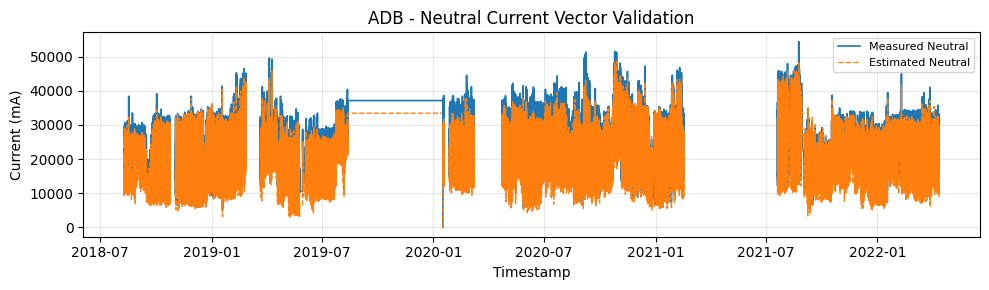

CRAC1  | n=1,570,217 | MAE=885.56 mA | RMSE=969.93 mA | r=0.9948


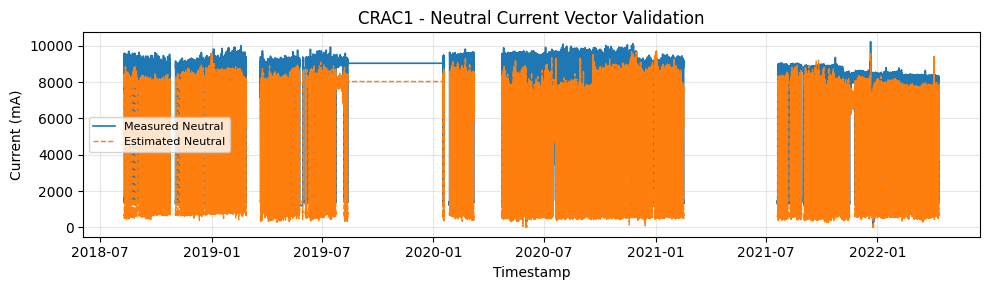

CRAC2  | n=1,570,692 | MAE=704.90 mA | RMSE=792.87 mA | r=0.9952


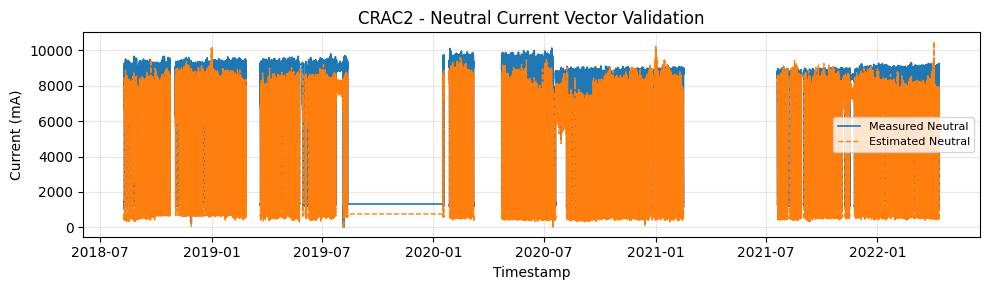

CRAC3  | n=1,570,185 | MAE=1,342.33 mA | RMSE=1,582.10 mA | r=0.9748


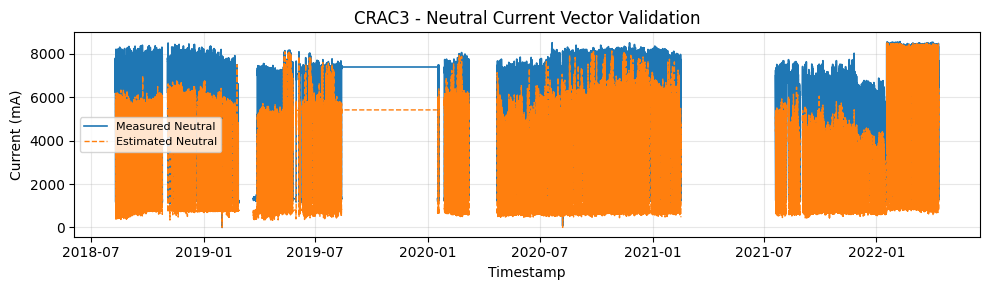

CRAC4  | n=1,570,203 | MAE=1,535.41 mA | RMSE=1,955.78 mA | r=0.9808


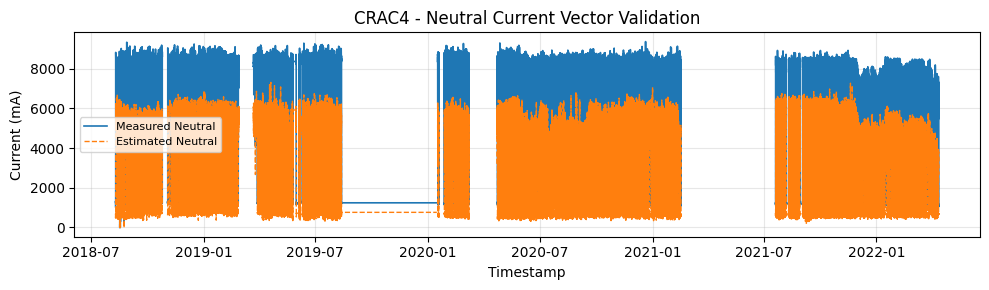

CRAC5  | n=1,570,686 | MAE=455.31 mA | RMSE=569.42 mA | r=0.9931


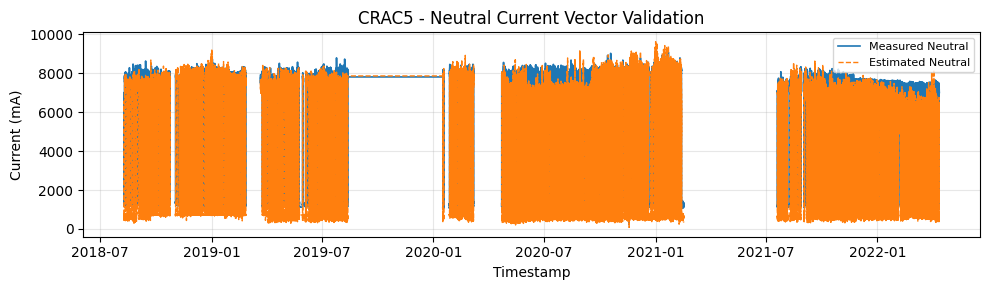

CRAC6  | n=1,570,691 | MAE=1,130.24 mA | RMSE=1,454.29 mA | r=0.9860


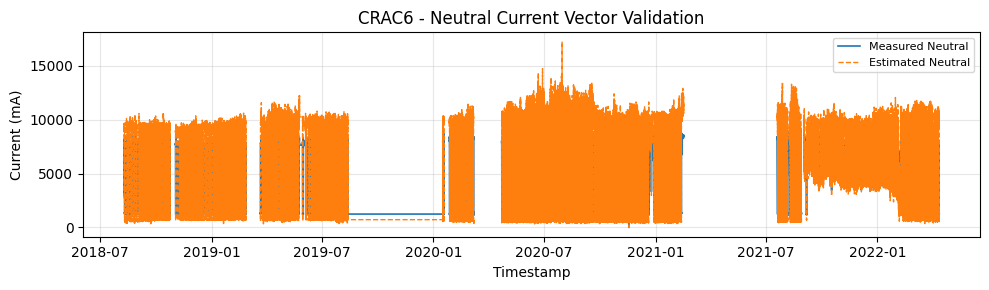

IUDB   | n=1,570,220 | MAE=18,074.27 mA | RMSE=18,853.38 mA | r=0.0254


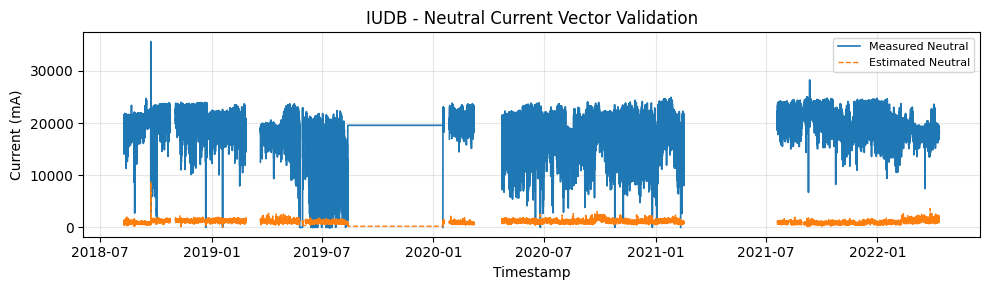

NDB    | n=1,570,241 | MAE=305.30 mA | RMSE=327.45 mA | r=0.9864


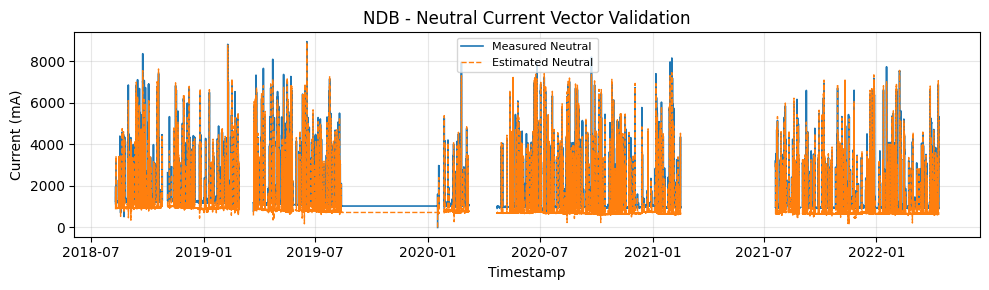

UDB1   | n=1,570,724 | MAE=5,029.30 mA | RMSE=5,588.33 mA | r=0.6262


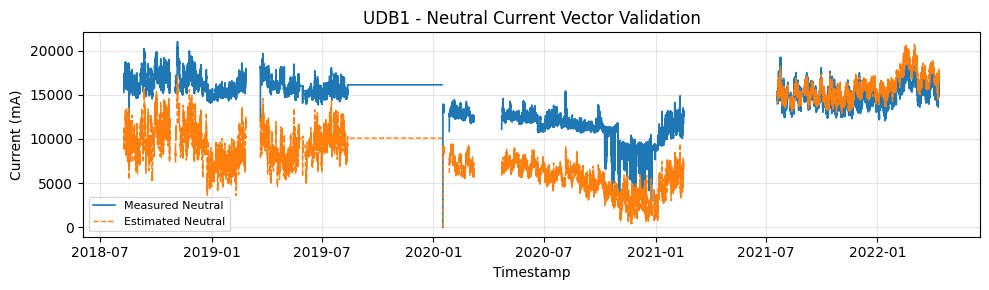

UDB2   | n=1,570,721 | MAE=193,532,827,591.52 mA | RMSE=171,509,885,852,341.94 mA | r=-1.0000


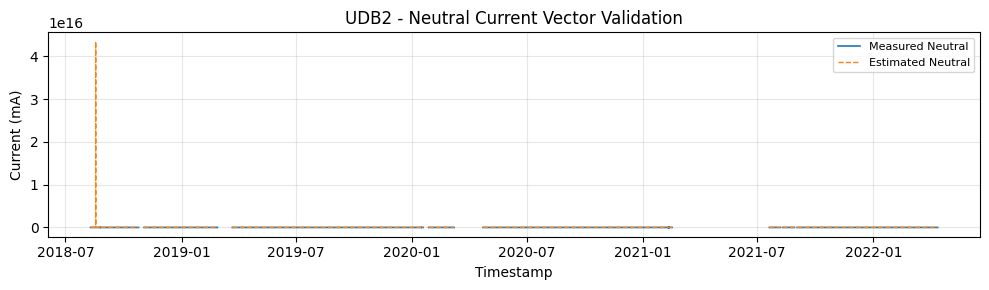

UDB3   | n=1,570,732 | MAE=2,902.76 mA | RMSE=2,982.44 mA | r=0.8740


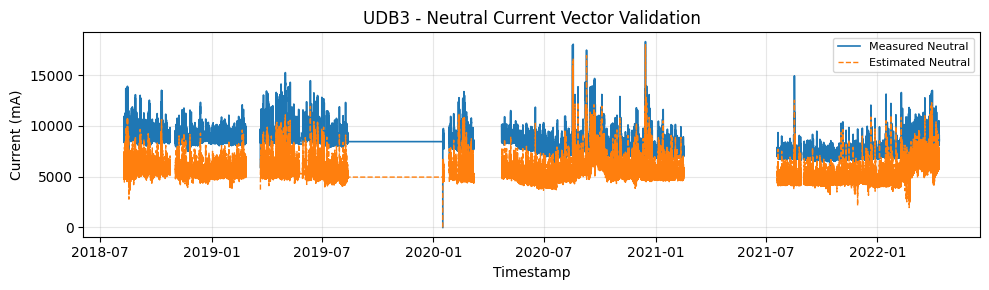

ULC1   | n=1,570,692 | MAE=388.01 mA | RMSE=457.88 mA | r=0.9971


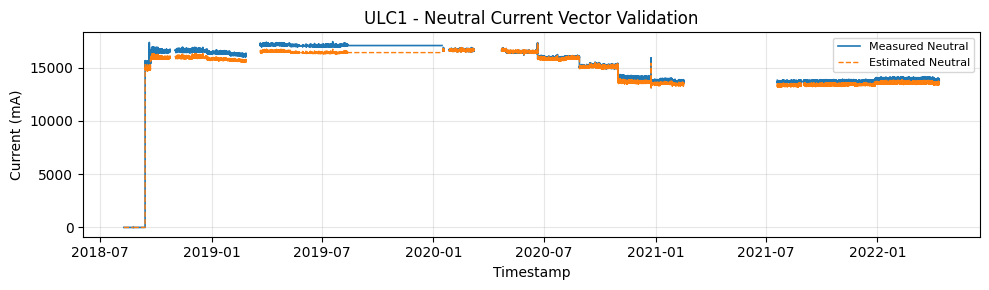

ULC10  | n=1,570,688 | MAE=10,580.14 mA | RMSE=10,961.98 mA | r=0.7137


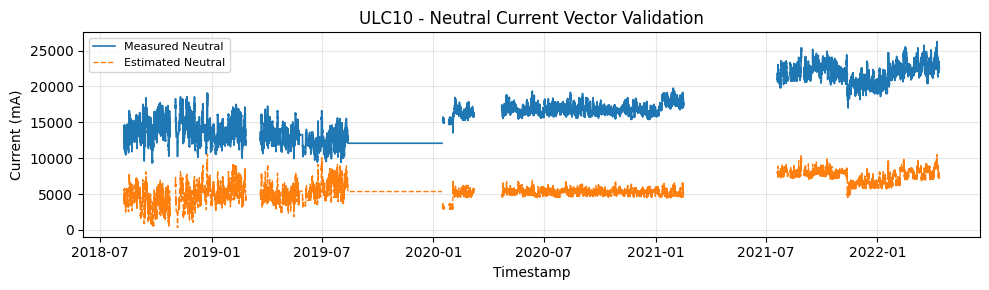

ULC11  | n=1,570,703 | MAE=0.00 mA | RMSE=0.32 mA | r=0.9883


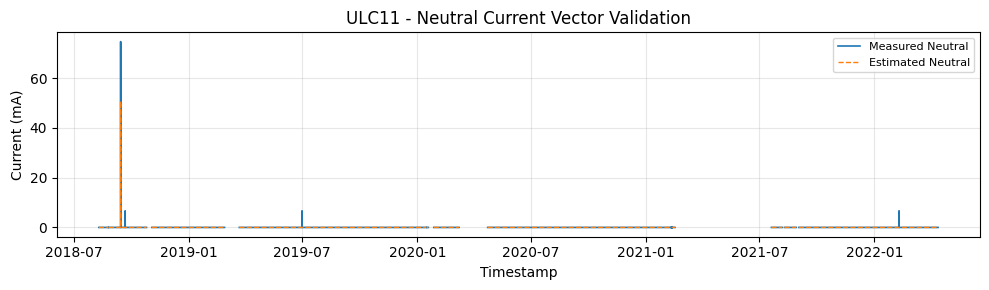

ULC12  | n=1,570,685 | MAE=284.19 mA | RMSE=314.84 mA | r=0.9959


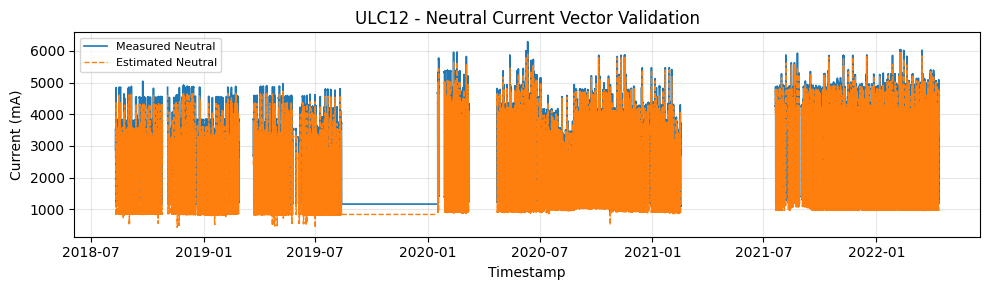

ULC2   | n=1,570,687 | MAE=2,060.17 mA | RMSE=2,085.96 mA | r=0.9982


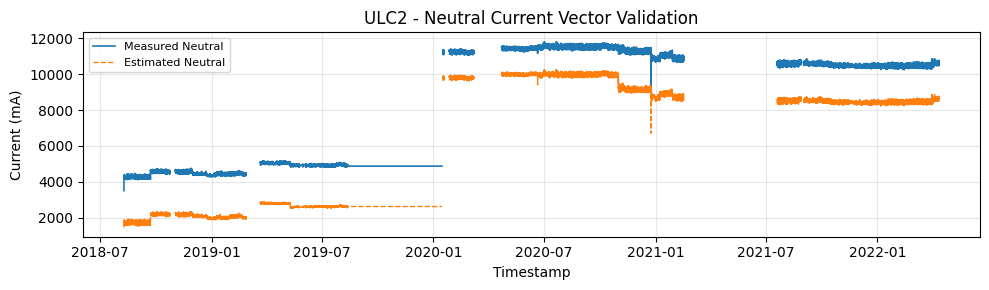

ULC3   | n=1,570,687 | MAE=2,968.31 mA | RMSE=3,155.82 mA | r=0.8675


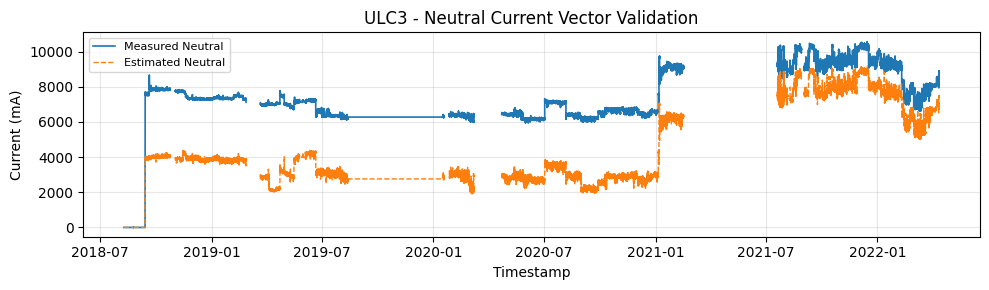

ULC4   | n=1,570,688 | MAE=1,059.60 mA | RMSE=1,123.50 mA | r=0.8150


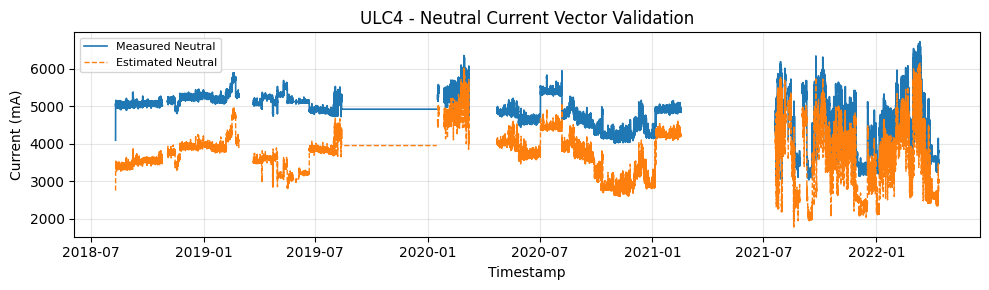

ULC5   | n=1,570,191 | MAE=653.08 mA | RMSE=810.73 mA | r=0.8139


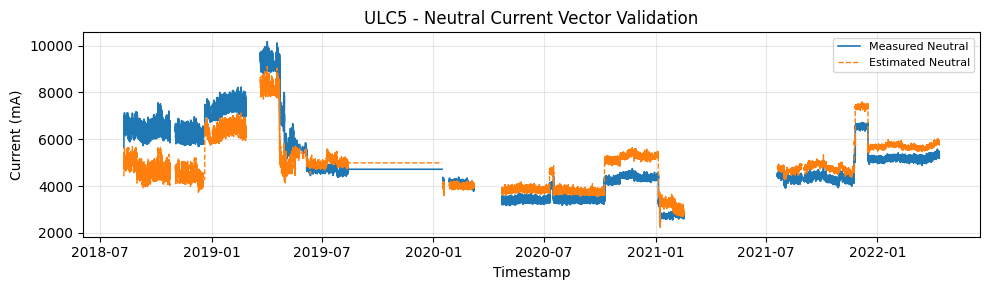

ULC6   | n=1,570,198 | MAE=398.21 mA | RMSE=506.93 mA | r=0.9562


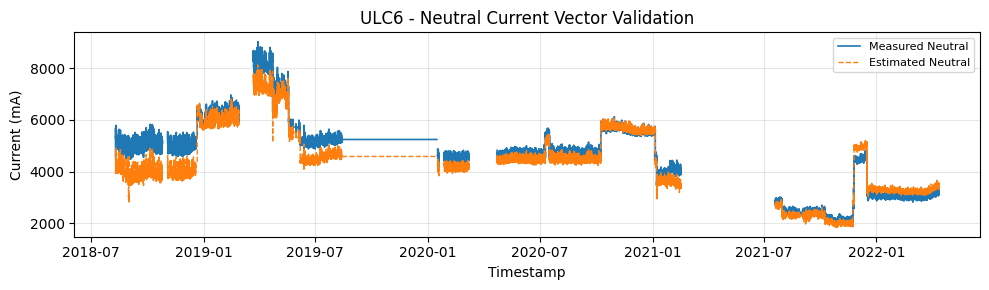

ULC7   | n=1,570,694 | MAE=917.64 mA | RMSE=956.25 mA | r=0.9923


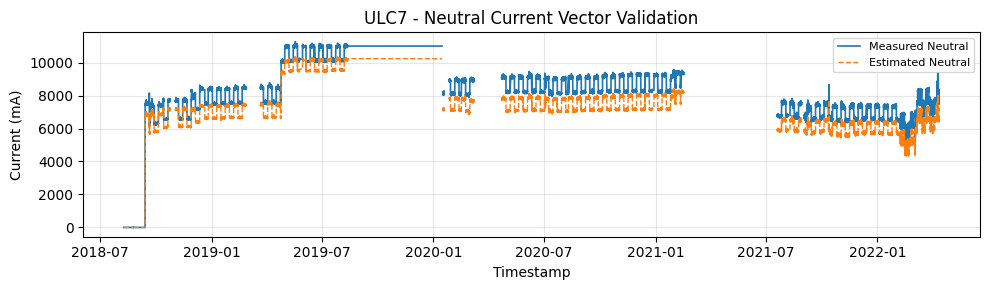

ULC8   | n=1,570,684 | MAE=257.41 mA | RMSE=402.40 mA | r=0.9890


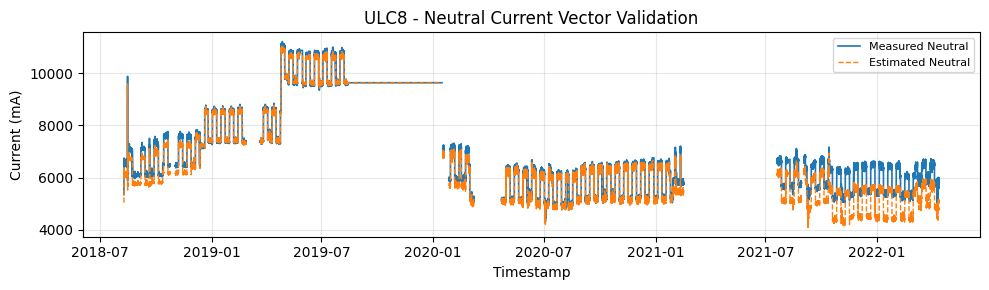

ULC9   | n=1,570,692 | MAE=510.92 mA | RMSE=707.13 mA | r=0.9817


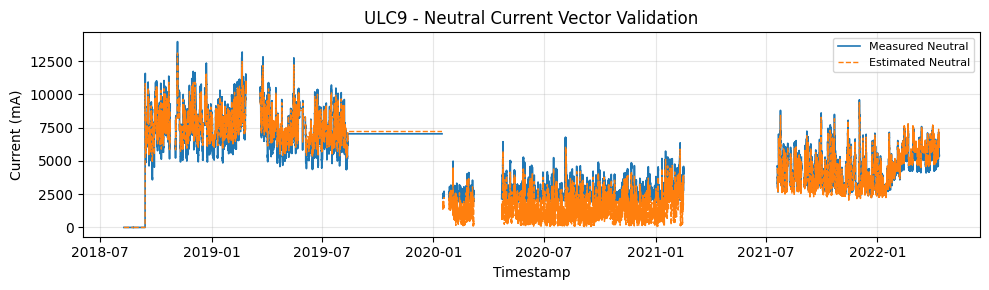

In [15]:
# =============================================================================
# Neutral Current Vector Validation
# Measured Neutral vs Estimated Neutral from Phase Currents
# =============================================================================

CURRENT_COLS = [
    "L1Current_mA",
    "L2Current_mA",
    "L3Current_mA",
    "NeutralCurrentN_mA",
]

for device, df in datasets.items():

    if not all(col in df.columns for col in CURRENT_COLS):
        continue

    data = df[CURRENT_COLS].dropna().copy()

    # Estimated neutral current from three phase currents
    data["Estimated_N"] = np.sqrt(
        np.maximum(
            data["L1Current_mA"]**2
            + data["L2Current_mA"]**2
            + data["L3Current_mA"]**2
            - data["L1Current_mA"] * data["L2Current_mA"]
            - data["L2Current_mA"] * data["L3Current_mA"]
            - data["L3Current_mA"] * data["L1Current_mA"],
            0,
        )
    )

    residual = data["NeutralCurrentN_mA"] - data["Estimated_N"]

    mae = residual.abs().mean()
    rmse = np.sqrt((residual**2).mean())
    corr = data["NeutralCurrentN_mA"].corr(data["Estimated_N"])

    print(
        f"{device:<6} | "
        f"n={len(data):,} | "
        f"MAE={mae:,.2f} mA | "
        f"RMSE={rmse:,.2f} mA | "
        f"r={corr:.4f}"
    )

    # 15-minute resolution for plotting only
    plot_df = data.resample("15min").mean()

    fig, ax = plt.subplots(figsize=(10, 3))
    ax.plot(
        plot_df.index,
        plot_df["NeutralCurrentN_mA"],
        linewidth=1.2,
        label="Measured Neutral",
    )
    ax.plot(
        plot_df.index,
        plot_df["Estimated_N"],
        "--",
        linewidth=1,
        label="Estimated Neutral",
    )

    ax.set(
        title=f"{device} - Neutral Current Vector Validation",
        ylabel="Current (mA)",
        xlabel="Timestamp",
    )
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=8)

    plt.tight_layout()
    plt.show()
    plt.close(fig)

# Validate Voltage:


################################################################################
L1PhaseVoltage_Vx10
################################################################################
UDB1  | n=1,570,162 | MAE=5.77 Vx10 | RMSE=6.07 Vx10 | MAPE=0.251%


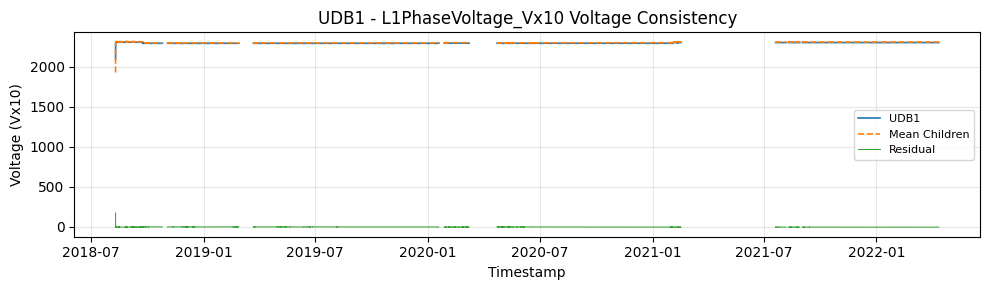

UDB2  | n=1,570,182 | MAE=4.54 Vx10 | RMSE=5.06 Vx10 | MAPE=0.198%


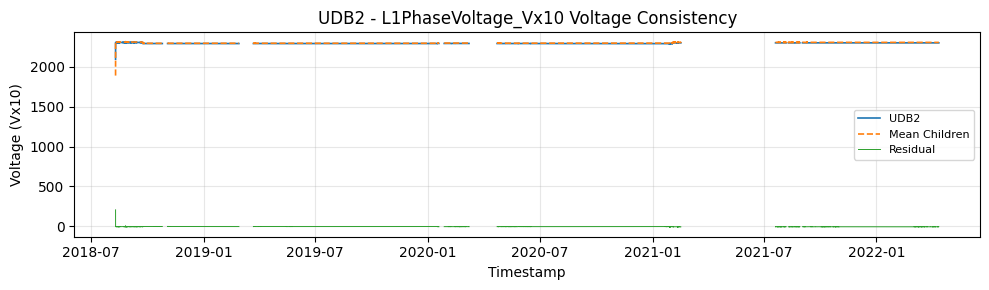

ADB   | n=1,570,143 | MAE=6.11 Vx10 | RMSE=7.52 Vx10 | MAPE=0.270%


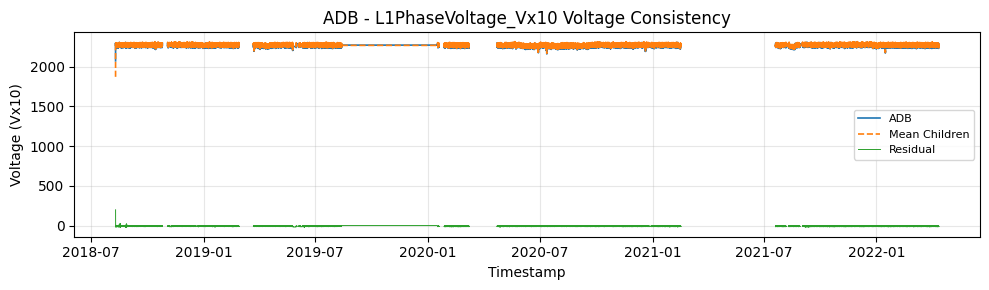


################################################################################
L2PhaseVoltage_Vx10
################################################################################
UDB1  | n=1,570,162 | MAE=7.05 Vx10 | RMSE=8.19 Vx10 | MAPE=0.308%


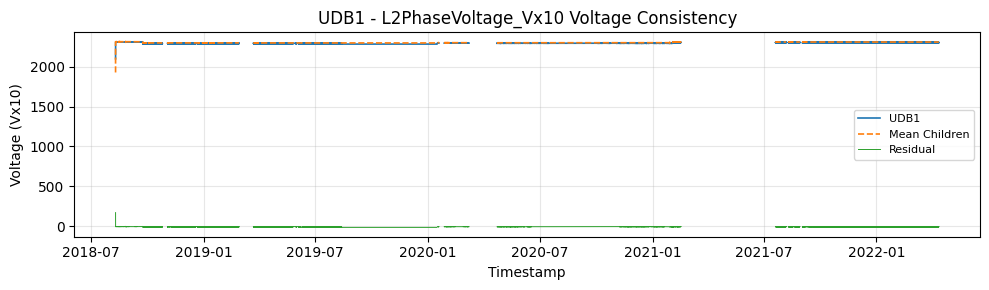

UDB2  | n=1,570,182 | MAE=5.06 Vx10 | RMSE=5.86 Vx10 | MAPE=0.220%


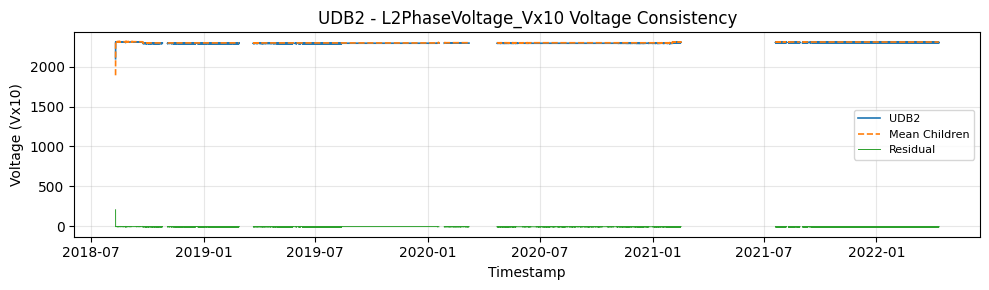

ADB   | n=1,570,143 | MAE=8.03 Vx10 | RMSE=9.13 Vx10 | MAPE=0.352%


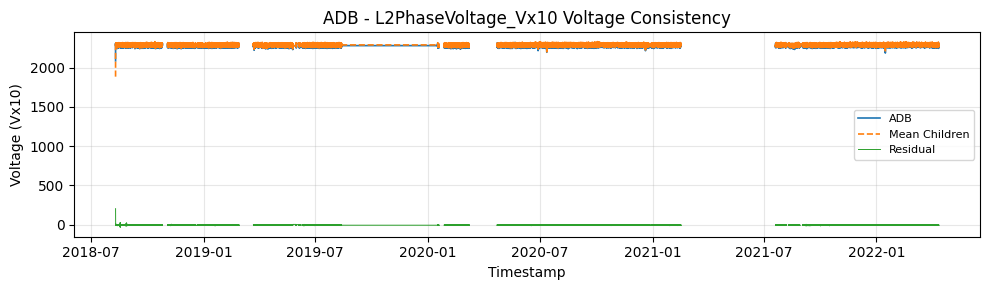


################################################################################
L3PhaseVoltage_Vx10
################################################################################
UDB1  | n=1,570,162 | MAE=6.22 Vx10 | RMSE=7.49 Vx10 | MAPE=0.271%


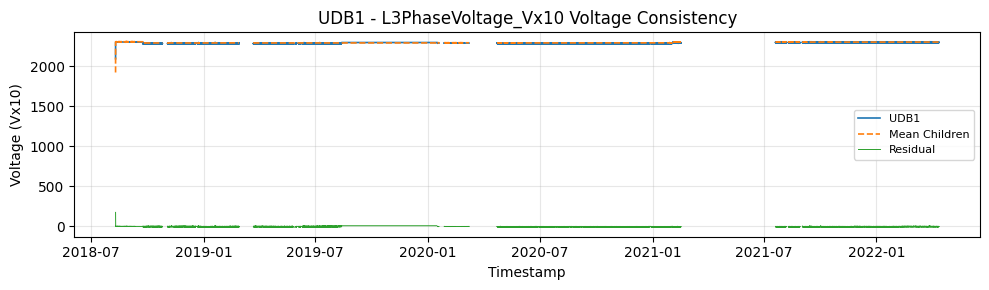

UDB2  | n=1,570,182 | MAE=8.24 Vx10 | RMSE=9.74 Vx10 | MAPE=0.360%


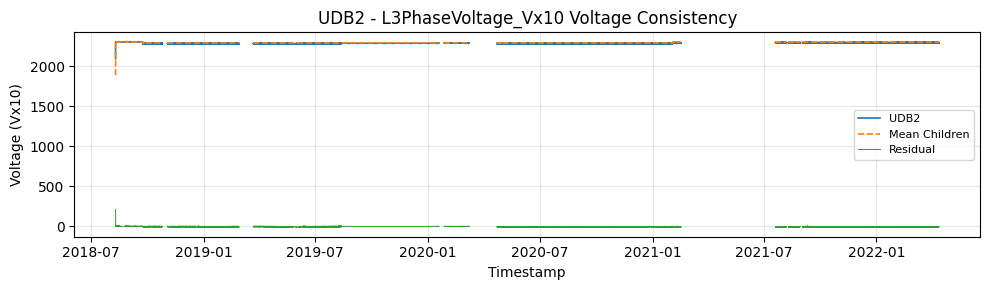

ADB   | n=1,570,143 | MAE=7.12 Vx10 | RMSE=8.49 Vx10 | MAPE=0.313%


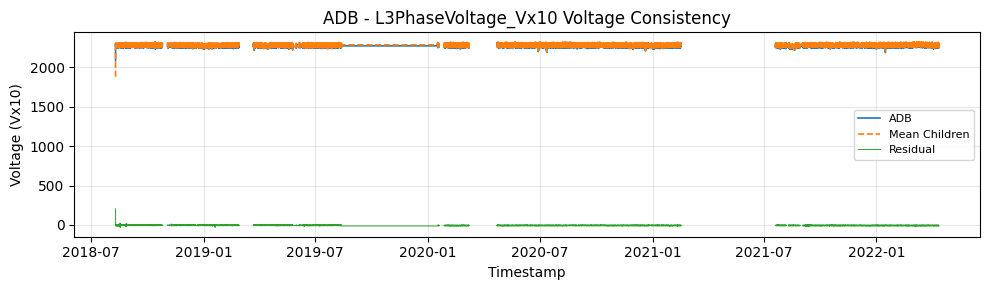


################################################################################
L1L2Voltage_Vx10
################################################################################
UDB1  | n=1,570,162 | MAE=8.29 Vx10 | RMSE=10.37 Vx10 | MAPE=0.209%


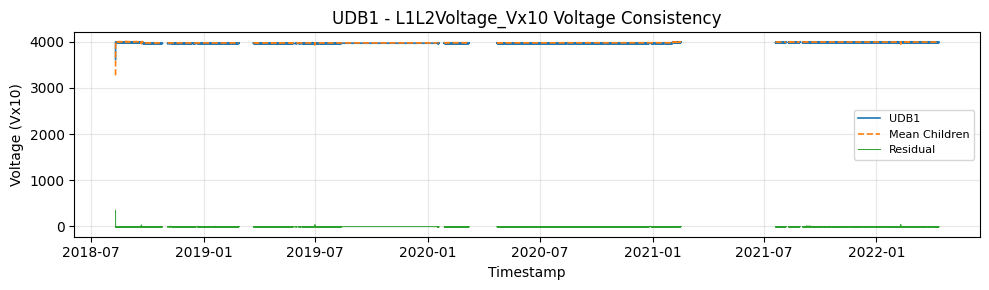

UDB2  | n=1,570,182 | MAE=8.38 Vx10 | RMSE=10.36 Vx10 | MAPE=0.211%


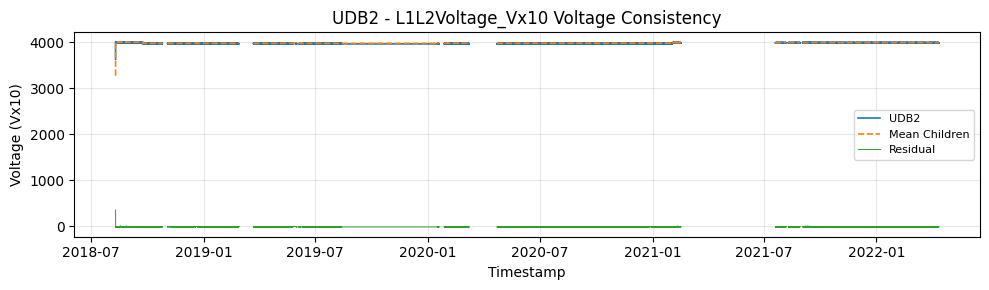

ADB   | n=1,570,143 | MAE=9.41 Vx10 | RMSE=11.74 Vx10 | MAPE=0.240%


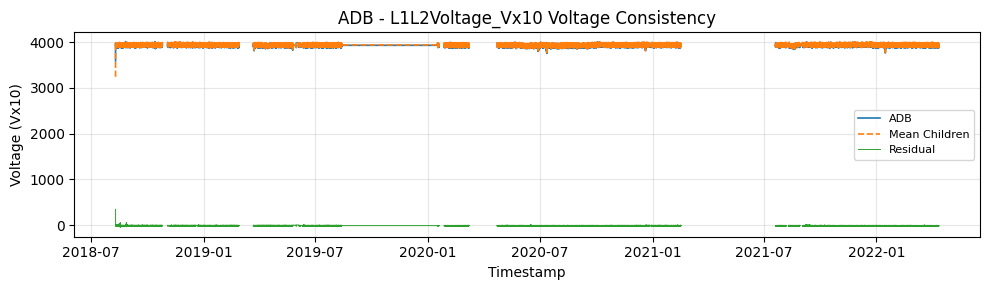


################################################################################
L2L3Voltage_Vx10
################################################################################
UDB1  | n=1,570,162 | MAE=4.05 Vx10 | RMSE=5.37 Vx10 | MAPE=0.102%


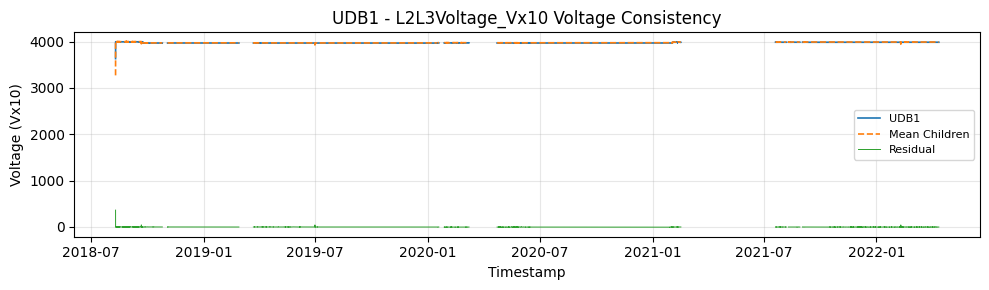

UDB2  | n=1,570,182 | MAE=4.44 Vx10 | RMSE=5.74 Vx10 | MAPE=0.112%


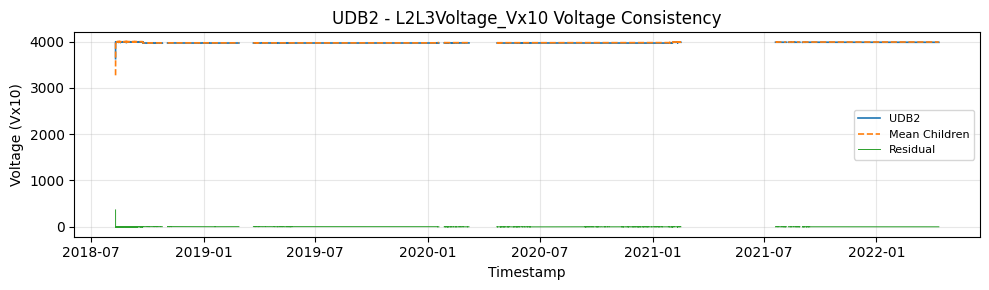

ADB   | n=1,570,143 | MAE=11.73 Vx10 | RMSE=14.02 Vx10 | MAPE=0.297%


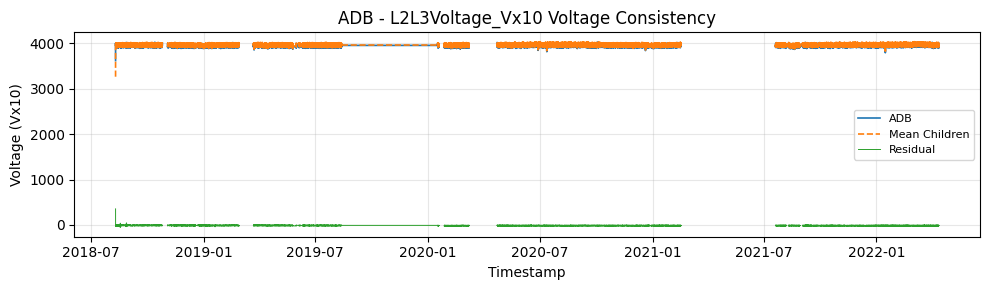


################################################################################
L3L1Voltage_Vx10
################################################################################
UDB1  | n=1,570,162 | MAE=17.01 Vx10 | RMSE=17.39 Vx10 | MAPE=0.428%


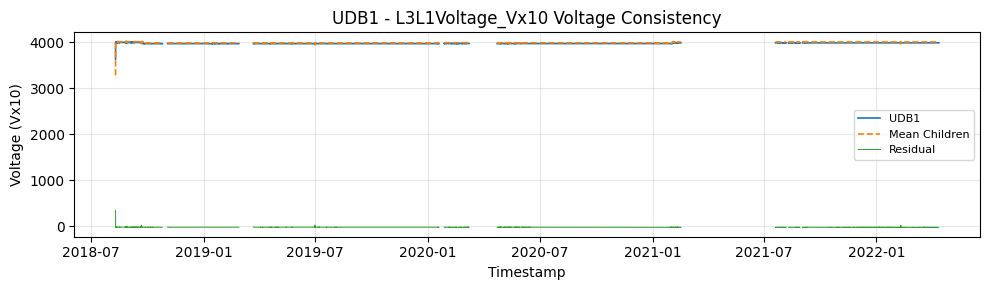

UDB2  | n=1,570,182 | MAE=16.41 Vx10 | RMSE=16.81 Vx10 | MAPE=0.413%


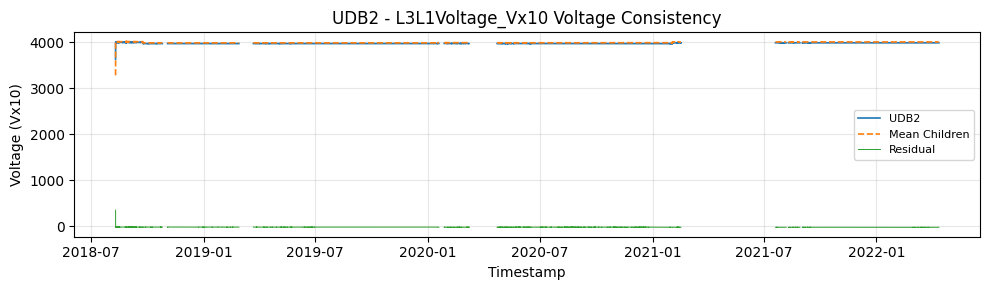

ADB   | n=1,570,143 | MAE=16.33 Vx10 | RMSE=18.38 Vx10 | MAPE=0.415%


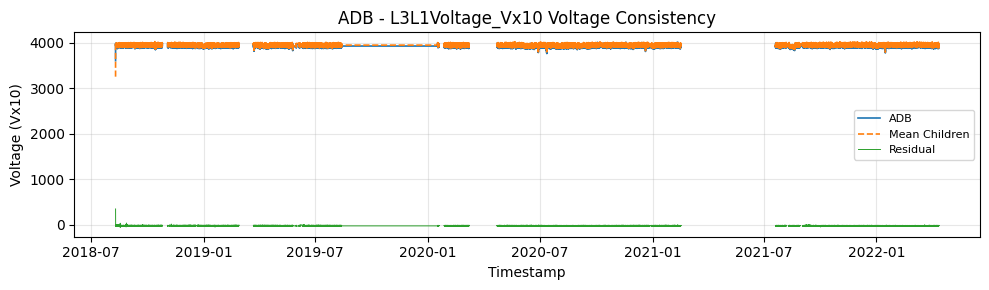

In [16]:
# =============================================================================
# Voltage Consistency Validation
# Parent Bus Voltage vs Mean Child Voltage
# =============================================================================

VOLTAGE_METRICS = [
    "L1PhaseVoltage_Vx10",
    "L2PhaseVoltage_Vx10",
    "L3PhaseVoltage_Vx10",
    "L1L2Voltage_Vx10",
    "L2L3Voltage_Vx10",
    "L3L1Voltage_Vx10",
]

TOPOLOGY = {
    "UDB1": ["ULC1", "ULC3", "ULC5", "ULC7", "ULC9", "ULC11"],
    "UDB2": ["ULC2", "ULC4", "ULC6", "ULC8", "ULC10", "ULC12"],
    "ADB": ["CRAC1", "CRAC2", "CRAC3", "CRAC4", "CRAC5", "CRAC6"],
}

for metric in VOLTAGE_METRICS:

    print(f"\n{'#' * 80}\n{metric}\n{'#' * 80}")

    for parent, children in TOPOLOGY.items():

        if metric not in datasets[parent]:
            continue

        frames = {parent: datasets[parent][metric]}

        for child in children:
            if metric in datasets[child]:
                frames[child] = datasets[child][metric]

        comparison = pd.concat(frames, axis=1).dropna()

        if comparison.empty:
            continue

        comparison["Children_Mean"] = comparison[children].mean(axis=1)
        residual = comparison[parent] - comparison["Children_Mean"]

        mae = residual.abs().mean()
        rmse = np.sqrt((residual ** 2).mean())
        mape = (
            residual.abs() / comparison[parent].abs()
        ).replace([np.inf, -np.inf], np.nan).mean() * 100

        print(
            f"{parent:<5} | n={len(comparison):,} | "
            f"MAE={mae:.2f} Vx10 | "
            f"RMSE={rmse:.2f} Vx10 | "
            f"MAPE={mape:.3f}%"
        )

        plot_df = comparison.resample("15min").mean()

        fig, ax = plt.subplots(figsize=(10, 3))
        ax.plot(plot_df.index, plot_df[parent], linewidth=1.2, label=parent)
        ax.plot(plot_df.index, plot_df["Children_Mean"], "--", linewidth=1.2, label="Mean Children")
        ax.plot(plot_df.index, plot_df[parent] - plot_df["Children_Mean"],
                linewidth=0.7, label="Residual")

        ax.set(
            title=f"{parent} - {metric} Voltage Consistency",
            ylabel="Voltage (Vx10)",
            xlabel="Timestamp",
        )
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=8)
        plt.tight_layout()
        plt.show()
        plt.close(fig)

## Voltage Consistency

Parent and child meter voltages were compared across phase-to-neutral and line-to-line voltage measurements.

- All parent–child voltage comparisons produced mean absolute errors below 0.5%.
- Voltage measurements are therefore highly consistent across the electrical hierarchy.
- No significant voltage telemetry anomalies were identified.

In [17]:
# =============================================================================
# Physical Voltage & Balance Validation
# =============================================================================

PHASES = ["L1PhaseVoltage_Vx10", "L2PhaseVoltage_Vx10", "L3PhaseVoltage_Vx10"]
LINES = ["L1L2Voltage_Vx10", "L2L3Voltage_Vx10", "L3L1Voltage_Vx10"]

for device, df in datasets.items():

    cols = PHASES + LINES

    if not all(col in df.columns for col in cols):
        continue

    data = df[cols].dropna()

    # -------------------------------------------------------------------------
    # Phase-to-line relationship: V_LL = sqrt(3) * V_phase
    # -------------------------------------------------------------------------

    pairs = [
        ("L1PhaseVoltage_Vx10", "L1L2Voltage_Vx10"),
        ("L2PhaseVoltage_Vx10", "L2L3Voltage_Vx10"),
        ("L3PhaseVoltage_Vx10", "L3L1Voltage_Vx10"),
    ]

    sqrt3_errors = []

    for phase, line in pairs:
        expected = np.sqrt(3) * data[phase]
        valid = expected.abs() > 0
        sqrt3_errors.append(
            ((data.loc[valid, line] - expected[valid]).abs() / expected[valid].abs()).mean() * 100
        )

    sqrt3_mape = np.mean(sqrt3_errors)

    # -------------------------------------------------------------------------
    # Phase voltage balance
    # -------------------------------------------------------------------------

    phase_mean = data[PHASES].mean(axis=1)
    phase_balance = (
        data[PHASES].sub(phase_mean, axis=0).abs()
        .div(phase_mean.abs(), axis=0)
        .mean(axis=1)
    ).mean() * 100

    # -------------------------------------------------------------------------
    # Line-to-line voltage balance
    # -------------------------------------------------------------------------

    line_mean = data[LINES].mean(axis=1)
    line_balance = (
        data[LINES].sub(line_mean, axis=0).abs()
        .div(line_mean.abs(), axis=0)
        .mean(axis=1)
    ).mean() * 100

    print(
        f"{device:<6} | "
        f"n={len(data):,} | "
        f"√3 relationship={sqrt3_mape:.3f}% | "
        f"Phase balance={phase_balance:.3f}% | "
        f"Line balance={line_balance:.3f}%"
    )

ADB    | n=1,570,251 | √3 relationship=0.259% | Phase balance=0.314% | Line balance=0.282%
CRAC1  | n=1,570,217 | √3 relationship=0.144% | Phase balance=0.333% | Line balance=0.234%
CRAC2  | n=1,570,692 | √3 relationship=0.150% | Phase balance=0.354% | Line balance=0.249%
CRAC3  | n=1,570,185 | √3 relationship=0.162% | Phase balance=0.361% | Line balance=0.257%
CRAC4  | n=1,570,203 | √3 relationship=0.130% | Phase balance=0.319% | Line balance=0.246%
CRAC5  | n=1,570,686 | √3 relationship=0.141% | Phase balance=0.343% | Line balance=0.250%
CRAC6  | n=1,570,691 | √3 relationship=0.132% | Phase balance=0.326% | Line balance=0.249%
IUDB   | n=1,570,220 | √3 relationship=0.300% | Phase balance=0.282% | Line balance=0.280%
NDB    | n=1,570,241 | √3 relationship=0.285% | Phase balance=0.308% | Line balance=0.280%
UDB1   | n=1,570,724 | √3 relationship=0.149% | Phase balance=0.140% | Line balance=0.071%
UDB2   | n=1,570,721 | √3 relationship=147891746518183073220649256355225427274702520320.00

## THD & Frequency:

In [18]:
# =============================================================================
# FREQUENCY & THD PLAUSIBILITY VALIDATION
# =============================================================================

import numpy as np
import pandas as pd

FREQ_COL = "L1Frequency_Hzx100"
FREQ_NOMINAL = 50.0
FREQ_TOLERANCE = 0.5
FREQ_SANITY = (40.0, 60.0)

THD_COLS = {
    "Current": {
        "L1CurrentTHD_x10": "L1Current_mA",
        "L2CurrentTHD_x10": "L2Current_mA",
        "L3CurrentTHD_x10": "L3Current_mA",
    },
    "Voltage": {
        "L1VoltageTHD_x10": "L1PhaseVoltage_Vx10",
        "L2VoltageTHD_x10": "L2PhaseVoltage_Vx10",
        "L3VoltageTHD_x10": "L3PhaseVoltage_Vx10",
    },
}

VOLTAGE_THD_SCREENING_LIMIT = 8.0

# =============================================================================
# FREQUENCY
# =============================================================================

freq_results = []

for device, df in datasets.items():

    if FREQ_COL not in df:
        continue

    freq = (df[FREQ_COL] / 100).dropna()
    freq = freq[freq.between(*FREQ_SANITY)]

    if freq.empty:
        continue

    in_band = freq.between(
        FREQ_NOMINAL - FREQ_TOLERANCE,
        FREQ_NOMINAL + FREQ_TOLERANCE,
    )

    freq_results.append({
        "Device": device,
        "Records": len(freq),
        "Mean_Hz": freq.mean(),
        "Std_Hz": freq.std(),
        "Min_Hz": freq.min(),
        "Max_Hz": freq.max(),
        "In_Band_%": in_band.mean() * 100,
    })

freq_summary = pd.DataFrame(freq_results)

print("=" * 100)
print(f"FREQUENCY PLAUSIBILITY | NOMINAL = {FREQ_NOMINAL} Hz | ±{FREQ_TOLERANCE} Hz")
print("=" * 100)
print(freq_summary.round(3).to_string(index=False))

# =============================================================================
# THD
# =============================================================================

thd_results = []

for device, df in datasets.items():

    for family, metrics in THD_COLS.items():

        for thd_col, magnitude_col in metrics.items():

            if thd_col not in df or magnitude_col not in df:
                continue

            work = df[[thd_col, magnitude_col]].dropna().copy()
            if work.empty:
                continue

            work["THD_%"] = work[thd_col] / 10
            work["Magnitude"] = work[magnitude_col].abs()

            high_thd = work["THD_%"] >= work["THD_%"].quantile(0.95)
            low_mag = work["Magnitude"] <= work["Magnitude"].quantile(0.10)

            result = {
                "Device": device,
                "Family": family,
                "Column": thd_col,
                "Records": len(work),
                "Mean_%": work["THD_%"].mean(),
                "Median_%": work["THD_%"].median(),
                "Max_%": work["THD_%"].max(),
                "Negative_%": (work["THD_%"] < 0).mean() * 100,
                "HighTHD_LowMag_%": (
                    low_mag[high_thd].mean() * 100
                    if high_thd.any() else np.nan
                ),
            }

            if family == "Voltage":
                result["Above_8%_%"] = (
                    work["THD_%"] > VOLTAGE_THD_SCREENING_LIMIT
                ).mean() * 100

            thd_results.append(result)

thd_summary = pd.DataFrame(thd_results)

print("\n" + "=" * 120)
print("THD PLAUSIBILITY VALIDATION")
print("=" * 120)
print(
    "HighTHD_LowMag_% = percentage of top-5% THD observations occurring "
    "within the device's bottom-10% magnitude."
)
print("Voltage >8% is reported as a screening criterion, not a universal failure limit.")
print("=" * 120)

print(thd_summary.round(3).to_string(index=False))

FREQUENCY PLAUSIBILITY | NOMINAL = 50.0 Hz | ±0.5 Hz
Device  Records  Mean_Hz  Std_Hz  Min_Hz  Max_Hz  In_Band_%
 CRAC1  1570214   49.988   0.036   49.43   50.18    100.000
 CRAC2  1570690   50.005   0.037   49.30   50.20     99.999
 CRAC3  1570183   50.016   0.037   49.45   50.21     99.999
 CRAC4  1570200   49.958   0.037   49.29   50.15     99.987
 CRAC5  1570684   50.003   0.038   47.53   50.19     99.989
 CRAC6  1570689   49.980   0.037   49.30   50.17     99.988
  ULC1  1570687   50.007   0.037   49.31   50.20     99.989
 ULC10  1570686   49.990   0.036   49.27   50.78    100.000
 ULC11  1570686   50.009   0.036   49.47   50.20    100.000
 ULC12  1570683   49.994   0.035   49.26   50.19    100.000
  ULC2  1570685   49.989   0.036   49.41   50.75     99.992
  ULC3  1570682   49.982   0.036   49.29   50.17     99.988
  ULC4  1570686   49.968   0.036   49.26   50.16     99.999
  ULC5  1570189   49.957   0.037   49.24   50.15    100.000
  ULC6  1570196   49.972   0.036   49.43   50.1

## ⏰ Maximum Demand Counter Validation:

In [23]:
# =============================================================================
# MAXIMUM DEMAND — NEGATIVE VALUES + OUTLIER CHECK
# =============================================================================

import numpy as np
import pandas as pd

MAX_DEMAND_COLS = [
    "MaximumDemandIAVG_mA",
    "MaximumDemandIL1_mA",
    "MaximumDemandIL2_mA",
    "MaximumDemandIL3_mA",
    "MaximumDemandkWIII_W",
    "MaximumDemandkVAIII_VA",
]

results = []

for device, df in datasets.items():

    for col in MAX_DEMAND_COLS:

        if col not in df.columns:
            continue

        s = df[col].dropna()

        if s.empty:
            continue

        # ---------------------------------------------------------------------
        # Negative values
        # ---------------------------------------------------------------------

        negative = s < 0

        # ---------------------------------------------------------------------
        # IQR outlier detection
        # ---------------------------------------------------------------------

        q1 = s.quantile(0.25)
        q3 = s.quantile(0.75)
        iqr = q3 - q1

        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        outlier = (s < lower_bound) | (s > upper_bound)

        results.append({
            "Device": device,
            "Column": col,
            "N": len(s),
            "Min": s.min(),
            "Median": s.median(),
            "Mean": s.mean(),
            "Max": s.max(),
            "Negative_N": negative.sum(),
            "Negative_%": negative.mean() * 100,
            "Outlier_N": outlier.sum(),
            "Outlier_%": outlier.mean() * 100,
            "IQR_Lower": lower_bound,
            "IQR_Upper": upper_bound,
        })

summary = pd.DataFrame(results)

# =============================================================================
# FULL SUMMARY
# =============================================================================

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 180)

print("=" * 150)
print("MAXIMUM DEMAND — NEGATIVE VALUES AND OUTLIER CHECK")
print("=" * 150)

print(
    summary[
        [
            "Device",
            "Column",
            "N",
            "Min",
            "Median",
            "Mean",
            "Max",
            "Negative_N",
            "Negative_%",
            "Outlier_N",
            "Outlier_%",
        ]
    ].round(3).to_string(index=False)
)

# =============================================================================
# ONLY FLAGGED RESULTS
# =============================================================================

flagged = summary[
    (summary["Negative_N"] > 0) |
    (summary["Outlier_N"] > 0)
]

print("\n" + "=" * 150)
print("FLAGGED MAXIMUM-DEMAND TELEMETRY")
print("=" * 150)

if flagged.empty:
    print("No negative values or IQR outliers detected.")
else:
    print(
        flagged[
            [
                "Device",
                "Column",
                "Min",
                "Max",
                "Negative_N",
                "Negative_%",
                "Outlier_N",
                "Outlier_%",
                "IQR_Lower",
                "IQR_Upper",
            ]
        ].round(3).to_string(index=False)
    )

MAXIMUM DEMAND — NEGATIVE VALUES AND OUTLIER CHECK
Device                 Column       N     Min  Median      Mean     Max  Negative_N  Negative_%  Outlier_N  Outlier_%
   ADB   MaximumDemandIAVG_mA 1570251     0.0     0.0     0.000     0.0           0       0.000          0      0.000
   ADB    MaximumDemandIL1_mA 1570251     0.0     0.0     0.000     0.0           0       0.000          0      0.000
   ADB    MaximumDemandIL2_mA 1570251     0.0     0.0     0.000     0.0           0       0.000          0      0.000
   ADB    MaximumDemandIL3_mA 1570251     0.0     0.0     0.000     0.0           0       0.000          0      0.000
   ADB   MaximumDemandkWIII_W 1570251     0.0     0.0     0.000     0.0           0       0.000          0      0.000
   ADB MaximumDemandkVAIII_VA 1570251     0.0     0.0     0.000     0.0           0       0.000          0      0.000
 CRAC1   MaximumDemandIAVG_mA 1570217     0.0 24160.0 17452.472 49720.0           0       0.000          0      0.000
 CRAC

## ⏰ Power Factor & Cos-Phi Validation:

In [24]:
# =============================================================================
# POWER FACTOR VALIDATION
# Recorded PF vs Independently Calculated PF
#
# PF = Active Power / Apparent Power
#
# Validation is separated into:
#   1. PF magnitude error
#   2. PF sign agreement
#   3. PF physical-range check
#
# MAPE is deliberately not used because PF approaches zero during light-load
# periods, making percentage errors unstable.
# =============================================================================

import numpy as np
import pandas as pd

# =============================================================================
# CONFIGURATION
# =============================================================================

DEVICES = list(datasets.keys())

PF_FAMILY = {
    "ThreePhasePowerFactor_x100": (
        "ActiveThreePhasePower_W",
        "ApparentThreePhasePower_VA",
    ),
    "L1PowerFactor_x100": (
        "L1ActivePower_W",
        "L1ApparentPower_VA",
    ),
    "L2PowerFactor_x100": (
        "L2ActivePower_W",
        "L2ApparentPower_VA",
    ),
    "L3PowerFactor_x100": (
        "L3ActivePower_W",
        "L3ApparentPower_VA",
    ),
}

# Exclude extreme/corrupt raw telemetry.
EXTREME_VALUE_LIMIT = 1_000_000

# Avoid unstable P/S calculations when apparent power is effectively zero.
# 1 VA is negligible relative to the meter ranges but prevents division
# instability at zero.
MIN_APPARENT_POWER = 1.0


# =============================================================================
# VALIDATION
# =============================================================================

def validate_power_factor_column(
    df: pd.DataFrame,
    pf_col: str,
    active_col: str,
    apparent_col: str,
):

    required = [pf_col, active_col, apparent_col]

    if not all(col in df.columns for col in required):
        return None

    work = df[required].copy()

    # -------------------------------------------------------------------------
    # Remove extreme corrupt values
    # -------------------------------------------------------------------------

    for col in required:
        work.loc[
            work[col].abs() > EXTREME_VALUE_LIMIT,
            col
        ] = np.nan

    # -------------------------------------------------------------------------
    # Convert recorded PF from x100
    # -------------------------------------------------------------------------

    work["PF_Measured"] = work[pf_col] / 100.0

    # -------------------------------------------------------------------------
    # Valid rows
    #
    # Apparent power must be positive and sufficiently far from zero because
    # PF = P / S becomes unstable as S approaches zero.
    # -------------------------------------------------------------------------

    valid = (
        work[[pf_col, active_col, apparent_col]]
        .notna()
        .all(axis=1)
        & (work[apparent_col] > MIN_APPARENT_POWER)
    )

    work = work.loc[valid].copy()

    if work.empty:
        return None

    # -------------------------------------------------------------------------
    # Independently calculate PF
    # -------------------------------------------------------------------------

    work["PF_Calculated"] = (
        work[active_col] / work[apparent_col]
    )

    # -------------------------------------------------------------------------
    # Physical range check
    # -------------------------------------------------------------------------

    measured_out_of_bounds = (
        work["PF_Measured"].abs() > 1
    )

    calculated_out_of_bounds = (
        work["PF_Calculated"].abs() > 1
    )

    measured_oob_pct = measured_out_of_bounds.mean() * 100
    calculated_oob_pct = calculated_out_of_bounds.mean() * 100

    # -------------------------------------------------------------------------
    # PF magnitude agreement
    #
    # Example:
    #   measured = -0.92
    #   calculated = +0.90
    #
    # Magnitude error = 0.02
    #
    # This deliberately ignores sign so polarity convention can be evaluated
    # separately.
    # -------------------------------------------------------------------------

    measured_mag = work["PF_Measured"].abs()
    calculated_mag = work["PF_Calculated"].abs()

    magnitude_error = (
        measured_mag - calculated_mag
    ).abs()

    magnitude_error_mean = magnitude_error.mean()
    magnitude_error_median = magnitude_error.median()
    magnitude_error_std = magnitude_error.std()
    magnitude_error_max = magnitude_error.max()

    # Express PF difference as percentage points.
    magnitude_error_mean_pct = magnitude_error_mean * 100
    magnitude_error_median_pct = magnitude_error_median * 100
    magnitude_error_std_pct = magnitude_error_std * 100
    magnitude_error_max_pct = magnitude_error_max * 100

    # -------------------------------------------------------------------------
    # Sign agreement
    #
    # Zero PF is treated separately because its sign is undefined.
    # -------------------------------------------------------------------------

    nonzero_sign = (
        (work["PF_Measured"] != 0)
        & (work["PF_Calculated"] != 0)
    )

    if nonzero_sign.any():

        sign_agreement = (
            np.sign(
                work.loc[nonzero_sign, "PF_Measured"]
            )
            ==
            np.sign(
                work.loc[nonzero_sign, "PF_Calculated"]
            )
        ).mean() * 100

    else:
        sign_agreement = np.nan

    # -------------------------------------------------------------------------
    # Zero recorded PF
    # -------------------------------------------------------------------------

    zero_pf_count = (
        work["PF_Measured"] == 0
    ).sum()

    # -------------------------------------------------------------------------
    # Mean values
    # -------------------------------------------------------------------------

    mean_measured = work["PF_Measured"].mean()
    mean_calculated = work["PF_Calculated"].mean()

    # -------------------------------------------------------------------------
    # Summary
    # -------------------------------------------------------------------------

    return {
        "Column": pf_col,
        "Records": len(work),

        "Mean_Magnitude_Error_pct": magnitude_error_mean_pct,
        "Median_Magnitude_Error_pct": magnitude_error_median_pct,
        "Std_Magnitude_Error_pct": magnitude_error_std_pct,
        "Max_Magnitude_Error_pct": magnitude_error_max_pct,

        "Sign_Agreement_pct": sign_agreement,

        "Measured_PF_OutOfBounds_pct": measured_oob_pct,
        "Calculated_PF_OutOfBounds_pct": calculated_oob_pct,

        "Zero_Measured_PF_Count": zero_pf_count,

        "Mean_Measured_PF": mean_measured,
        "Mean_Calculated_PF": mean_calculated,
    }


# =============================================================================
# RUN VALIDATION
# =============================================================================

results = []

for device in DEVICES:

    df = datasets[device]

    for pf_col, (active_col, apparent_col) in PF_FAMILY.items():

        result = validate_power_factor_column(
            df,
            pf_col,
            active_col,
            apparent_col,
        )

        if result is None:

            results.append({
                "Device": device,
                "Column": pf_col,
                "Records": 0,
            })

        else:

            result["Device"] = device
            results.append(result)


# =============================================================================
# SUMMARY TABLE
# =============================================================================

summary = pd.DataFrame(results)

SUMMARY_COLUMNS = [
    "Device",
    "Column",
    "Records",
    "Mean_Magnitude_Error_pct",
    "Median_Magnitude_Error_pct",
    "Std_Magnitude_Error_pct",
    "Max_Magnitude_Error_pct",
    "Sign_Agreement_pct",
    "Measured_PF_OutOfBounds_pct",
    "Calculated_PF_OutOfBounds_pct",
    "Zero_Measured_PF_Count",
    "Mean_Measured_PF",
    "Mean_Calculated_PF",
]

summary = summary.reindex(columns=SUMMARY_COLUMNS)

pd.set_option("display.width", 180)
pd.set_option("display.max_columns", None)

print("\n" + "=" * 130)
print("POWER FACTOR VALIDATION")
print("=" * 130)

print(
    "Magnitude error = mean absolute difference between |measured PF| "
    "and |calculated PF|, expressed as percentage points."
)

print(
    "Sign agreement = percentage of non-zero observations where the "
    "recorded and calculated PF have the same sign."
)

print("=" * 130)

print(
    summary.round(3).to_string(index=False)
)


POWER FACTOR VALIDATION
Magnitude error = mean absolute difference between |measured PF| and |calculated PF|, expressed as percentage points.
Sign agreement = percentage of non-zero observations where the recorded and calculated PF have the same sign.
Device                     Column  Records  Mean_Magnitude_Error_pct  Median_Magnitude_Error_pct  Std_Magnitude_Error_pct  Max_Magnitude_Error_pct  Sign_Agreement_pct  Measured_PF_OutOfBounds_pct  Calculated_PF_OutOfBounds_pct  Zero_Measured_PF_Count  Mean_Measured_PF  Mean_Calculated_PF
   ADB ThreePhasePowerFactor_x100  1570238                     0.269                       0.195                    0.220                  113.292             100.000                        0.001                          0.000                     0.0             0.925               0.925
   ADB         L1PowerFactor_x100  1570238                     0.309                       0.266                    0.225                   58.467             100.000   